<a href="https://colab.research.google.com/github/FernandoBeltrann/Correlation_Trust__and_Social_finance/blob/main/Analisis_TFM_25_4_%3E.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importamos todas las librerias

In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import statistics

!pip install https://github.com/ydataai/pandas-profiling/archive/master.zip
from pandas_profiling import ProfileReport

!pip install Levenshtein
import Levenshtein

!pip install seaborn
import seaborn as sns

from itertools import combinations
from itertools import groupby

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/ydataai/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Funciones

##*Overwritting Functions*



In [43]:
# Define your custom DataFrame class that inherits from pd.DataFrame
class CustomDataFrame(pd.DataFrame):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    # Override the tolist() function
    def tolist(self, include_columns=False):
        # If include_columns is True, return the list of column names along with the data
        if include_columns:
            return self.columns.tolist() , super().values.tolist()
        # Otherwise, return just the data
        else:
            return super().values.tolist()

## Declaramos otras funciones

In [44]:
# Esta funcion regresa el total ahorrado por el grupo del socio con el 'cliente_id' dado

def ahorro_del_tambo(cliente_id): 

    return round(T_df.loc[T_df['grupo_id'] == S_df.loc[S_df['cliente_id'] == cliente_id].grupo_id.values[0]].prestado_total.values[0],2)

In [45]:
# Esta función regresa el total ahorrado por el socio con el 'cliente_id' dado

def ahorro_del_socio(cliente_id):

    return round(S_df.loc[S_df['cliente_id'] == cliente_id].ahorro.values[0],2)

In [46]:
# Esta función regresa las letras sin acento

def normalize(s):
    replacements = (
        ("á", "a"),
        ("é", "e"),
        ("í", "i"),
        ("ó", "o"),
        ("ú", "u"),
    )
    for a, b in replacements:
        s = s.replace(a, b).replace(a.upper(), b.upper())
    return s

# Leemos los archivos y convertimos en *DataFrames*

In [47]:
#A_df = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/Ahorros - Ecuador (27-03-2023) .csv', delimiter = ';',na_values={'',' '}, decimal=',', parse_dates=['fecha_aporte']))
A_df = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/A_df.csv', index_col=0))
C_df = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/Creditos - Ecuador (27-03-2023) .csv', delimiter = ',',na_values={'',' '}, decimal=',', parse_dates=['fecha_desembolso', 'inicio_mora']))
S_df = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/Socios - Ecuador (27-03-2023) .csv', delimiter = ';', decimal=',',na_values={'',' '}, parse_dates=['fecha_alta','fecha_baja']))
T_df = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/Tambos - Ecuador (27-03-2023) .csv', delimiter = ';',na_values={'',' '}, parse_dates=['fecha_creacion', 'fecha_baja']))
tab_pagos = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/tabla_pagos_3.csv', parse_dates=['Fecha del Periodo']))
tabla_balance = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/tabla_balance.csv', parse_dates=['mes_aporte'] ,index_col=0))
tabla_balance_v2 = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/tabla_balance_v2.csv', parse_dates=['mes_aporte'] ,index_col=0))
Sc_df = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/Socios de tambos cerrados - Ecuador (12-05-2023) .csv', delimiter = ';', decimal=',',na_values={'',' '}, parse_dates=['fecha_alta','fecha_baja']))
U_df = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/RRUU realizados por tambos - Ecuador (12-05-2023) .csv', delimiter = ';', decimal=',',na_values={'',' '}, parse_dates=['start_date','end_date']))


In [48]:
tab_pagos['Fecha del Periodo'] = pd.to_datetime(tab_pagos['Fecha del Periodo']).dt.normalize()
tabla_balance = tabla_balance.loc[tabla_balance['mes_aporte'] < '2023-03-27']
tabla_balance['grupo_id'] = tabla_balance['grupo_id'].fillna(0).astype(int)

tabla_balance_v2 = tabla_balance_v2.loc[tabla_balance_v2['mes_aporte'] < '2023-03-27']
tabla_balance_v2['grupo_id'] = tabla_balance_v2['grupo_id'].fillna(0).astype(int)

A_df = CustomDataFrame(A_df.filter(['cliente_id', 'grupo_id', 'monto', 'fecha_aporte', 'inicio_periodo','termino_periodo']))

<ipython-input-48-24387282eae0>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tabla_balance['grupo_id'] = tabla_balance['grupo_id'].fillna(0).astype(int)
<ipython-input-48-24387282eae0>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tabla_balance_v2['grupo_id'] = tabla_balance_v2['grupo_id'].fillna(0).astype(int)


In [49]:
S_df = CustomDataFrame(pd.concat([S_df, Sc_df]))

# Creación y alteración de tablas

##Alteraciónes permanentes a las tablas

In [50]:
#Creación e integración de la columna rango_edad en la tabla de los socios

rango_edad = []

for row in S_df['edad']:
  if 0 < row < 18 :   rango_edad.append('0-17')
  elif 18 <= row < 30:  rango_edad.append('18-29')
  elif 30 <= row < 40:  rango_edad.append('30-39')
  elif 40 <= row < 50:  rango_edad.append('40-49')
  elif 50 <= row < 60:  rango_edad.append('50-59')
  elif 60 <= row < 70:  rango_edad.append('60-69')
  elif 70 <= row:  rango_edad.append('70+')
  else:            rango_edad.append('sin edad')

S_df.insert(5,'rango_edad',rango_edad)

In [51]:
#Creación e integración de las columnas ahorro_total y prestado_total en la tabla del tambo

#La columna ahorro_total muestra la suma total del ahorro de los socios integrantes del tambo
#La columna prestado_total muestra la suma total de los prestamos otorgados a los socios que integran el tambo

T_df['ahorro_total'] = CustomDataFrame(pd.Series(dtype='float'))
T_df['prestado_total'] = CustomDataFrame(pd.Series(dtype='float'))

S_df = S_df.tolist(include_columns=True)
T_df = T_df.tolist(include_columns=True)


for grupo in T_df[1]:
  ahorro_tambo = 0
  prestamos_tambo = 0

  for socio in S_df[1]:
    if socio[1] == grupo[0]: #socio[1] = la columna de grupo id de los socios y grupo[0] = la columna de grupo_id de los tambos
       ahorro_tambo = ahorro_tambo + socio[11] #la columna ahorro de socio 
       prestamos_tambo = prestamos_tambo + socio[13] #la columna total_prestamo de socio
  grupo[6] = ahorro_tambo
  grupo[7] = prestamos_tambo

S_df= CustomDataFrame(pd.DataFrame(S_df[1], columns=S_df[0]))
T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [52]:
#Creación e integración de la columna ahorro_tambo en la tabla de los socios para calcular el porcentaje que tienen de ahorro cada socio en el tambo

S_df['ahorro_tambo'] = CustomDataFrame(pd.Series(dtype='float'))

S_df = S_df.tolist(include_columns=True)
T_df = T_df.tolist(include_columns=True)


for socio in S_df[1]:
  aho_tam=0
  for grupo in T_df[1]:
    if socio[1] == grupo[0]: #socio[1] = la columna de grupo id de los socios y grupo[0] = la columna de grupo_id de los tambos
      aho_tam=grupo[6]
      #print(aho_tam)
  socio[15]=aho_tam
      #socio[15] = grupo[6] # socio[15] = la columna del ahorro total del tambo y grupo[6] = la columna donde el ahorro total del tambo esta guardada


S_df= CustomDataFrame(pd.DataFrame(S_df[1], columns=S_df[0]))
T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

S_df['porc_ahorr_en_grupo'] = S_df.ahorro/S_df.ahorro_tambo

#del df['ahorro_tambo']

In [53]:
T_df.head()

,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad,ahorro_total,prestado_total
0,3,2014-09-18,NaT,Activo,SANTA ELENA,Rural,31125,241562.12
1,7,2014-09-19,NaT,Activo,SANTA ELENA,Rural,40710,294025.52
2,4,2014-09-20,NaT,Activo,SANTA ELENA,Periurbano,70095,474206.34
3,2,2014-09-20,NaT,Activo,SANTA ELENA,Rural,18585,150833.69
4,1,2014-10-01,NaT,Activo,CHIMBORAZO,Rural,66610,581202.38


In [54]:
#Creación e integración de las columnas del ahorro por rango_edad en la tabla de los tambos

T_df['ahorro_0_y_17'] = CustomDataFrame(pd.Series(dtype='float')) #8
T_df['ahorro_18_y_29'] = CustomDataFrame(pd.Series(dtype='float')) #9
T_df['ahorro_30_y_39'] = CustomDataFrame(pd.Series(dtype='float')) #10
T_df['ahorro_40_y_49'] = CustomDataFrame(pd.Series(dtype='float')) #11
T_df['ahorro_50_y_59'] = CustomDataFrame(pd.Series(dtype='float')) #12
T_df['ahorro_60_y_69'] = CustomDataFrame(pd.Series(dtype='float')) #13
T_df['ahorro_mas_de_70'] = CustomDataFrame(pd.Series(dtype='float')) #14

T_df = T_df.tolist(include_columns=True)
S_df = S_df.tolist(include_columns=True)


for grupo in T_df[1]:

  gp8= 0.0
  gp9=0.0
  gp10=0.0
  gp11=0.0
  gp12=0.0
  gp13=0.0
  gp14=0.0

  for socio in S_df[1]:

    if socio[1] == grupo[0]: #socio[1] = la columna de grupo_id. grupo[0] = la columna del aporte donde muestra el grupo_id

      if socio[5] == '0-17':
        gp8 += socio[11] 
      if socio[5] == '18-29':
        gp9 += socio[11]
      if socio[5] == '30-39':
        gp10 += socio[11]    
      if socio[5] == '40-49':
        gp11 += socio[11]  
      if socio[5] == '50-59':
        gp12 += socio[11]  
      if socio[5] == '60-69':
        gp13 += socio[11]  
      if socio[5] == '70+':
        gp14 +=  socio[11]  

  if grupo[6] != 0:
    grupo[8] = gp8/ grupo[6]
    grupo[9] = gp9/grupo[6]
    grupo[10] = gp10/grupo[6]
    grupo[11] = gp11/grupo[6]
    grupo[12] = gp12/grupo[6]
    grupo[13] = gp13/grupo[6]
    grupo[14] = gp14/grupo[6]
  else:
    0


T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))
S_df= CustomDataFrame(pd.DataFrame(S_df[1], columns=S_df[0]))

In [55]:
#Creación e integración de las columnas del prestamos por rango_edad en la tabla de los tambos

T_df['prestamo_0_y_17'] = CustomDataFrame(pd.Series(dtype='float')) #15
T_df['prestamo_18_y_29'] = CustomDataFrame(pd.Series(dtype='float')) #16
T_df['prestamo_30_y_39'] = CustomDataFrame(pd.Series(dtype='float')) #17
T_df['prestamo_40_y_49'] = CustomDataFrame(pd.Series(dtype='float')) #18
T_df['prestamo_50_y_59'] = CustomDataFrame(pd.Series(dtype='float')) #19
T_df['prestamo_60_y_69'] = CustomDataFrame(pd.Series(dtype='float')) #20
T_df['prestamo_mas_de_70'] = CustomDataFrame(pd.Series(dtype='float')) #21

T_df = T_df.tolist(include_columns=True)
S_df = S_df.tolist(include_columns=True)


for grupo in T_df[1]:

  gp8= 0.0
  gp9=0.0
  gp10=0.0
  gp11=0.0
  gp12=0.0
  gp13=0.0
  gp14=0.0

  for socio in S_df[1]:

    if socio[1] == grupo[0]: #socio[1] = la columna de grupo_id y grupo[0] = la columna del aporte donde muestra el grupo_id

      if socio[5] == '0-17':
        gp8 += socio[13] 
      if socio[5] == '18-29':
        gp9 += socio[13]
      if socio[5] == '30-39':
        gp10 += socio[13]    
      if socio[5] == '40-49':
        gp11 += socio[13]  
      if socio[5] == '50-59':
        gp12 += socio[13]  
      if socio[5] == '60-69':
        gp13 += socio[13]  
      if socio[5] == '70+':
        gp14 +=  socio[13]  

  if grupo[6] != 0:
    grupo[15] = gp8/ grupo[6]
    grupo[16] = gp9/grupo[6]
    grupo[17] = gp10/grupo[6]
    grupo[18] = gp11/grupo[6]
    grupo[19] = gp12/grupo[6]
    grupo[20] = gp13/grupo[6]
    grupo[21] = gp14/grupo[6]
  else:
    0


T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))
S_df= CustomDataFrame(pd.DataFrame(S_df[1], columns=S_df[0]))

In [56]:
T_df['personas_en_tambo'] = CustomDataFrame(pd.Series(dtype='float'))

T_df = T_df.tolist(include_columns=True)
S_df = S_df.tolist(include_columns=True)

for tambo in T_df[1]:
  personas_en_tambo =0
  for socio in S_df[1]:
    if socio[1] == tambo[0]:
      personas_en_tambo +=1 
  tambo[-1] = personas_en_tambo


T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))
S_df= CustomDataFrame(pd.DataFrame(S_df[1], columns=S_df[0]))

In [57]:
S_df['personas_en_tambo'] = CustomDataFrame(pd.Series(dtype='float'))


S_df = S_df.tolist(include_columns=True)

for socio in S_df[1]:
  socio[-1] = T_df.loc[T_df['grupo_id'] == socio[1]].personas_en_tambo.values[0]


S_df= CustomDataFrame(pd.DataFrame(S_df[1], columns=S_df[0]))

## Creación de tablas

In [58]:
T_df_ahorro_y_credito_edad = T_df.filter(['grupo_id','ahorro_total','prestado_total','ahorro_0_y_17','ahorro_18_y_29','ahorro_30_y_39','ahorro_40_y_49','ahorro_50_y_59','ahorro_60_y_69','ahorro_mas_de_70','prestamo_0_y_17','prestamo_18_y_29','prestamo_30_y_39','prestamo_40_y_49','prestamo_50_y_59','prestamo_60_y_69','prestamo_mas_de_70'])

T_df = T_df.drop(['ahorro_0_y_17','ahorro_18_y_29','ahorro_30_y_39','ahorro_40_y_49','ahorro_50_y_59','ahorro_60_y_69','ahorro_mas_de_70','prestamo_0_y_17','prestamo_18_y_29','prestamo_30_y_39','prestamo_40_y_49','prestamo_50_y_59','prestamo_60_y_69','prestamo_mas_de_70'], axis=1)
T_df = CustomDataFrame(T_df)

## Alteración n.2

In [59]:
T_df['antiguedad_tambo_dias'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))


for tambo in T_df[1]:

  grupo_id = tambo[0]
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]

  if np.isnat(df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0]):
      dias=(np.datetime64('today', 'D') - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])/ np.timedelta64(1, 'D')
  else:
      dias=(df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0] - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])/ np.timedelta64(1, 'D')


  if integrantes > 0 and dias > 0:
    tambo[-1] = dias
  elif integrantes == 0 or dias == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [60]:
T_df['antiguedad_tambo_meses'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:

  grupo_id = tambo[0]
  #integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]

  if np.isnat(df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0]):
      meses=((np.datetime64('today', 'M') - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])).astype('timedelta64[M]')/np.timedelta64(1, 'M')
  else:
      meses=((df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0] - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])).astype('timedelta64[M]')/np.timedelta64(1, 'M')


  if meses > 0:
    tambo[-1] = meses
  elif meses == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [61]:
T_df['antiguedad_tambo_anos'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]

  if df.loc[df['grupo_id'] == grupo_id].estado.values[0] == 'Activo' and df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0] > np.datetime64('2022-04-01'):
    tambo[-1] = 0 

  elif np.isnat(df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0]):
    meses=((np.datetime64('today', 'Y') - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])).astype('timedelta64[Y]')/np.timedelta64(1, 'Y')
  
  elif df.loc[df['grupo_id'] == grupo_id].estado.values[0] == 'Liquidado':
      meses=((df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0] - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])).astype('timedelta64[Y]')/np.timedelta64(1, 'Y')


  if integrantes > 0 or meses > 0:
    tambo[-1] = meses
  elif integrantes == 0 or meses == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [62]:
# Porcentaje de creditos de cada tambo que tuvieron mora

T_df['porc_creditos_en_mora'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

for tambo in T_df[1]:
  grup_id=tambo[0]
  
  c_mora_tambo = len(C_df.loc[(C_df['morosidad_dias'] > 0) & (C_df['grupo_id'] == grup_id )].morosidad_dias.values)
  c_del_tambo=len(C_df.loc[(C_df['grupo_id'] == grup_id )].cliente_id.values)

  if c_del_tambo == 0:
    tambo[-1] = 0
  else:
    tambo[-1]=c_mora_tambo/c_del_tambo

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [63]:
T_df.describe()

,grupo_id,ahorro_total,prestado_total,personas_en_tambo,antiguedad_tambo_dias,antiguedad_tambo_meses,antiguedad_tambo_anos,porc_creditos_en_mora
count,1227.000000,1227.000000,1222.000000,1227.000000,1227.000000,1227.000000,1227.000000,1227.000000
mean,689.780766,11435.207824,63300.585352,30.414018,905.683782,28.638142,1.742461,0.018527
std,361.178633,13591.039175,91463.510342,13.973982,702.277236,23.019804,1.876840,0.045707
min,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,382.500000,2720.000000,8571.650000,20.000000,362.000000,11.000000,0.000000,0.000000
50%,694.000000,6710.000000,27892.950000,27.000000,702.000000,22.000000,1.000000,0.000000
75%,1001.500000,14725.000000,79455.995000,38.000000,1342.000000,43.000000,3.000000,0.016416
max,1309.000000,105760.000000,703997.060000,132.000000,3170.000000,103.000000,8.000000,0.666667


In [64]:
C_df.describe()

,cliente_id,grupo_id,monto,plazo,tasa_interes,capital_pendiente,morosidad_dias
count,167488.000000,167488.000000,167488.000000,167488.000000,167338.000000,0.0,3300.000000
mean,15552.357858,452.710505,459.601180,6.695089,4.871103,NaN,46.246364
std,10511.704941,305.786998,677.191138,7.111642,0.800179,NaN,40.425183
min,2.000000,1.000000,0.020000,1.000000,0.000000,NaN,1.000000
25%,6538.000000,208.000000,100.000000,2.000000,5.000000,NaN,28.000000
50%,13867.000000,394.000000,250.000000,5.000000,5.000000,NaN,35.000000
75%,23379.000000,657.000000,540.000000,8.000000,5.000000,NaN,48.250000
max,43618.000000,1309.000000,20000.000000,250.000000,18.000000,NaN,1122.000000


##Tiempo en común
Variable de cada tambo que indica cuanto tiempo se ha compartido

In [65]:
S_df['years_en_tambo'] = CustomDataFrame(pd.Series(dtype='float'))
S_df = S_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(S_df[1], columns=S_df[0]))


for cliente in S_df[1]:

  cliente_id = cliente[0]

  if np.isnat(df.loc[df['cliente_id'] == cliente_id].fecha_baja.values[0]):
      años=((np.datetime64('today', 'Y') - df.loc[df['cliente_id'] == cliente_id].fecha_alta.values[0])).astype('timedelta64[Y]')/np.timedelta64(1, 'Y')
  else:
      años=((df.loc[df['cliente_id'] == cliente_id].fecha_baja.values[0] - df.loc[df['cliente_id'] == cliente_id].fecha_alta.values[0])).astype('timedelta64[Y]')/np.timedelta64(1, 'Y')


  if años > 0:
    cliente[-1] = años
  elif años == 0:
    cliente[-1] = 0

S_df= CustomDataFrame(pd.DataFrame(S_df[1], columns=S_df[0]))

In [66]:
#S_df.loc[S_df['grupo_id'] == 14].head(20)

In [67]:
# Insertar 'years_en_tambo' en la posicion 12, despues de fecha baja

col = S_df.pop("years_en_tambo")
S_df.insert(12, col.name, col)

In [68]:
T_df['tiempo_en_comun_years'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df2 = CustomDataFrame(S_df.groupby('grupo_id')['years_en_tambo'].sum())

arr_it = df2.index.values
df2 = df2.tolist(include_columns=True)

grupo_id = []
tiempo_en_comun = []

for num in zip(arr_it,df2[1]): #arr_it -> grupo_id ; df2[1] -> la suma del tiempo en comun de cada tambo
  grupo_id.append(num[0])
  tiempo_en_comun.append(num[1][0])

datos=[grupo_id,tiempo_en_comun]
#print(datos)

d = {'grupo_id': grupo_id, 'tiempo_en_comun': tiempo_en_comun}
df3 = CustomDataFrame(pd.DataFrame(data=d))

#df3 = CustomDataFrame(pd.DataFrame(datos, columns=['grupo_id','tiempo_en_comun']))

for tambo in T_df[1]:
  try:
    tambo[-1] = df3.loc[df3['grupo_id'] == tambo[0]].tiempo_en_comun.values[0]
  except: 
    print('Error tambo grupo_id:',tambo[0])


df2= CustomDataFrame(pd.DataFrame(df2[1], columns=df2[0]))

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

Error tambo grupo_id: 1308


## Volumen de crédito

In [28]:
#df_sin_mora=C_df.loc[np.isnat(C_df['inicio_mora'])]
#df_sin_mora = CustomDataFrame(df_sin_mora.groupby('grupo_id')['monto'].sum())
#df_sin_mora

#df_con_mora=C_df.loc[C_df['inicio_mora'] > np.datetime64('2000-01-01')]
#df_con_mora = CustomDataFrame(df_con_mora.groupby('grupo_id')['monto'].sum())
#df_con_mora

In [29]:
T_df['volumen_de_credito_sin_mora'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df_sin_mora=C_df.loc[np.isnat(C_df['inicio_mora'])]
df_sin_mora = CustomDataFrame(df_sin_mora.groupby('grupo_id')['monto'].sum())

arr_it = df_sin_mora.index.values
df_sin_mora = df_sin_mora.tolist(include_columns=True)

grupo_id = []
volumen_de_credito = []

for num in zip(arr_it,df_sin_mora[1]): #arr_it -> grupo_id ; df_sin_mora[1] -> la suma del monto de los creditos por tambo
  grupo_id.append(num[0])
  volumen_de_credito.append(num[1][0])

datos=[grupo_id,volumen_de_credito]


d = {'grupo_id': grupo_id, 'volumen_de_credito': volumen_de_credito}
df3 = CustomDataFrame(pd.DataFrame(data=d))


for tambo in T_df[1]:
  try:
    tambo[-1] = df3.loc[df3['grupo_id'] == tambo[0]].volumen_de_credito.values[0]
  except: 
    print('Error tambo grupo_id:',tambo[0])


df_sin_mora= CustomDataFrame(pd.DataFrame(df_sin_mora[1], columns=df_sin_mora[0]))

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

Error tambo grupo_id: 1307
Error tambo grupo_id: 1308


In [30]:
T_df['volumen_de_credito_con_mora'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df_con_mora=C_df.loc[C_df['inicio_mora'] > np.datetime64('2000-01-01')]
df_con_mora = CustomDataFrame(df_con_mora.groupby('grupo_id')['monto'].sum())

arr_it = df_con_mora.index.values
df_con_mora = df_con_mora.tolist(include_columns=True)

grupo_id = []
volumen_de_credito = []

for num in zip(arr_it,df_con_mora[1]): #arr_it -> grupo_id ; df_con_mora[1] -> la suma del monto de los creditos por tambo
  grupo_id.append(num[0])
  volumen_de_credito.append(num[1][0])

datos=[grupo_id,volumen_de_credito]

d = {'grupo_id': grupo_id, 'volumen_de_credito': volumen_de_credito}
df3 = CustomDataFrame(pd.DataFrame(data=d))


for tambo in T_df[1]:
  try:
    tambo[-1] = df3.loc[df3['grupo_id'] == tambo[0]].volumen_de_credito.values[0]
  except: 
    print('Error tambo grupo_id:',tambo[0])


df_con_mora= CustomDataFrame(pd.DataFrame(df_con_mora[1], columns=df_con_mora[0]))

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

Error tambo grupo_id: 9
Error tambo grupo_id: 16
Error tambo grupo_id: 22
Error tambo grupo_id: 74
Error tambo grupo_id: 82
Error tambo grupo_id: 97
Error tambo grupo_id: 101
Error tambo grupo_id: 116
Error tambo grupo_id: 122
Error tambo grupo_id: 124
Error tambo grupo_id: 127
Error tambo grupo_id: 128
Error tambo grupo_id: 129
Error tambo grupo_id: 134
Error tambo grupo_id: 141
Error tambo grupo_id: 174
Error tambo grupo_id: 146
Error tambo grupo_id: 150
Error tambo grupo_id: 158
Error tambo grupo_id: 163
Error tambo grupo_id: 165
Error tambo grupo_id: 166
Error tambo grupo_id: 167
Error tambo grupo_id: 175
Error tambo grupo_id: 179
Error tambo grupo_id: 180
Error tambo grupo_id: 182
Error tambo grupo_id: 185
Error tambo grupo_id: 183
Error tambo grupo_id: 187
Error tambo grupo_id: 190
Error tambo grupo_id: 188
Error tambo grupo_id: 191
Error tambo grupo_id: 198
Error tambo grupo_id: 201
Error tambo grupo_id: 204
Error tambo grupo_id: 205
Error tambo grupo_id: 211
Error tambo grupo_i

In [31]:
C_df['vol_cred_sin_mora'] = np.where(np.isnan(C_df['morosidad_dias']), C_df['monto'], 0)

## Prestamo, tasa de interes promedio y reinversión de utilidades 

In [81]:
df1=S_df.groupby(['grupo_id'], as_index=False)['total_prestamo'].mean()
df2=C_df.groupby(['grupo_id'], as_index = False)['tasa_interes'].mean()

uc_df=A_df.loc[A_df['fecha_aporte'] == A_df['termino_periodo']]
uc_df['fecha_aporte'] = pd.to_datetime(uc_df['fecha_aporte'], errors='coerce')
df3 = uc_df.groupby(['grupo_id', 'fecha_aporte'], as_index=False)['monto'].sum()

df = U_df.filter(['group_id', 'end_date', 'distributed_utilities'])
df=df.rename(columns={"group_id": "grupo_id", "end_date": "fecha_aporte", "distributed_utilities": "monto"})

r_df=CustomDataFrame(pd.merge(df3, df, on=['grupo_id','fecha_aporte'], suffixes=('_aportado', '_distribuido'), how='left'))
r_df=r_df.rename(columns={"fecha_aporte": "termino_periodo"})
r_df['porc_reinversion'] = round(r_df['monto_aportado']/r_df['monto_distribuido'], 4)

r_df = r_df.loc[(r_df['termino_periodo'] < '2023-03-25') & (r_df['monto_distribuido'] >= 0) ] 

df3=r_df.groupby(['grupo_id'], as_index=False)['porc_reinversion'].mean()



T_df = CustomDataFrame(pd.merge(T_df, df1, on=['grupo_id'], how='left'))
T_df = CustomDataFrame(pd.merge(T_df, df2, on=['grupo_id'], how='left'))
T_df = CustomDataFrame(pd.merge(T_df, df3, on=['grupo_id'], how='left'))

T_df=CustomDataFrame(T_df.rename(columns={"total_prestamo": "prestamo_promedio", "tasa_interes": "tasa_interes_promedio", "porc_reinversion": "prom_porc_reinversion"}))

T_df

<ipython-input-81-8d7db477e0dd>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uc_df['fecha_aporte'] = pd.to_datetime(uc_df['fecha_aporte'], errors='coerce')


,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad,ahorro_total,prestado_total,personas_en_tambo,antiguedad_tambo_dias,antiguedad_tambo_meses,antiguedad_tambo_anos,porc_creditos_en_mora,tiempo_en_comun_years,familiaridad_en_tambo,prestamo_promedio,tasa_interes_promedio,prom_porc_reinversion
0,3,2014-09-18,NaT,Activo,SANTA ELENA,Rural,31125,241562.12,63,3170.0,103.0,8.0,0.055777,263.0,1.17699,3834.319365,4.432596,0.179950
1,7,2014-09-19,NaT,Activo,SANTA ELENA,Rural,40710,294025.52,56,3169.0,103.0,8.0,0.028571,212.0,1.10979,5250.455714,4.936754,0.104513
2,4,2014-09-20,NaT,Activo,SANTA ELENA,Periurbano,70095,474206.34,72,3168.0,103.0,8.0,0.006766,197.0,1.17024,6586.199167,4.565629,0.231588
3,2,2014-09-20,NaT,Activo,SANTA ELENA,Rural,18585,150833.69,61,3168.0,103.0,8.0,0.068558,147.0,1.09950,2472.683443,4.952038,0.184012
4,1,2014-10-01,NaT,Activo,CHIMBORAZO,Rural,66610,581202.38,92,3157.0,102.0,8.0,0.140483,461.0,1.13986,6317.417174,3.401208,0.286338
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1222,1304,2023-03-21,NaT,Activo,GUAYAS,Urbano,645,645.00,15,64.0,1.0,0.0,0.000000,0.0,0.87500,43.000000,2.000000,NaN
1223,1305,2023-03-21,NaT,Activo,LOJA,Urbano,375,375.00,14,64.0,1.0,0.0,0.000000,0.0,1.42857,26.785714,2.000000,NaN
1224,1306,2023-03-22,NaT,Activo,LOJA,Rural,510,515.00,20,63.0,1.0,0.0,0.000000,0.0,1.33333,25.750000,2.000000,NaN
1225,1309,2023-03-24,NaT,Activo,LOJA,Urbano,225,225.00,13,61.0,1.0,0.0,0.000000,0.0,0.71429,17.307692,2.000000,NaN


## Insertar *rango de edad* en C_df 

In [33]:
C_df['rango_edad_cliente'] = CustomDataFrame(pd.Series(dtype='string'))
C_df = C_df.tolist(include_columns=True)

for c in C_df[1]:
  try:
    c[-1] = S_df.loc[S_df['cliente_id'] == c[0]].rango_edad.values[0]
  except IndexError:
    #print('cliente_id',c[0],'no esta en S_df')
    c[-1] = '<NA>'

C_df= CustomDataFrame(pd.DataFrame(C_df[1], columns=C_df[0]))

In [34]:
# Update the 'rango_edad_cliente' column efficiently
#C_df['rango_edad_cliente'] = C_df['cliente_id'].map(S_df.set_index('cliente_id')['rango_edad']).fillna('<NA>')

# Convert C_df back to CustomDataFrame if needed
#C_df = CustomDataFrame(C_df)

In [35]:
#Creación e integración de la columna ahorro_tambo en la tabla de los socios para calcular el porcentaje que tienen de ahorro cada socio en el tambo

S_df['prestamo_tambo'] = CustomDataFrame(pd.Series(dtype='float'))

S_df = S_df.tolist(include_columns=True)
T_df = T_df.tolist(include_columns=True)


for socio in S_df[1]:
  pres_tambo=0
  for grupo in T_df[1]:
    if socio[1] == grupo[0]: #socio[1] = la columna de grupo id de los socios y grupo[0] = la columna de grupo_id de los tambos
      pres_tambo=grupo[7]
      #print(pres_tambo)
  socio[-1]=pres_tambo
      #socio[15] = grupo[6] # socio[15] = la columna del ahorro total del tambo y grupo[6] = la columna donde el ahorro total del tambo esta guardada


S_df= CustomDataFrame(pd.DataFrame(S_df[1], columns=S_df[0]))
T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [36]:
C_df['porc_prest_total_tambo'] = CustomDataFrame(pd.Series(dtype='float'))
C_df = C_df.tolist(include_columns=True)

for c in C_df[1]:
  try:
    c[-1] = (c[3])/(S_df.loc[S_df['cliente_id'] == c[0]].prestamo_tambo.values[0])
  except IndexError:
    #print('cliente_id',c[0],'no esta en S_df')
    c[-1] = 0 

C_df= CustomDataFrame(pd.DataFrame(C_df[1], columns=C_df[0]))

In [37]:
C_df.insert(0, 'credito_id', range(1, len(C_df) + 1))

# Familia (Modificaciones permanentes a tablas)

Grado de familiaridad en el tambo

In [69]:
def es_pariente(last_name1, last_name2):

  #last_name1 = S_df.loc[S_df['cliente_id'] == id_cliente1 ].apellidos.values[0]
  #last_name2 = S_df.loc[S_df['cliente_id'] == id_cliente2 ].apellidos.values[0]

  if len(last_name1) < len(last_name1):
   last_name1_arr = last_name2.split()
   last_name2_arr = last_name1.split()
  else:
    last_name1_arr = last_name1.split()
    last_name2_arr = last_name2.split()

  pariente = False

  for pal in last_name1_arr:
    for pal2 in last_name2_arr:

      pal = normalize(pal)
      pal2 = normalize(pal2)

      if Levenshtein.distance(pal,pal2) == 0:
        pariente = True

  return(pariente)

In [70]:
def num_max_relaciones(parientes):
  return (parientes * (parientes - 1)) / 2

In [71]:
def num_min_relaciones(parientes):

  if (parientes % 2) == 0:
    return (parientes) / 2
  else:
    return (parientes+1)/2

In [72]:
def fam(min_rel, max_rel,rel_a_encontrar):

  if min_rel == 0 or max_rel == 0:
    r = 0

  elif rel_a_encontrar >= 0 and rel_a_encontrar <= min_rel:
    r =  (rel_a_encontrar)*(1/min_rel)

  elif rel_a_encontrar > min_rel:
    A, B = np.polyfit([min_rel,max_rel],[1,2],1)
    r = (A*rel_a_encontrar) + (B)

  return round(r,5)

In [73]:
# Aquí se construye la columna 'familiaridad_en_tambo' lo que quiere informar esta columna es el grado de familiaridad que existe en el grupo
# si el valor es 10 significa que todos los integrantes comparten un mismo apellido, ya sea el primero o el segundo
# si el valor es 0 significa que todos los integrantes tienen un parient ni el primero ni el segundo apellido ???? revisar que significa 0



T_df['familiaridad_en_tambo'] = CustomDataFrame(pd.Series(dtype='int'))


T_df = T_df.tolist(include_columns=True)
S_df = S_df.tolist(include_columns=True)

for ta in T_df[1]:

  tambo_actual = []

  for so in S_df[1]:
    if ta[0] == so[1]:
      #if so[7] =='Activo': 
        #if ta[3] == 'Activo':
      tambo_actual.append(so[2])


  c = list(combinations(tambo_actual, 2))
  relaciones = 0
  for persona in c:
    if es_pariente(persona[0],persona[1]) == True:
      relaciones +=1
      #print(persona[0])
      #print(' es pariente de ')
      #print(persona[1])

  len_ta=len(tambo_actual)
  #print('\t')
  #print('Tambo No.',ta[0])
  #print('Hay', len_ta, 'participantes en el tambo','\t')
  #print('Hay', relaciones, 'relaciones familiares')
  #print('Si todos los participantes fueran familiares podrían haber:' )
  #print('como mínimo',num_min_relaciones(len_ta), 'relaciones familiares')
  #print('o como máximo',num_max_relaciones(len_ta), 'relaciones familiares ')

  #print('La familiaridad es de:',familiaridad_grupo(num_min_relaciones(len_ta), num_max_relaciones(len_ta), len_ta))

  ta[-1] = fam(num_min_relaciones(len_ta), num_max_relaciones(len_ta), relaciones)
      

S_df= CustomDataFrame(pd.DataFrame(S_df[1], columns=S_df[0]))
T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [74]:
S_df['familiaridad_de_tambo'] = CustomDataFrame(pd.Series(dtype='float'))

S_df = S_df.tolist(include_columns=True)

for socio in S_df[1]:
  socio[-1]= T_df.loc[(T_df['grupo_id'] == socio[1])].familiaridad_en_tambo.values[0]


S_df= CustomDataFrame(pd.DataFrame(S_df[1], columns=S_df[0]))

In [75]:
#C_df['familiaridad_de_tambo'] = CustomDataFrame(pd.Series(dtype='float'))

#C_df = C_df.tolist(include_columns=True)

#for credito in C_df[1]:
#  credito[-1]= T_df.loc[(T_df['grupo_id'] == credito[2])].familiaridad_en_tambo.values[0]


#C_df= CustomDataFrame(pd.DataFrame(C_df[1], columns=C_df[0]))

In [76]:
T_df.head(2)

,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad,ahorro_total,prestado_total,personas_en_tambo,antiguedad_tambo_dias,antiguedad_tambo_meses,antiguedad_tambo_anos,porc_creditos_en_mora,tiempo_en_comun_years,familiaridad_en_tambo
0,3,2014-09-18,NaT,Activo,SANTA ELENA,Rural,31125,241562.12,63,3170.0,103.0,8.0,0.055777,263.0,1.17699
1,7,2014-09-19,NaT,Activo,SANTA ELENA,Rural,40710,294025.52,56,3169.0,103.0,8.0,0.028571,212.0,1.10979


In [79]:
analisis = T_df.filter(['familiaridad_en_tambo', 'antiguedad_tambo_meses', 'tiempo_en_comun_years' ], axis=1)

profile = ProfileReport(analisis,title='Mi Reporte')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Aportes mayores al promedio, Liquidaciones, Reinversión de utilidades


In [ ]:
A_df['mes_aporte'] = A_df['fecha_aporte'].dt.to_period('M')

In [ ]:
aporte_por_mes_por_tambo_df = CustomDataFrame(A_df.groupby(['grupo_id','mes_aporte', 'fecha_aporte'], as_index = False)['monto'].mean())

aporte_por_mes_por_tambo_df['primera_compra'] = aporte_por_mes_por_tambo_df.groupby('grupo_id')['fecha_aporte'].transform('min')
aporte_por_mes_por_tambo_df['year_primer_credito'] = aporte_por_mes_por_tambo_df['primera_compra'].dt.to_period('Y')
aporte_por_mes_por_tambo_df['periodo'] = (aporte_por_mes_por_tambo_df['fecha_aporte'].dt.to_period('Y') - aporte_por_mes_por_tambo_df['year_primer_credito']).apply(lambda x: x.n)


In [ ]:
df=aporte_por_mes_por_tambo_df.loc[aporte_por_mes_por_tambo_df['year_primer_credito'] == '2015']

In [ ]:
df=CustomDataFrame(aporte_por_mes_por_tambo_df.loc[aporte_por_mes_por_tambo_df['grupo_id'] == 4])
desv_est = statistics.stdev(df.monto)
print(desv_est)

In [ ]:
T_df['montos_ex'] = CustomDataFrame(pd.Series(dtype='int'))
T_df = T_df.tolist(include_columns=True)

for tam in T_df[1]:
  df=CustomDataFrame(aporte_por_mes_por_tambo_df.loc[aporte_por_mes_por_tambo_df['grupo_id'] == tam[0]])
  try :

    desv_est = statistics.stdev(df.monto)
    prom = statistics.mean(df.monto)
    lim_sup = prom + (desv_est/2)
    lim_inf = prom - (desv_est/2)

    df = df.tolist(include_columns=True)
    montos_ex=0
    for mes in df[1]:
      if mes[3] > lim_sup:
        montos_ex +=1
      if mes[3] < lim_inf:
        montos_ex -=1

  except ValueError :
    tam[-1] = 0

  tam[-1] = montos_ex


T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
g_i = 2

df=CustomDataFrame(aporte_por_mes_por_tambo_df.loc[aporte_por_mes_por_tambo_df['grupo_id'] == g_i])
desv_est = statistics.stdev(df.monto)
prom = statistics.mean(df.monto)

#df.mes_aporte = pd.to_datetime(df.mes_aporte)

fig, ax = plt.subplots(figsize=(30, 6))

# Crear la gráfica de línea
sns.lineplot(x=df.mes_aporte.astype(str), y='monto', data=df, ax=ax)

# Personalizar la gráfica
ax.set_title('Monto por mes y año')
ax.set_xlabel('Mes y año')
ax.set_ylabel('Monto')
ax.set_xticklabels(ax.get_xticklabels(), rotation=60)
ax.axhline(prom + desv_est, color='red')
ax.axhline(prom-desv_est, color='red')


# Mostrar la gráfica
plt.grid(True)
#plt.show()

#print(T_df.loc[T_df['grupo_id'] == g_i].montos_ex.values[0])



In [ ]:
aporte_por_mes_por_tambo_df = A_df.groupby(['grupo_id','mes_aporte'], as_index = False)['monto'].mean()
aporte_por_mes_por_tambo_df.grupo_id[1000]

In [ ]:
aporte_por_mes_por_tambo_df.groupby(['grupo_id'], as_index = False)['monto'].sum().grupo_id

In [ ]:
aporte_por_mes_por_tambo_df.groupby(['mes_aporte'],as_index = False)['monto'].sum()

#Confianza



## CONFIANZA A Analisis (Créditos no morosos) 
Aumento de confianza




In [ ]:
T_df['confianza_del_socio_en_el_tambo'] = CustomDataFrame(pd.Series(dtype='float'))

T_df = T_df.tolist(include_columns=True)

for tambo in T_df[1]:
  try:
    tambo[-1] = mean(S_df.loc[S_df['grupo_id'] == tambo[0]].confianza_en_tambo)
  except:
    print('problemo')

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
problemo
p

In [ ]:
T_df.loc[T_df['grupo_id'] == 1].personas_en_tambo.values[0] # Cantidad de personas que han sido parte del tambo

92

In [ ]:
T_df['confianza_A_dias'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_sin_mora = len(C_df.loc[(C_df['grupo_id'] == grupo_id) & np.isnat(C_df['inicio_mora'])].values) # creditos emitidos sin mora (tambo dado)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  ahorro_tambo = df.loc[df['grupo_id'] == grupo_id].ahorro_total.values[0]

  if np.isnat(df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0]):
      dias=(np.datetime64('today', 'D') - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])/ np.timedelta64(1, 'D')
  else:
      dias=(df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0] - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])/ np.timedelta64(1, 'D')


  if integrantes > 0 and dias > 0: 
    tambo[-1] = c_sin_mora/(integrantes * dias)  
  elif integrantes == 0 or dias == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['confianza_A_meses'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_sin_mora = len(C_df.loc[(C_df['grupo_id'] == grupo_id) & np.isnat(C_df['inicio_mora'])].values) # creditos emitidos sin mora (tambo dado)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  ahorro_tambo = df.loc[df['grupo_id'] == grupo_id].ahorro_total.values[0]
  meses= df.loc[df['grupo_id'] == grupo_id].antiguedad_tambo_meses.values[0]

  if integrantes > 0 and meses > 0: 
    tambo[-1] = c_sin_mora/(integrantes * meses)
  elif integrantes == 0 or dias == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['confianza_A_anos'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_sin_mora = len(C_df.loc[(C_df['grupo_id'] == grupo_id) & np.isnat(C_df['inicio_mora'])].values) # creditos emitidos sin mora (tambo dado)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  anos= df.loc[df['grupo_id'] == grupo_id].antiguedad_tambo_anos.values[0]

  if integrantes > 0 and anos > 0: 
    tambo[-1] = c_sin_mora/(integrantes * anos)
  elif integrantes == 0 or dias == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['conf_A_anos'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_sin_mora = df.loc[(df['grupo_id'] == grupo_id)].volumen_de_credito_sin_mora.values[0] # creditos emitidos sin mora (tambo dado)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  anos= df.loc[df['grupo_id'] == grupo_id].antiguedad_tambo_anos.values[0]


  if integrantes > 0 and anos > 0: 
    tambo[-1] = c_sin_mora/(integrantes * anos)
  elif integrantes == 0 or dias == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['conf_A_anos_2'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_sin_mora = df.loc[(df['grupo_id'] == grupo_id)].volumen_de_credito_sin_mora.values[0] # creditos emitidos sin mora (tambo dado)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  anos= df.loc[df['grupo_id'] == grupo_id].antiguedad_tambo_anos.values[0]
  t_comun_anos = df.loc[df['grupo_id'] == grupo_id].tiempo_en_comun_years.values[0]


  if integrantes > 0 and anos > 0: 
    tambo[-1] = c_sin_mora/(t_comun_anos)
  elif integrantes == 0 or dias == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['confianza_A_anos_1'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_sin_mora = len(C_df.loc[(C_df['grupo_id'] == grupo_id) & np.isnat(C_df['inicio_mora'])].values) # creditos emitidos sin mora (tambo dado)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  dias= df.loc[df['grupo_id'] == grupo_id].antiguedad_tambo_dias.values[0]

  anos= dias/360

  if integrantes > 0 and dias > 0: 
    tambo[-1] = c_sin_mora/(integrantes * anos)
  elif integrantes == 0 or dias == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['confianza_A_anos_2'] = CustomDataFrame(pd.Series(dtype='float')) # Con tiempo comun en lugar de integrantes*
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_sin_mora = len(C_df.loc[(C_df['grupo_id'] == grupo_id) & np.isnat(C_df['inicio_mora'])].values) # creditos emitidos sin mora (tambo dado)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  #dias= df.loc[df['grupo_id'] == grupo_id].antiguedad_tambo_dias.values[0]
  t_comun_anos = df.loc[df['grupo_id'] == grupo_id].tiempo_en_comun_years.values[0]


  if integrantes > 0 and t_comun_anos > 0: 
    tambo[-1] = c_sin_mora/(t_comun_anos)
  elif integrantes == 0 or t_comun_anos == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['confianza_A_m'] = CustomDataFrame(pd.Series(dtype='float'))

T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_sin_mora = len(C_df.loc[(C_df['grupo_id'] == grupo_id) & np.isnat(C_df['inicio_mora'])].values) # creditos emitidos sin mora (tambo dado)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  num_c = len(C_df.loc[(C_df['monto'] > 0) & (C_df['grupo_id'] == grupo_id )].values)

  if np.isnat(df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0]):
      dias=(np.datetime64('today', 'D') - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])/ np.timedelta64(1, 'D')
  else:
      dias=(df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0] - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])/ np.timedelta64(1, 'D')

  if integrantes > 0 and dias > 0 and num_c > 0: 
    tambo[-1] = ((c_sin_mora/num_c))/(integrantes * dias)  
  elif integrantes == 0 or dias == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['confianza_A_1'] = CustomDataFrame(pd.Series(dtype='float'))

T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_sin_mora = len(C_df.loc[(C_df['grupo_id'] == grupo_id) & np.isnat(C_df['inicio_mora'])].values) # creditos emitidos sin mora (tambo dado)
  num_c = len(C_df.loc[(C_df['monto'] > 0) & (C_df['grupo_id'] == grupo_id )].values)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]

  if np.isnat(df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0]):
      dias=(np.datetime64('today', 'D') - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])/ np.timedelta64(1, 'D')
  else:
      dias=(df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0] - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])/ np.timedelta64(1, 'D')

  if num_c > 0 and (integrantes > 0 or dias > 0):
    tambo[-1] = (c_sin_mora/num_c)/(integrantes + dias)
  elif num_c == 0:
    tambo[-1] =0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

## CONFIANZA B (Créditos morosos)
Ruptura de confianza

In [ ]:
T_df['confianza_B_dias'] = CustomDataFrame(pd.Series(dtype='float'))

T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_mora_tambo = len(C_df.loc[(C_df['morosidad_dias'] > 0) & (C_df['grupo_id'] == grupo_id )].values)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  dias= df.loc[df['grupo_id'] == grupo_id].antiguedad_tambo_dias.values[0]

  if integrantes > 0 and dias > 0:
    tambo[-1] = c_mora_tambo/(integrantes * dias)
  elif integrantes == 0 or dias == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['confianza_B_meses'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_mora_tambo = len(C_df.loc[(C_df['morosidad_dias'] > 0) & (C_df['grupo_id'] == grupo_id )].values)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  meses= df.loc[df['grupo_id'] == grupo_id].antiguedad_tambo_meses.values[0]

  if integrantes > 0 and meses > 0: 
    tambo[-1] = c_mora_tambo/(integrantes * meses)
  elif integrantes == 0 or meses == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['confianza_B_anos'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_mora_tambo = len(C_df.loc[(C_df['morosidad_dias'] > 0) & (C_df['grupo_id'] == grupo_id )].values)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  anos= df.loc[df['grupo_id'] == grupo_id].antiguedad_tambo_anos.values[0]

  if integrantes > 0 and anos > 0: 
    tambo[-1] = c_mora_tambo/(integrantes * anos)
  elif integrantes == 0 or anos == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['conf_B_anos'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_con_mora = df.loc[(df['grupo_id'] == grupo_id)].volumen_de_credito_con_mora.values[0] 
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  anos= df.loc[df['grupo_id'] == grupo_id].antiguedad_tambo_anos.values[0]


  if integrantes > 0 and anos > 0: 
    tambo[-1] = c_con_mora/(integrantes * anos)
  elif integrantes == 0 or dias == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['conf_B_anos_2'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_con_mora = df.loc[(df['grupo_id'] == grupo_id)].volumen_de_credito_con_mora.values[0] 
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  anos= df.loc[df['grupo_id'] == grupo_id].antiguedad_tambo_anos.values[0]
  t_comun_anos = df.loc[df['grupo_id'] == grupo_id].tiempo_en_comun_years.values[0]


  if integrantes > 0 and anos > 0: 
    tambo[-1] = c_con_mora/(t_comun_anos)
  elif integrantes == 0 or dias == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['confianza_B_anos_1'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_mora_tambo = len(C_df.loc[(C_df['morosidad_dias'] > 0) & (C_df['grupo_id'] == grupo_id )].values)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  dias= df.loc[df['grupo_id'] == grupo_id].antiguedad_tambo_dias.values[0]

  anos = dias/360

  if integrantes > 0 and dias > 0: 
    tambo[-1] = c_mora_tambo/(integrantes * anos)
  elif integrantes == 0 or dias == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['confianza_B_anos_2'] = CustomDataFrame(pd.Series(dtype='float'))
T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_mora_tambo = len(C_df.loc[(C_df['morosidad_dias'] > 0) & (C_df['grupo_id'] == grupo_id )].values)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  dias= df.loc[df['grupo_id'] == grupo_id].antiguedad_tambo_dias.values[0]

  t_comun_anos = df.loc[df['grupo_id'] == grupo_id].tiempo_en_comun_years.values[0]

  anos = dias/360

  if integrantes > 0 and t_comun_anos > 0: 
    tambo[-1] = c_mora_tambo/(t_comun_anos)
  elif integrantes == 0 or t_comun_anos == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

In [ ]:
T_df['confianza_B_m'] = CustomDataFrame(pd.Series(dtype='float'))

T_df = T_df.tolist(include_columns=True)

df = CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

for tambo in T_df[1]:
  grupo_id = tambo[0]

  c_mora_tambo = len(C_df.loc[(C_df['morosidad_dias'] > 0) & (C_df['grupo_id'] == grupo_id )].values)
  integrantes= df.loc[df['grupo_id'] == grupo_id].personas_en_tambo.values[0]
  num_c = len(C_df.loc[(C_df['monto'] > 0) & (C_df['grupo_id'] == grupo_id )].values)

  if np.isnat(df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0]):
      dias=(np.datetime64('today', 'D') - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])/ np.timedelta64(1, 'D')
  else:
      dias=(df.loc[df['grupo_id'] == grupo_id].fecha_baja.values[0] - df.loc[df['grupo_id'] == grupo_id].fecha_creacion.values[0])/ np.timedelta64(1, 'D')

  if integrantes > 0 and dias > 0 and num_c > 0:
    tambo[-1] = (c_mora_tambo/num_c)/(integrantes * dias)
  elif integrantes == 0 or dias == 0:
    tambo[-1] = 0

T_df= CustomDataFrame(pd.DataFrame(T_df[1], columns=T_df[0]))

## CONFIANZA T
T = A - B

In [ ]:
T_df['confianza_T_dias'] = T_df['confianza_A_dias'] - T_df['confianza_B_dias']
T_df['confianza_T_meses'] = T_df['confianza_A_meses'] - T_df['confianza_B_meses']
T_df['confianza_T_anos'] = T_df['confianza_A_anos'] - T_df['confianza_B_anos']
T_df['conf_T_anos'] = T_df['conf_A_anos'] - T_df['conf_B_anos']
T_df['conf_T_anos_2'] = T_df['conf_A_anos_2'] - T_df['conf_B_anos_2']


T_df['confianza_T_anos_1'] = T_df['confianza_A_anos_1'] - T_df['confianza_B_anos_1']
T_df['confianza_T_anos_2'] = T_df['confianza_A_anos_2'] - T_df['confianza_B_anos_2']

T_df['confianza_T_m'] = T_df['confianza_A_m'] - T_df['confianza_B_m']

## CONFIANZA análisis (coorelación, estadistica...)

In [ ]:
#analisis = C_df.filter(['finalidad'])
#analisis = T_df.filter(['ahorro_total','familiaridad_en_tambo','personas_en_tambo','confianza_A','confianza_A_1', 'localidad' , 'porc_creditos_en_mora','confianza_B','confianza_B_1', 'confianza_T','confianza_T_1', 'confianza_T_m' ], axis=1)
#analisis = T_df.filter(['confianza_T_dias','confianza_T_meses','confianza_T_anos', 'conf_T_anos', 'conf_T_anos_2','confianza_T_anos_1','confianza_T_anos_2','familiaridad_en_tambo', 'personas_en_tambo','tiempo_en_comun_years',  'localidad', 'oficina_superior', 'antiguedad_tambo_anos' ], axis=1)
analisis = T_df.filter(['familiaridad_en_tambo', 'localidad', 'oficina_superior', 'antiguedad_tambo_meses', 'porc_creditos_en_mora' ], axis=1)
#analisis = T_df.filter(['ahorro_total', 'prestado_total'], axis=1)

profile = ProfileReport(analisis,title='Mi Reporte')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
T_df.head()

,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad,ahorro_total,prestado_total,personas_en_tambo,antiguedad_tambo_dias,...,confianza_B_anos_2,confianza_B_m,confianza_T_dias,confianza_T_meses,confianza_T_anos,conf_T_anos,conf_T_anos_2,confianza_T_anos_1,confianza_T_anos_2,confianza_T_m
0,3,2014-09-18,NaT,Activo,SANTA ELENA,Rural,31125,241562.12,63,3153.0,...,0.106464,2.807953e-07,0.002245,0.068732,0.884921,412.914167,791.287985,0.808300,1.695817,0.000004
1,7,2014-09-19,NaT,Activo,SANTA ELENA,Rural,40710,294025.52,56,3152.0,...,0.056604,1.618668e-07,0.002243,0.068655,0.883929,603.229063,1274.748208,0.807650,1.867925,0.000005
2,4,2014-09-20,NaT,Activo,SANTA ELENA,Periurbano,70095,474206.34,72,3151.0,...,0.025381,2.982254e-08,0.003213,0.098301,1.265625,767.108611,2242.916548,1.156776,3.700508,0.000004
3,2,2014-09-20,NaT,Activo,SANTA ELENA,Rural,18585,150833.69,61,3151.0,...,0.197279,3.566805e-07,0.001899,0.058093,0.747951,263.962275,876.282925,0.683624,2.482993,0.000004
4,1,2014-10-01,NaT,Activo,CHIMBORAZO,Rural,66610,581202.38,92,3140.0,...,0.201735,4.863036e-07,0.001648,0.050725,0.646739,422.398261,674.371193,0.593187,1.032538,0.000002


# Descripción Estadistica de los Grupos

In [68]:
df = S_df

df['primer_alta'] = df.groupby('grupo_id')['fecha_alta'].transform('min')
df['year_primer_alta'] = df['primer_alta'].dt.to_period('Y')

df = df.groupby(['grupo_id','years_en_tambo'], as_index = False)['cliente_id'].count()
df


#4. Agrupa a los clientes por año de primera compra y año de compra, y calcula el monto promedio gastado por cada cohorte en cada año:

#cohort_data = df.groupby(['year_primer_alta', 'fecha']) \
#              .agg({'cliente_id': 'nunique', 'grupo_id': 'nunique'}) \
#              .reset_index()
#cohort_data['periodo'] = (cohort_data['fecha'].dt.to_period('Y') - cohort_data['year_primer_alta']).apply(lambda x: x.n)

,grupo_id,years_en_tambo,cliente_id
0,1,0.0,11
1,1,1.0,7
2,1,2.0,8
3,1,3.0,4
4,1,4.0,5
...,...,...,...
3295,1239,0.0,17
3296,1240,0.0,16
3297,1241,0.0,11
3298,1244,0.0,1


In [61]:
df=S_df.groupby(['grupo_id', 'estado'], as_index=False)['cliente_id'].count()
df

,grupo_id,estado,cliente_id
0,1,Activo,72
1,1,Liquidado,20
2,2,Activo,28
3,2,Liquidado,33
4,3,Activo,40
...,...,...,...
2034,1304,Activo,15
2035,1305,Activo,14
2036,1306,Activo,20
2037,1307,Activo,15


In [72]:
S_df.head(1)

,cliente_id,grupo_id,apellidos,sexo,edad,rango_edad,ocupacion,estado,antiguedad,fecha_alta,...,years_en_tambo,num_prestamo,total_prestamo,moroso,ahorro_tambo,porc_ahorr_en_grupo,personas_en_tambo,prestamo_tambo,primer_alta,year_primer_alta
0,1,1,Altamirano Guerrero,Hombre,43,40-49,NaN,Liquidado,3.0,2014-10-01,...,0.0,0.0,0.0,No,66610,0.0003,92,581202.38,2014-10-01,2014


In [91]:
# Supongamos que tienes un DataFrame llamado `socios_df` con las columnas 'id_socio', 'fecha_alta', 'fecha_baja' y 'grupo_id'
socios_df = S_df.filter(['cliente_id', 'grupo_id', 'fecha_alta','fecha_baja'])

socios_df['fecha_alta'] = pd.to_datetime(socios_df['fecha_alta']).dt.to_period('Y')
socios_df['fecha_baja'] = pd.to_datetime(socios_df['fecha_baja']).dt.to_period('Y')

# Crear el DataFrame `socios_por_year` con distinción de grupos
socios_por_year = CustomDataFrame(pd.DataFrame({'year': pd.date_range(start='2014', end='2023', freq='Y')}))

# Obtener los grupos únicos
grupos = socios_df['grupo_id'].unique()

# Calcular la cantidad de socios por grupo y year
for grupo in grupos:
    socios_por_year[grupo] = socios_por_year['year'].apply(lambda x: len(socios_df[(socios_df['grupo_id'] == grupo) & (socios_df['fecha_alta'].dt.year <= x.year) & ((socios_df['fecha_baja'].isnull()) | (socios_df['fecha_baja'].dt.year >= x.year))]))

# Mostrar el DataFrame `socios_por_year`
#socios_por_year = socios_por_year.set_index('year')

socios_por_year = CustomDataFrame(socios_por_year)

#2014-12-31	2015-12-31	2016-12-31	2017-12-31	2018-12-31	2019-12-31	2020-12-31	2021-12-31	2022-12-31


<ipython-input-91-b42bb3b9da79>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  socios_por_year[grupo] = socios_por_year['year'].apply(lambda x: len(socios_df[(socios_df['grupo_id'] == grupo) & (socios_df['fecha_alta'].dt.year <= x.year) & ((socios_df['fecha_baja'].isnull()) | (socios_df['fecha_baja'].dt.year >= x.year))]))
<ipython-input-91-b42bb3b9da79>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  socios_por_year[grupo] = socios_por_year['year'].apply(lambda x: len(socios_df[(socios_df['grupo_id'] == grupo) & (socios_df

In [93]:
socios_por_year

,year,1,4,3,7,2,12,15,16,17,...,842,846,854,920,979,987,994,1011,1032,1253
0,2014-12-31,42,24,24,28,13,22,19,9,13,...,0,0,0,0,0,0,0,0,0,0
1,2015-12-31,51,28,28,29,30,22,21,14,21,...,0,0,0,0,0,0,0,0,0,0
2,2016-12-31,62,42,38,32,35,25,30,31,25,...,0,0,0,0,0,0,0,0,0,0
3,2017-12-31,63,41,40,31,37,25,30,35,25,...,0,0,0,0,0,0,0,0,0,0
4,2018-12-31,65,46,40,30,27,27,27,36,24,...,0,0,0,0,0,0,0,0,0,0
5,2019-12-31,66,48,42,28,21,34,34,41,25,...,0,0,0,0,0,0,0,0,0,0
6,2020-12-31,69,26,40,31,16,36,38,40,27,...,0,0,0,0,0,0,0,0,0,0
7,2021-12-31,73,24,41,32,21,38,41,34,36,...,16,15,22,15,0,0,0,0,0,0
8,2022-12-31,72,19,42,30,28,35,40,35,37,...,15,16,22,17,17,23,18,18,23,0


In [75]:
socios_por_year = socios_por_year.tolist(include_columns=True)

In [90]:
a=pd.Series(socios_por_year[1][8])
b=a.values
b

array([72, 19, 42, ..., 18, 23,  0])

In [ ]:
socios_por_year = socios_por_year.tolist(include_columns=True)
socios_por_year.index

In [82]:
cols=['2014-12-31','2015-12-31','2016-12-31','2017-12-31','2018-12-31','2019-12-31','2020-12-31','2021-12-31','2022-12-31']
socios_por_year= CustomDataFrame(pd.DataFrame(([pd.Series(socios_por_year[1][0]).values],[pd.Series(socios_por_year[1][1]).values],[pd.Series(socios_por_year[1][2]).values],[pd.Series(socios_por_year[1][3]).values],[pd.Series(socios_por_year[1][4]).values],[pd.Series(socios_por_year[1][5]).values],[pd.Series(socios_por_year[1][6]).values],[pd.Series(socios_por_year[1][7]).values],[pd.Series(socios_por_year[1][8]).values]), columns=cols))
socios_por_year

ValueError: ignored

In [55]:
socios_por_year = socios_por_year.replace(0, np.nan)
#socios_por_year['2014-12-31']

sns.displot(
    socios_por_year, x="2014-12-31",discrete = True 
    )

#2014-12-31	2015-12-31	2016-12-31	2017-12-31	2018-12-31	2019-12-31	2020-12-31	2021-12-31	2022-12-31


ValueError: ignored

In [51]:
socios_por_año.Año


AttributeError: ignored

In [48]:
df_transposed = socios_por_año.set_index(['Año']).stack().reset_index()

# Rename the columns
df_transposed.columns = ['Index', 'Date', 'Number']

KeyError: ignored

In [94]:
socios_por_year = socios_por_year.transpose()
socios_por_year

,0,1,2,3,4,5,6,7,8
year,2014-12-31 00:00:00,2015-12-31 00:00:00,2016-12-31 00:00:00,2017-12-31 00:00:00,2018-12-31 00:00:00,2019-12-31 00:00:00,2020-12-31 00:00:00,2021-12-31 00:00:00,2022-12-31 00:00:00
1,42,51,62,63,65,66,69,73,72
4,24,28,42,41,46,48,26,24,19
3,24,28,38,40,40,42,40,41,42
7,28,29,32,31,30,28,31,32,30
...,...,...,...,...,...,...,...,...,...
987,0,0,0,0,0,0,0,0,23
994,0,0,0,0,0,0,0,0,18
1011,0,0,0,0,0,0,0,0,18
1032,0,0,0,0,0,0,0,0,23


In [96]:
df=CustomDataFrame(socios_por_year)
df.columns = df.iloc[0]
df

year,2014-12-31,2015-12-31,2016-12-31,2017-12-31,2018-12-31,2019-12-31,2020-12-31,2021-12-31,2022-12-31
year,2014-12-31 00:00:00,2015-12-31 00:00:00,2016-12-31 00:00:00,2017-12-31 00:00:00,2018-12-31 00:00:00,2019-12-31 00:00:00,2020-12-31 00:00:00,2021-12-31 00:00:00,2022-12-31 00:00:00
1,42,51,62,63,65,66,69,73,72
4,24,28,42,41,46,48,26,24,19
3,24,28,38,40,40,42,40,41,42
7,28,29,32,31,30,28,31,32,30
...,...,...,...,...,...,...,...,...,...
987,0,0,0,0,0,0,0,0,23
994,0,0,0,0,0,0,0,0,18
1011,0,0,0,0,0,0,0,0,18
1032,0,0,0,0,0,0,0,0,23


In [97]:
df = df.iloc[1:]
df

year,2014-12-31,2015-12-31,2016-12-31,2017-12-31,2018-12-31,2019-12-31,2020-12-31,2021-12-31,2022-12-31
1,42,51,62,63,65,66,69,73,72
4,24,28,42,41,46,48,26,24,19
3,24,28,38,40,40,42,40,41,42
7,28,29,32,31,30,28,31,32,30
2,13,30,35,37,27,21,16,21,28
...,...,...,...,...,...,...,...,...,...
987,0,0,0,0,0,0,0,0,23
994,0,0,0,0,0,0,0,0,18
1011,0,0,0,0,0,0,0,0,18
1032,0,0,0,0,0,0,0,0,23


In [99]:
df1 = df.replace(0, np.nan)

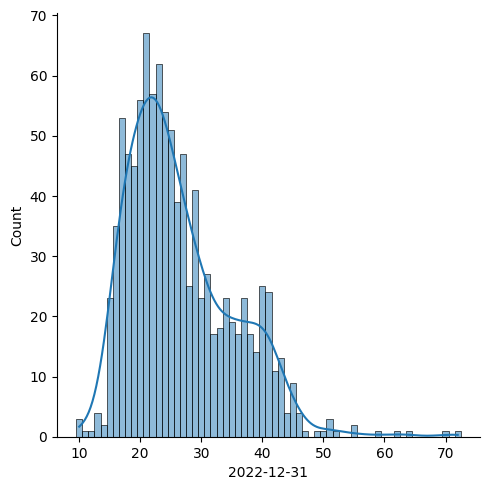

In [112]:
sns.displot(
    df1, x='2022-12-31',discrete = True , kde=True
    )


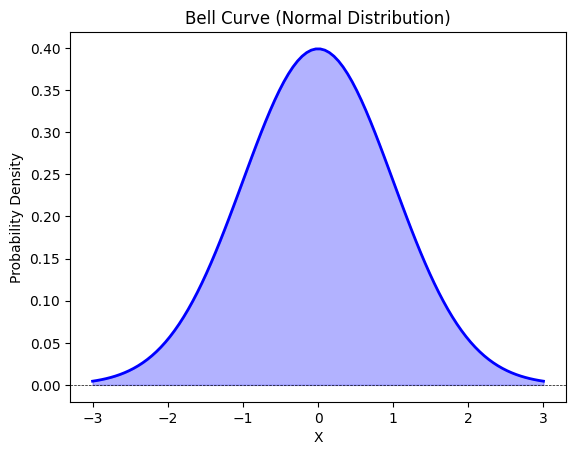

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# Generate data for the bell curve
mu = 0  # mean
sigma = 1  # standard deviation
x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
y = np.exp(-(x - mu)**2 / (2 * sigma**2)) / (sigma * np.sqrt(2 * np.pi))

# Create the bell curve plot
plt.plot(x, y, color='blue', linewidth=2)
plt.plot(0,0.20, color = 'black')

# Draw the line at y=0
plt.axhline(y=0, color='black', linestyle='--', linewidth=0.5)

# Fill the area under the curve
plt.fill_between(x, 0, y, where=(y >= 0), color='blue', alpha=0.3)

# Add labels and title
plt.xlabel('X')
plt.ylabel('Probability Density')
plt.title('Bell Curve (Normal Distribution)')

# Display the plot
plt.show()


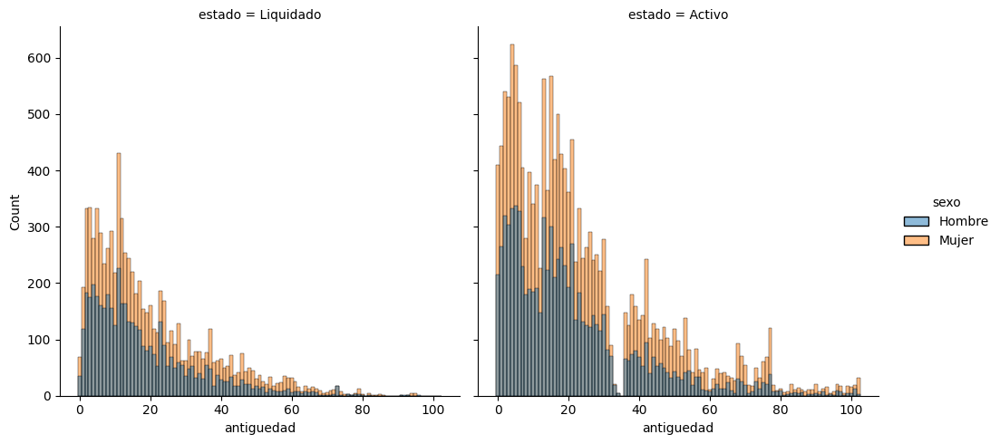

In [143]:
demo_df = S_df.loc[S_df['edad'] < 100]

sns.displot(
    demo_df, x='antiguedad', discrete = True, col='estado', hue='sexo'
    )
#, col="sexo", hue='estado'

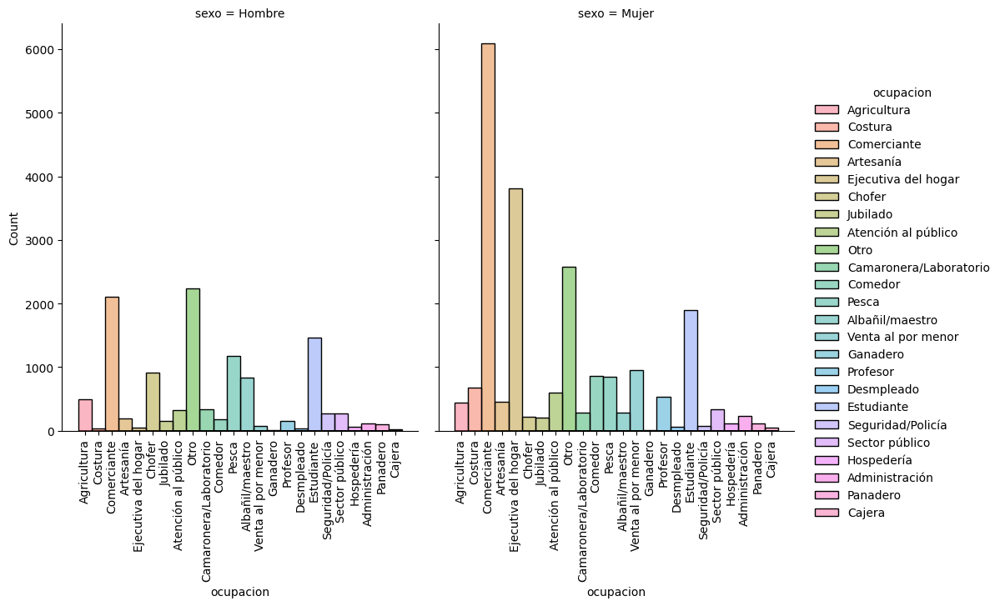

In [200]:
demo_df = S_df.loc[S_df['edad'] < 100]

g=sns.displot(
    demo_df, x='ocupacion', discrete = True, col='sexo',hue="ocupacion"
    )

g.set_xticklabels(rotation=90)

#, col="sexo", hue='estado'
g.figure.set_size_inches(12, 6)
#g.set_axis_labels(labelpad=10)




In [150]:
demo_F= S_df.loc[S_df['sexo'] == 'Mujer']
demo_H= S_df.loc[S_df['sexo'] == 'Hombre']

F_S_df = CustomDataFrame(demo_F.groupby(['ocupacion'], as_index=False)['cliente_id'].count())
H_S_df = CustomDataFrame(demo_H.groupby(['ocupacion'], as_index=False)['cliente_id'].count())

In [172]:
#F_S_df = F_S_df.tolist(include_columns=True)
H_S_df = H_S_df.tolist(include_columns=True)
my_array = [1, 2, 3, 4, 5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

lab_F=[]
lab_H=[]

weight_F=[]
weight_H=[]

for i in F_S_df[1]:
  lab_F.append(i[0])
  weight_F.append(i[1])

for i in H_S_df[1]:
  lab_H.append(i[0])
  weight_H.append(i[1])


# Tabla Balance

## Tabla pago creditos

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive', force_remount=True)
#path = '/content/drive/MyDrive/TFM/datos_csv/tabla_pagos_3.csv'
#with open(path, 'w', encoding = 'utf-8-sig') as f:
  #tabla_pagos.to_csv(f)

Mounted at /content/drive


In [ ]:
#, delimiter = ';',na_values={'',' '}, decimal=',', parse_dates=['fecha_aporte']
tab_pagos = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/tabla_pagos_3.csv', parse_dates=['Fecha del Periodo']))
tab_pagos['Fecha del Periodo'] = pd.to_datetime(tab_pagos['Fecha del Periodo']).dt.normalize()

In [ ]:
# Definimos las variables del crédito
monto = 100000
interes_periodo = 0.01
num_periodos = 12
credito_id = 1
cliente_id = 66
grupo_id = 4

# Calculamos la cuota mensual
cuota = round((monto * interes_periodo) / (1 - (1 + interes_periodo)**(-num_periodos)),2)

# Creamos una lista con los periodos
periodos = list(range(1, num_periodos + 1))

# Creamos una lista vacía para almacenar los datos de los pagos
pagos = []

# Calculamos los datos de cada pago y los agregamos a la lista
saldo_pendiente = monto
for periodo in periodos:
    interes = round(saldo_pendiente * interes_periodo,2)
    amortizacion = round(cuota - interes,2)
    saldo_pendiente -= round(amortizacion,2)
    pagos.append([credito_id, cliente_id, grupo_id, periodo, cuota, interes, amortizacion, saldo_pendiente])

# Creamos un DataFrame con los datos de los pagos
columnas = ['credito_id','cliente_id','grupo_id','Periodo', 'Cuota', 'Interes', 'Amortizacion', 'Saldo Pendiente']
tabla_pagos = CustomDataFrame(pd.DataFrame(pagos, columns=columnas))

# Mostramos la tabla de pagos
print(tabla_pagos)

In [ ]:
C_df.head(1)

,credito_id,cliente_id,grupo_id,fecha_desembolso,monto,plazo,tasa_interes,capital_pendiente,finalidad,mora_activa,morosidad_dias,inicio_mora,rango_edad_cliente,porc_prest_total_tambo
0,1,66,4,2014-09-20,45.0,1,5.0,NaN,Negocio,No,NaN,NaT,30-39,0.000095


In [ ]:
#1:45 horas
# Creamos la tabla de pagos donde todos los valores se pegaran

tabla_pagos = CustomDataFrame(pd.DataFrame(columns=['credito_id', 'cliente_id', 'grupo_id','Periodo', 'Fecha del Periodo', 'Cuota', 'Interes', 'Amortizacion', 'Saldo Pendiente']))

df= CustomDataFrame(C_df)

df = df.tolist(include_columns=True)

for cred in df[1]:

  # Definimos las variables del crédito
  monto = cred[4]
  interes_periodo = cred[6]/100
  num_periodos = cred[5]
  credito_id = cred[0]
  cliente_id = cred[1]
  grupo_id = cred[2]
  fecha_desembolso = cred[3]
  inicio_mora = cred[11]
  fecha_periodo = fecha_desembolso 


  # Calculamos la cuota mensual
  if num_periodos > 0 and interes_periodo > 0: 
   cuota = (monto * interes_periodo) / (1 - (1 + interes_periodo)**(-num_periodos))
  elif num_periodos > 0 and interes_periodo == 0:
   cuota = monto/num_periodos
  else:
   cuota = 0

  cuota = round(cuota,2)

  # Creamos una lista con los periodos
  periodos = list(range(1, num_periodos + 1))

  # Creamos una lista vacía para almacenar los datos de los pagos
  pagos = []

  # Calculamos los datos de cada pago y los agregamos a la lista


  saldo_pendiente = monto
  for periodo in periodos:
   fecha_periodo = fecha_periodo + np.timedelta64(30, 'D')
   interes = round(saldo_pendiente * interes_periodo,2)
   amortizacion = round(cuota - interes,2)
   saldo_pendiente -= round(amortizacion,2)
   if fecha_periodo < inicio_mora or pd.isna(inicio_mora):
    df2 = pd.DataFrame([[credito_id, cliente_id, grupo_id, periodo, fecha_periodo, cuota, interes, amortizacion, saldo_pendiente]] , columns=['credito_id','cliente_id','grupo_id','Periodo', 'Fecha del Periodo', 'Cuota', 'Interes', 'Amortizacion', 'Saldo Pendiente'])
    tabla_pagos=pd.concat([tabla_pagos,df2])


#C_df= CustomDataFrame(pd.DataFrame(C_df[1], columns=C_df[0])) 

# Mostramos la tabla de pagos
#print(tabla_pagos)

In [ ]:
# el bueno que tarda 1 hora y 5 min
# Crear el DataFrame base con las columnas necesarias
tabla_pagos = pd.DataFrame(columns=['credito_id', 'cliente_id', 'grupo_id','Periodo', 'Fecha del Periodo', 'Cuota', 'Interes', 'Amortizacion'])

df= CustomDataFrame(C_df)

df = df.tolist(include_columns=True)

# Iterar sobre cada crédito
for cred in df[1]:
  # Definir las variables del crédito
  monto = cred[4]
  interes_periodo = cred[6]/100
  num_periodos = cred[5]
  credito_id = cred[0]
  cliente_id = cred[1]
  grupo_id = cred[2]
  fecha_desembolso = cred[3]
  inicio_mora = cred[11]
  fecha_periodo = fecha_desembolso 

  # Calcular la cuota mensual
  if num_periodos > 0 and interes_periodo > 0: 
    cuota = (monto * interes_periodo) / (1 - (1 + interes_periodo)**(-num_periodos))
  elif num_periodos > 0 and interes_periodo == 0:
    cuota = monto/num_periodos
  else:
    cuota = 0

  cuota = round(cuota, 2)

  # Crear una lista con los periodos
  periodos = list(range(1, num_periodos + 1))

  # Crear una lista de pagos con comprensión de lista
  pagos = [[credito_id, cliente_id, grupo_id, periodo, fecha_periodo + np.timedelta64(1 * periodo, 'M'), cuota, round((monto - (cuota - monto * interes_periodo) * (periodo - 1)) * interes_periodo, 2), round(cuota - ((monto - (cuota - monto * interes_periodo) * (periodo - 1)) * interes_periodo), 2)] for periodo in periodos]

  # Filtrar los pagos según si están en mora o no
  if not pd.isna(inicio_mora):
    pagos = [pago for pago in pagos if pago[4] < inicio_mora]

  # Agregar los pagos a la tabla de pagos
  tabla_pagos = pd.concat([tabla_pagos, pd.DataFrame(pagos, columns=tabla_pagos.columns)])

# Convertir la tabla_pagos a un objeto CustomDataFrame si se desea
tabla_pagos = CustomDataFrame(tabla_pagos)


In [ ]:
#C_df.loc[C_df['morosidad_dias'] > 0].head(30)
C_df.loc[C_df['credito_id'] == 854	]

,credito_id,cliente_id,grupo_id,fecha_desembolso,monto,plazo,tasa_interes,capital_pendiente,finalidad,mora_activa,morosidad_dias,inicio_mora,rango_edad_cliente,porc_prest_total_tambo,mes_aporte,fecha,primera_compra,year_primer_credito
853,854,355,18,2015-05-06,694.8,10,3.0,NaN,Negocio,No,35.0,2015-09-02,30-39,0.003216,2015-05,2015-05-06,2014-12-03,2014


In [ ]:
tabla_pagos.loc[tabla_pagos['credito_id'] == 854	]

,credito_id,cliente_id,grupo_id,Periodo,Fecha del Periodo,Cuota,Interes,Amortizacion
0,854,355,18,1,2015-06-05 10:29:06,81.45,20.84,60.61
1,854,355,18,2,2015-07-05 20:58:12,81.45,19.03,62.42
2,854,355,18,3,2015-08-05 07:27:18,81.45,17.21,64.24


In [ ]:
tabla_pagos

,Unnamed: 0.1,Unnamed: 0,credito_id,cliente_id,grupo_id,Periodo,Fecha del Periodo,Cuota,Interes,Amortizacion,Saldo Pendiente
0,0,0,1,66,4,1,2014-10-20,47.25,2.25,45.00,0.00
1,1,0,2,62,4,1,2014-10-20,52.50,2.50,50.00,0.00
2,2,0,3,63,4,1,2014-10-20,52.50,2.50,50.00,0.00
3,3,0,4,71,4,1,2014-10-20,52.50,2.50,50.00,0.00
4,4,0,5,82,3,1,2014-11-08,84.00,4.00,80.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...
1109367,395811,1,167488,14858,288,2,2023-05-24,78.81,20.00,58.81,282.38
1109368,395812,2,167488,14858,288,3,2023-06-23,78.81,20.00,58.81,223.57
1109369,395813,3,167488,14858,288,4,2023-07-23,78.81,20.00,58.81,164.76
1109370,395814,4,167488,14858,288,5,2023-08-22,78.81,20.00,58.81,105.95


In [ ]:
tab_pagos

,Unnamed: 0,credito_id,cliente_id,grupo_id,Periodo,Fecha del Periodo,Cuota,Interes,Amortizacion
0,0,1,66,4,1,2014-10-20 10:29:06,47.25,2.25,45.00
1,0,2,62,4,1,2014-10-20 10:29:06,52.50,2.50,50.00
2,0,3,63,4,1,2014-10-20 10:29:06,52.50,2.50,50.00
3,0,4,71,4,1,2014-10-20 10:29:06,52.50,2.50,50.00
4,0,5,82,3,1,2014-11-08 10:29:06,84.00,4.00,80.00
...,...,...,...,...,...,...,...,...,...
1088789,1,167488,14858,288,2,2023-05-24 20:58:12,78.81,17.06,61.75
1088790,2,167488,14858,288,3,2023-06-24 07:27:18,78.81,14.12,64.69
1088791,3,167488,14858,288,4,2023-07-24 17:56:24,78.81,11.18,67.63
1088792,4,167488,14858,288,5,2023-08-24 04:25:30,78.81,8.24,70.57


In [ ]:
# Supongamos que quieres cortar a partir del credito_id = 3
credito_id_corte = 118213

# Obtén el índice donde se encuentra el credito_id de corte
idx = C_df.index[C_df['credito_id'] == credito_id_corte][0]

# Crea una nueva tabla con los registros posteriores al credito_id de corte
C_df_cortada = C_df.iloc[idx:]


In [ ]:
C_df_cortada

,credito_id,cliente_id,grupo_id,fecha_desembolso,monto,plazo,tasa_interes,capital_pendiente,finalidad,mora_activa,morosidad_dias,inicio_mora,rango_edad_cliente,porc_prest_total_tambo
118212,118213,19497,638,2022-03-18,50.0,2,5.0,NaN,Negocio,No,NaN,NaT,<NA>,0.000000
118213,118214,19491,638,2022-03-18,416.6,3,5.0,NaN,Negocio,No,NaN,NaT,<NA>,0.000000
118214,118215,19500,638,2022-03-18,250.0,3,5.0,NaN,Negocio,No,NaN,NaT,<NA>,0.000000
118215,118216,30395,638,2022-03-18,100.0,6,5.0,NaN,Negocio,No,NaN,NaT,<NA>,0.000000
118216,118217,20440,550,2022-03-19,300.0,6,5.0,NaN,Vivienda,No,NaN,NaT,30-39,0.003200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167483,167484,39912,1174,2023-03-26,150.0,2,5.0,NaN,Negocio,No,NaN,NaT,50-59,0.044410
167484,167485,38965,1174,2023-03-26,210.0,4,5.0,NaN,Educación,No,NaN,NaT,18-29,0.062174
167485,167486,38959,1174,2023-03-26,360.0,6,5.0,NaN,Negocio,No,NaN,NaT,40-49,0.106585
167486,167487,23953,480,2023-03-26,792.8,6,5.0,NaN,Salud,No,NaN,NaT,50-59,0.008104


In [ ]:
#Aqui hacemos la segunda parte de la tabla_pagos

# Crear el DataFrame base con las columnas necesarias
tabla_pagos = pd.DataFrame(columns=['credito_id', 'cliente_id', 'grupo_id','Periodo', 'Fecha del Periodo', 'Cuota', 'Interes', 'Amortizacion', 'Saldo Pendiente'])

df= CustomDataFrame(C_df_cortada)

df = df.tolist(include_columns=True)

# Iterar sobre cada crédito
for cred in df[1]:
  # Definir las variables del crédito
  monto = cred[4]
  interes_periodo = cred[6]/100
  num_periodos = cred[5]
  credito_id = cred[0]
  cliente_id = cred[1]
  grupo_id = cred[2]
  fecha_desembolso = cred[3]
  inicio_mora = cred[11]
  fecha_periodo = fecha_desembolso 

  # Calcular la cuota mensual
  if num_periodos > 0 and interes_periodo > 0: 
    cuota = (monto * interes_periodo) / (1 - (1 + interes_periodo)**(-num_periodos))
  elif num_periodos > 0 and interes_periodo == 0:
    cuota = monto/num_periodos
  else:
    cuota = 0

  cuota = round(cuota, 2)

  # Crear una lista con los periodos
  periodos = list(range(1, num_periodos + 1))

  # Crear una lista de pagos con comprensión de lista
  pagos = [[credito_id, cliente_id, grupo_id, periodo, fecha_periodo + np.timedelta64(30 * periodo, 'D'), cuota, round(monto * interes_periodo, 2), round(cuota - monto * interes_periodo, 2), round(monto - (cuota - monto * interes_periodo) * periodo, 2)] for periodo in periodos]

  # Filtrar los pagos según si están en mora o no
  if not pd.isna(inicio_mora):
    pagos = [pago for pago in pagos if pago[4] < inicio_mora]

  # Agregar los pagos a la tabla de pagos
  tabla_pagos = pd.concat([tabla_pagos, pd.DataFrame(pagos, columns=tabla_pagos.columns)])

# Convertir la tabla_pagos a un objeto CustomDataFrame si se desea
tabla_pagos = CustomDataFrame(tabla_pagos)


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
path = '/content/drive/MyDrive/TFM/datos_csv/tabla_pagos_2.csv'
with open(path, 'w', encoding = 'utf-8-sig') as f:
  tabla_pagos.to_csv(f)

Mounted at /content/drive


In [ ]:
tab_pagos2 = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/tabla_pagos_2.csv'))

In [ ]:
tabla_pagos = pd.concat([tab_pagos,tab_pagos2])

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive', force_remount=True)
#path = '/content/drive/MyDrive/TFM/datos_csv/tabla_pagos.csv'
#with open(path, 'w', encoding = 'utf-8-sig') as f:
 # tabla_pagos.to_csv(f)

Mounted at /content/drive


In [ ]:
tabla_pagos = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/tabla_pagos.csv'))
tabla_pagos

,Unnamed: 0.1,Unnamed: 0,credito_id,cliente_id,grupo_id,Periodo,Fecha del Periodo,Cuota,Interes,Amortizacion,Saldo Pendiente
0,0,0,1,66,4,1,2014-10-20,47.25,2.25,45.00,0.00
1,1,0,2,62,4,1,2014-10-20,52.50,2.50,50.00,0.00
2,2,0,3,63,4,1,2014-10-20,52.50,2.50,50.00,0.00
3,3,0,4,71,4,1,2014-10-20,52.50,2.50,50.00,0.00
4,4,0,5,82,3,1,2014-11-08,84.00,4.00,80.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...
1109367,395811,1,167488,14858,288,2,2023-05-24,78.81,20.00,58.81,282.38
1109368,395812,2,167488,14858,288,3,2023-06-23,78.81,20.00,58.81,223.57
1109369,395813,3,167488,14858,288,4,2023-07-23,78.81,20.00,58.81,164.76
1109370,395814,4,167488,14858,288,5,2023-08-22,78.81,20.00,58.81,105.95


In [ ]:
C_df

,credito_id,cliente_id,grupo_id,fecha_desembolso,monto,plazo,tasa_interes,capital_pendiente,finalidad,mora_activa,morosidad_dias,inicio_mora,rango_edad_cliente,porc_prest_total_tambo
0,1,66,4,2014-09-20,45.0,1,5.0,NaN,Negocio,No,NaN,NaT,30-39,0.000095
1,2,62,4,2014-09-20,50.0,1,5.0,NaN,Negocio,No,NaN,NaT,60-69,0.000105
2,3,63,4,2014-09-20,50.0,1,5.0,NaN,Negocio,No,NaN,NaT,40-49,0.000105
3,4,71,4,2014-09-20,50.0,1,5.0,NaN,Negocio,No,NaN,NaT,40-49,0.000105
4,5,82,3,2014-10-09,80.0,1,5.0,NaN,Negocio,No,NaN,NaT,50-59,0.000331
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167483,167484,39912,1174,2023-03-26,150.0,2,5.0,NaN,Negocio,No,NaN,NaT,50-59,0.044410
167484,167485,38965,1174,2023-03-26,210.0,4,5.0,NaN,Educación,No,NaN,NaT,18-29,0.062174
167485,167486,38959,1174,2023-03-26,360.0,6,5.0,NaN,Negocio,No,NaN,NaT,40-49,0.106585
167486,167487,23953,480,2023-03-26,792.8,6,5.0,NaN,Salud,No,NaN,NaT,50-59,0.008104


In [ ]:
df=CustomDataFrame(C_df)

def calculate_payment(row):
  # Definimos las variables del crédito
  monto = row['monto']
  interes_periodo = row['tasa_interes']/100
  num_periodos = row['plazo']
  credito_id = row['credito_id']
  cliente_id = row['cliente_id']
  grupo_id = row['grupo_id']
  fecha_desembolso = row['fecha_desembolso']
  inicio_mora = row['inicio_mora']
  fecha_periodo = fecha_desembolso 

  # Calculamos la cuota mensual
  if num_periodos > 0 and interes_periodo > 0: 
    cuota = (monto * interes_periodo) / (1 - (1 + interes_periodo)**(-num_periodos))
  elif num_periodos > 0 and interes_periodo == 0:
    cuota = monto/num_periodos
  else:
    cuota = 0

  cuota = round(cuota,2)

  # Creamos una lista con los periodos
  periodos = list(range(1, num_periodos + 1))

  # Calculamos los datos de cada pago y los agregamos a la lista
  saldo_pendiente = monto
  payments = []
  for periodo in periodos:
    fecha_periodo += pd.DateOffset(months=1)
    interes = round(saldo_pendiente * interes_periodo,2)
    amortizacion = round(cuota - interes,2)
    saldo_pendiente -= round(amortizacion,2)
    if fecha_periodo < inicio_mora or pd.isna(inicio_mora):
      payment = [credito_id, cliente_id, grupo_id, periodo, fecha_periodo, cuota, interes, amortizacion, saldo_pendiente]
      payments.append(payment)
  
  # Retornamos los pagos como un DataFrame
  return pd.DataFrame(payments, columns=['credito_id', 'cliente_id', 'grupo_id','Periodo', 'Fecha del Periodo', 'Cuota', 'Interes', 'Amortizacion', 'Saldo Pendiente'])


tab_pagos = pd.concat(df.apply(calculate_payment, axis=1).tolist())


In [ ]:
t_pagos = pd.DataFrame(columns=['credito_id', 'cliente_id', 'grupo_id','Periodo', 'Fecha del Periodo', 'Cuota', 'Interes', 'Amortizacion', 'Saldo Pendiente'])

for _, cred in C_df.iterrows():
    pagos = calculate_payment(cred)
    t_pagos = t_pagos.append(pagos, ignore_index=True)



## Resto

In [ ]:
A_df.head()

,cliente_id,grupo_id,monto,fecha_aporte
0,82,3,10.0,2014-09-18
1,83,3,5.0,2014-09-18
2,84,3,10.0,2014-09-18
3,85,3,5.0,2014-09-18
4,86,3,5.0,2014-09-18


In [ ]:
A_df['mes_aporte'] = A_df['fecha_aporte'].dt.to_period('M')
dfA = CustomDataFrame(A_df.groupby(['cliente_id','mes_aporte'], as_index = False)['monto'].sum())
dfA

,cliente_id,mes_aporte,monto
0,1,2014-10,20.0
1,1,2015-01,-20.0
2,2,2014-10,20.0
3,2,2014-12,10.0
4,2,2015-01,10.0
...,...,...,...
764464,43622,2023-03,15.0
764465,43623,2023-03,15.0
764466,43624,2023-03,30.0
764467,43625,2023-03,10.0


In [ ]:
tab_pagos

,Unnamed: 0,credito_id,cliente_id,grupo_id,Periodo,Fecha del Periodo,Cuota,Interes,Amortizacion
0,0,1,66,4,1,2014-10-20,47.25,2.25,45.00
1,0,2,62,4,1,2014-10-20,52.50,2.50,50.00
2,0,3,63,4,1,2014-10-20,52.50,2.50,50.00
3,0,4,71,4,1,2014-10-20,52.50,2.50,50.00
4,0,5,82,3,1,2014-11-08,84.00,4.00,80.00
...,...,...,...,...,...,...,...,...,...
1088789,1,167488,14858,288,2,2023-05-24,78.81,17.06,61.75
1088790,2,167488,14858,288,3,2023-06-24,78.81,14.12,64.69
1088791,3,167488,14858,288,4,2023-07-24,78.81,11.18,67.63
1088792,4,167488,14858,288,5,2023-08-24,78.81,8.24,70.57


In [ ]:
tabla_balance

,cliente_id,mes_aporte,monto_entrada,monto_salida,Cuota,balance_mensual,grupo_id,fecha,primer_balance,year_primer_balance
0,1,2014-10-01,20.0,NaN,NaN,20.00,1,2014-10-01,2014-10-01,2014
1,1,2015-01-01,-20.0,NaN,NaN,-20.00,1,2015-01-01,2014-10-01,2014
2,2,2014-10-01,20.0,NaN,NaN,20.00,1,2014-10-01,2014-10-01,2014
3,2,2014-12-01,10.0,NaN,NaN,10.00,1,2014-12-01,2014-10-01,2014
4,2,2015-01-01,10.0,NaN,NaN,10.00,1,2015-01-01,2014-10-01,2014
...,...,...,...,...,...,...,...,...,...,...
1013541,42832,2023-03-01,NaN,NaN,10.40,10.40,1282,2023-03-01,2023-02-01,2023
1013544,42844,2023-03-01,NaN,NaN,22.60,22.60,1281,2023-03-01,2023-02-01,2023
1013568,42847,2023-03-01,NaN,NaN,46.35,46.35,1281,2023-03-01,2023-02-01,2023
1013570,42853,2023-03-01,NaN,NaN,22.60,22.60,1281,2023-03-01,2023-02-01,2023


In [ ]:
tab_pagos['mes_aporte'] = tab_pagos['Fecha del Periodo'].dt.to_period('M')
dfC = CustomDataFrame(tab_pagos.groupby(['cliente_id','mes_aporte'], as_index = False)['Amortizacion'].sum())
dfC.drop_duplicates()
dfC

,cliente_id,mes_aporte,Amortizacion
0,2,2015-03,49.02
1,2,2015-04,50.98
2,2,2015-07,100.00
3,2,2015-11,49.02
4,2,2015-12,50.98
...,...,...,...
776049,43617,2023-07,11.58
776050,43618,2023-04,32.75
776051,43618,2023-05,33.41
776052,43618,2023-06,34.06


In [ ]:
C_df['mes_aporte'] = C_df['fecha_desembolso'].dt.to_period('M')

In [ ]:
dfB = CustomDataFrame(C_df.groupby(['cliente_id','mes_aporte'], as_index = False)['monto'].sum())
dfB

,cliente_id,mes_aporte,monto
0,2,2015-02,100.0
1,2,2015-06,100.0
2,2,2015-10,100.0
3,2,2016-02,100.0
4,2,2016-06,300.0
...,...,...,...
167026,43554,2023-03,100.0
167027,43561,2023-03,68.0
167028,43611,2023-03,45.0
167029,43617,2023-03,45.0


In [ ]:
C_df

,cliente_id,grupo_id,fecha_desembolso,monto,plazo,tasa_interes,capital_pendiente,finalidad,mora_activa,morosidad_dias,inicio_mora,rango_edad_cliente,porc_prest_total_tambo
0,66,4,2014-09-20,45.0,1,5.0,NaN,Negocio,No,NaN,NaT,30-39,0.000095
1,62,4,2014-09-20,50.0,1,5.0,NaN,Negocio,No,NaN,NaT,60-69,0.000105
2,63,4,2014-09-20,50.0,1,5.0,NaN,Negocio,No,NaN,NaT,40-49,0.000105
3,71,4,2014-09-20,50.0,1,5.0,NaN,Negocio,No,NaN,NaT,40-49,0.000105
4,82,3,2014-10-09,80.0,1,5.0,NaN,Negocio,No,NaN,NaT,50-59,0.000331
...,...,...,...,...,...,...,...,...,...,...,...,...,...
167483,39912,1174,2023-03-26,150.0,2,5.0,NaN,Negocio,No,NaN,NaT,50-59,0.044410
167484,38965,1174,2023-03-26,210.0,4,5.0,NaN,Educación,No,NaN,NaT,18-29,0.062174
167485,38959,1174,2023-03-26,360.0,6,5.0,NaN,Negocio,No,NaN,NaT,40-49,0.106585
167486,23953,480,2023-03-26,792.8,6,5.0,NaN,Salud,No,NaN,NaT,50-59,0.008104


In [ ]:
df2

,credito_id,cliente_id,grupo_id,Periodo,Fecha del Periodo,Cuota,Interes,Amortizacion,Saldo Pendiente
0,1,66,4,1,2014-10-20,47.25,2.25,45.00,0.00
1,2,62,4,1,2014-10-20,52.50,2.50,50.00,0.00
2,3,63,4,1,2014-10-20,52.50,2.50,50.00,0.00
3,4,71,4,1,2014-10-20,52.50,2.50,50.00,0.00
4,5,82,3,1,2014-11-08,84.00,4.00,80.00,0.00
...,...,...,...,...,...,...,...,...,...
2398,1107,56,4,4,2015-10-20,141.01,6.71,134.30,-0.02
2399,1108,59,4,1,2015-07-22,32.27,3.00,29.27,30.73
2400,1108,59,4,2,2015-08-21,32.27,1.54,30.73,0.00
2401,1109,62,4,1,2015-07-22,188.23,17.50,170.73,179.27


In [ ]:
tabla_pagos = CustomDataFrame(df2)
tabla_pagos

,credito_id,cliente_id,grupo_id,Periodo,Fecha del Periodo,Cuota,Interes,Amortizacion,Saldo Pendiente
0,1,66,4,1,2014-10-20,47.25,2.25,45.00,0.00
1,2,62,4,1,2014-10-20,52.50,2.50,50.00,0.00
2,3,63,4,1,2014-10-20,52.50,2.50,50.00,0.00
3,4,71,4,1,2014-10-20,52.50,2.50,50.00,0.00
4,5,82,3,1,2014-11-08,84.00,4.00,80.00,0.00
...,...,...,...,...,...,...,...,...,...
230288,50300,10399,108,7,2020-05-31,68.43,43.87,24.56,852.82
230289,50300,10399,108,8,2020-06-30,68.43,42.64,25.79,827.03
230290,50300,10399,108,9,2020-07-30,68.43,41.35,27.08,799.95
230291,50300,10399,108,10,2020-08-29,68.43,40.00,28.43,771.52


In [ ]:
type(tabla_pagos['Fecha del Periodo'].values[0])

str

In [40]:
import pandas as pd

# Creamos los DataFrames de ejemplo

df1 = dfA

df2 = dfB



# Unimos los DataFrames df1 y df2 en df3, utilizando las columnas periodo y cliente_id como clave
df3 = CustomDataFrame(pd.merge(df1, df2, on=['mes_aporte', 'cliente_id'], suffixes=('_entrada', '_salida'), how='outer'))

#df_balance = CustomDataFrame(pd.merge(df3, tab_pagos, on=['mes_aporte', 'cliente_id'], suffixes=('X', 'Y'), how='outer'))

#df_balance['balance_mensual'] = df_balance['monto_entrada'].fillna(0) - df_balance['monto_salida'].fillna(0) + df_balance['Amortizacion'].fillna(0)

#df1.merge(df2, left_on='lkey', right_on='rkey')


#tabla_pagos['mes_aporte'] = tabla_pagos['Fecha del Periodo'].to_period('M')
df_balance = df3.merge(dfC, on=['cliente_id', 'mes_aporte'], how='outer')

# Calculamos la columna de balance
df_balance['balance'] = df_balance['Amortizacion'].fillna(0) + df_balance['monto_entrada'].fillna(0) - df_balance['monto_salida'].fillna(0)

# Integramos la columna grupo_id a df3 utilizando la columna cliente_id como clave
#df_balance = pd.merge(df_balance, C_df[['cliente_id', 'grupo_id']], on='cliente_id')



# Mostramos el resultado
df_balance

NameError: ignored

In [ ]:
# 12 min
df_balance = CustomDataFrame(df_balance)
df_balance['grupo_id'] = CustomDataFrame(pd.Series(dtype='int'))
df_balance = df_balance.tolist(include_columns=True)


for mov in df_balance[1]:
 if (S_df["cliente_id"] == mov[0]).any():
  mov[-1] = S_df.loc[S_df['cliente_id'] == mov[0]].grupo_id.values[0]

df_balance= CustomDataFrame(pd.DataFrame(df_balance[1], columns=df_balance[0]))

*Explicación del cuadro de codigo de abajo, sugerido por ChatGPT*:

Aquí hemos creado una función llamada add_grupo_id que toma una fila del dataframe de **df_balance** y la serie de **S_df** como entrada, y devuelve la fila actualizada con el grupo_id correspondiente si se encuentra una coincidencia en el cliente_id.

Luego, convertimos la lista de registros de df_balance en una lista de filas utilizando el método tolist() y lo almacenamos en df_balance. A continuación, creamos una serie de **S_df** indexada por cliente_id para acelerar la búsqueda.

Finalmente, aplicamos la función add_grupo_id a cada fila de la columna 1 de la lista df_balance utilizando el método **apply()** de pandas. La función add_grupo_id actualiza el valor del último elemento de la fila, es decir, el valor de grupo_id, si se encuentra una coincidencia en cliente_id. Luego, convertimos la lista de registros actualizada de df_balance en un DataFrame utilizando la clase CustomDataFrame.

In [ ]:
def add_grupo_id(mov, s_df):
    if (s_df["cliente_id"] == mov[0]).any():
        mov[-1] = s_df.loc[s_df['cliente_id'] == mov[0]].grupo_id.values[0]
    return mov

df_balance = CustomDataFrame(df_balance)
df_balance['grupo_id'] = CustomDataFrame(pd.Series(dtype='int'))
df_balance = df_balance.tolist(include_columns=True)

s_df = S_df.set_index('cliente_id')

df_balance[1] = df_balance[1].apply(lambda mov: add_grupo_id(mov, s_df))

df_balance = CustomDataFrame(pd.DataFrame(df_balance[1], columns=df_balance[0]))


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
path = '/content/drive/MyDrive/TFM/datos_csv/tabla_balance_v2.csv'
with open(path, 'w', encoding = 'utf-8-sig') as f:
  df_balance.to_csv(f)

Mounted at /content/drive


In [ ]:
tabla_balance.loc[tabla_balance['grupo_id'] > 1]

,cliente_id,mes_aporte,monto_entrada,monto_salida,Cuota,balance_mensual,grupo_id
1614,56,2014-09-01,10.0,NaN,NaN,10.00,4.0
1615,56,2014-10-01,80.0,100.0,NaN,-20.00,4.0
1616,56,2014-11-01,10.0,100.0,105.00,15.00,4.0
1617,56,2014-12-01,10.0,200.0,105.00,-85.00,4.0
1618,56,2015-01-01,15.0,361.6,210.00,-136.60,4.0
...,...,...,...,...,...,...,...
1013541,42832,2023-03-01,NaN,NaN,10.40,10.40,1282.0
1013544,42844,2023-03-01,NaN,NaN,22.60,22.60,1281.0
1013568,42847,2023-03-01,NaN,NaN,46.35,46.35,1281.0
1013570,42853,2023-03-01,NaN,NaN,22.60,22.60,1281.0


In [ ]:
S_df.loc[S_df['cliente_id'] == 3876]

,cliente_id,grupo_id,apellidos,sexo,edad,rango_edad,ocupacion,estado,antiguedad,fecha_alta,fecha_baja,ahorro,years_en_tambo,num_prestamo,total_prestamo,moroso,ahorro_tambo,porc_ahorr_en_grupo,personas_en_tambo,prestamo_tambo
1492,3876,174,Carvajal Ramos,Mujer,60,60-69,Costura,Activo,76.0,2016-10-28,NaT,555,6.0,13.0,4674.0,No,38755,0.014321,56,337595.36


In [ ]:
df_balance.loc[df_balance['cliente_id'] == 2]

In [ ]:
df_balance.groupby(['mes_aporte'], as_index = False )['balance_mensual'].sum()

In [ ]:
dfC.loc[dfC['cliente_id'] == 2]

In [ ]:
dfC.loc[dfC['cliente_id'] == 2]

In [ ]:
df3

In [ ]:
df3['fecha'] = df3['mes_aporte'].apply(lambda x: x.to_timestamp())
df3

In [ ]:
df3.loc[(df3['monto_entrada']>0) & (df3['monto_salida']>0)]

In [ ]:
df3.loc[df3['cliente_id'] == 2].mes_aporte.values[0]

Period('2014-10', 'M')

In [ ]:
df3.groupby(['cliente_id'])['balance'].sum()

In [ ]:
#analisis = C_df.filter(['finalidad'])
#analisis = T_df.filter(['ahorro_total','familiaridad_en_tambo','personas_en_tambo','confianza_A','confianza_A_1', 'localidad' , 'porc_creditos_en_mora','confianza_B','confianza_B_1', 'confianza_T','confianza_T_1', 'confianza_T_m' ], axis=1)
#analisis = T_df.filter(['confianza_T_dias','confianza_T_meses','confianza_T_anos', 'conf_T_anos', 'conf_T_anos_2','confianza_T_anos_1','confianza_T_anos_2','familiaridad_en_tambo', 'personas_en_tambo','tiempo_en_comun_years',  'localidad', 'oficina_superior', 'antiguedad_tambo_anos' ], axis=1)
analisis = tabla_balance
#analisis = T_df.filter(['ahorro_total', 'prestado_total'], axis=1)

profile = ProfileReport(analisis,title='Mi Reporte')
profile

# Análisis Cohorte

In [ ]:
T_df.antiguedad_tambo_anos

0       8.0
1       8.0
2       8.0
3       8.0
4       8.0
       ... 
1222    0.0
1223    0.0
1224    0.0
1225    0.0
1226    0.0
Name: antiguedad_tambo_anos, Length: 1227, dtype: float64

In [ ]:
#df_co 

#T_df.groupby([df['fecha_creacion'].dt.year , df['fecha_baja'].dt.year]).count()

df_co = CustomDataFrame(T_df.filter(['grupo_id','fecha_creacion', 'fecha_baja','antiguedad_tambo_anos','estado']))

df_co.fecha_creacion = df_co.fecha_creacion.dt.year
df_co.fecha_baja = df_co.fecha_baja.dt.year


################################################################## Crear indice para analisis de cohorte


df_co

#T_df.groupby(T_df.fecha_creacion.dt.year)

,grupo_id,fecha_creacion,fecha_baja,antiguedad_tambo_anos,estado
0,3,2014,NaN,8.0,Activo
1,7,2014,NaN,8.0,Activo
2,4,2014,NaN,8.0,Activo
3,2,2014,NaN,8.0,Activo
4,1,2014,NaN,8.0,Activo
...,...,...,...,...,...
1222,1304,2023,NaN,0.0,Activo
1223,1305,2023,NaN,0.0,Activo
1224,1306,2023,NaN,0.0,Activo
1225,1309,2023,NaN,0.0,Activo


In [ ]:
T_df.loc[(np.datetime64('2015-01-01') < T_df['fecha_creacion']) & (T_df['fecha_baja'] > np.datetime64('2021-01-01')) & (T_df['fecha_creacion'] < np.datetime64('2017-01-01'))]

,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad,ahorro_total,prestado_total,personas_en_tambo,antiguedad_tambo_anos
42,81,2015-10-16,2021-12-04,Liquidado,SANTA ELENA,Rural,0,0.0,0,6.0
56,125,2016-04-29,2021-07-31,Liquidado,SANTA ELENA,Periurbano,0,0.0,0,5.0
81,151,2016-10-10,2021-04-29,Liquidado,SANTA ELENA,Rural,0,0.0,0,4.0
88,161,2016-11-10,2021-03-11,Liquidado,SANTA ELENA,Rural,0,0.0,0,4.0
108,185,2016-12-06,2022-07-27,Liquidado,SANTA ELENA,Periurbano,0,0.0,0,5.0
111,187,2016-12-17,2021-01-29,Liquidado,SANTA ELENA,Rural,0,0.0,0,4.0


In [ ]:
df_co2 = 

for t in T_df[1]:
  t[0]=grupo_id
  grupo_id=81

  hist = 6
  while hist > 0
    

In [ ]:
df_p=C_df.loc[C_df['grupo_id'] == 81]

df_p['fecha_desembolso'] = df_p['fecha_desembolso'].dt.year  

df_p=CustomDataFrame(df_p.groupby(['grupo_id','fecha_desembolso'], as_index=False)['monto'].sum(), )

df_p

#.groupby(['fecha_desembolso']).count()

<ipython-input-80-df31ed5a82b2>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p['fecha_desembolso'] = df_p['fecha_desembolso'].dt.year


,grupo_id,fecha_desembolso,monto
0,81,2015,1039.80
1,81,2016,21253.28
2,81,2017,26780.32
3,81,2018,21184.65
4,81,2019,27192.83
5,81,2020,28916.79
6,81,2021,38604.28


In [ ]:
df_p['fecha_creacion'] = T_df.loc[T_df['grupo_id'] == 81].fecha_creacion.dt.year.values[0]

df_p['co_index'] = df_p['fecha_desembolso'] - df_p['fecha_creacion']

df_p

,grupo_id,fecha_desembolso,monto,fecha_creacion,co_index
0,81,2015,1039.80,2015,0
1,81,2016,21253.28,2015,1
2,81,2017,26780.32,2015,2
3,81,2018,21184.65,2015,3
4,81,2019,27192.83,2015,4
5,81,2020,28916.79,2015,5
6,81,2021,38604.28,2015,6


In [ ]:
T_df

,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad,ahorro_total,prestado_total,personas_en_tambo,antiguedad_tambo_dias,antiguedad_tambo_meses,antiguedad_tambo_anos,tiempo_en_comun_years,volumen_de_credito_sin_mora,volumen_de_credito_con_mora,montos_ex
0,3,2014-09-18,NaT,Activo,SANTA ELENA,Rural,31125,241562.12,63,3157.0,103.0,8.0,263.0,225935.43,17826.69,8
1,7,2014-09-19,NaT,Activo,SANTA ELENA,Rural,40710,294025.52,56,3156.0,103.0,8.0,212.0,282136.07,11889.45,23
2,4,2014-09-20,NaT,Activo,SANTA ELENA,Periurbano,70095,474206.34,72,3155.0,103.0,8.0,197.0,458230.45,16375.89,-2
3,2,2014-09-20,NaT,Activo,SANTA ELENA,Rural,18585,150833.69,61,3155.0,103.0,8.0,147.0,139823.64,11010.05,47
4,1,2014-10-01,NaT,Activo,CHIMBORAZO,Rural,66610,581202.38,92,3144.0,102.0,8.0,461.0,446043.75,135158.63,-4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1222,1304,2023-03-21,NaT,Activo,GUAYAS,Urbano,645,645.00,15,51.0,1.0,0.0,0.0,645.00,NaN,2
1223,1305,2023-03-21,NaT,Activo,LOJA,Urbano,375,375.00,14,51.0,1.0,0.0,0.0,375.00,NaN,2
1224,1306,2023-03-22,NaT,Activo,LOJA,Rural,510,515.00,20,50.0,1.0,0.0,0.0,515.00,NaN,2
1225,1309,2023-03-24,NaT,Activo,LOJA,Urbano,225,225.00,13,48.0,1.0,0.0,0.0,225.00,NaN,2


In [ ]:
C_df['vol_cred_sin_mora'] = np.where(np.isnan(C_df['morosidad_dias']), C_df['monto'], 0)
C_df.loc[C_df['vol_cred_sin_mora'] == 0]

,cliente_id,grupo_id,fecha_desembolso,monto,plazo,tasa_interes,capital_pendiente,finalidad,mora_activa,morosidad_dias,inicio_mora,fecha,primera_compra,year_primer_credito,vol_cred_sin_mora
218,369,1,2014-11-03,449.0,2,4.00000,NaN,Negocio,No,35.0,2014-12-01,2014-11-03,2014-10-01,2014,0.0
322,365,1,2015-01-05,400.0,4,4.00000,NaN,Negocio,No,35.0,2015-03-02,2015-01-05,2014-10-01,2014,0.0
325,19,1,2015-01-05,441.5,4,4.00000,NaN,Negocio,No,28.0,2015-04-06,2015-01-05,2014-11-03,2014,0.0
327,367,1,2015-01-05,400.0,4,4.00000,NaN,Negocio,No,28.0,2015-02-02,2015-01-05,2014-10-01,2014,0.0
396,28,1,2015-02-02,200.0,3,4.00000,NaN,Negocio,No,28.0,2015-04-06,2015-02-02,2015-02-02,2015,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161239,22893,248,2023-02-11,2107.0,24,4.00000,NaN,Negocio,Si,16.0,2023-03-11,2023-02-11,2021-07-10,2021,0.0
161385,31857,1008,2023-02-17,219.8,11,0.00001,NaN,Negocio,Si,17.0,2023-03-10,2023-02-17,2022-03-11,2022,0.0
161503,5714,230,2023-02-18,600.0,1,5.00000,NaN,Negocio,Si,8.0,2023-03-19,2023-02-18,2017-09-03,2017,0.0
162336,27231,228,2023-02-23,870.0,6,5.00000,NaN,Negocio,Si,7.0,2023-03-20,2023-02-23,2022-03-21,2022,0.0


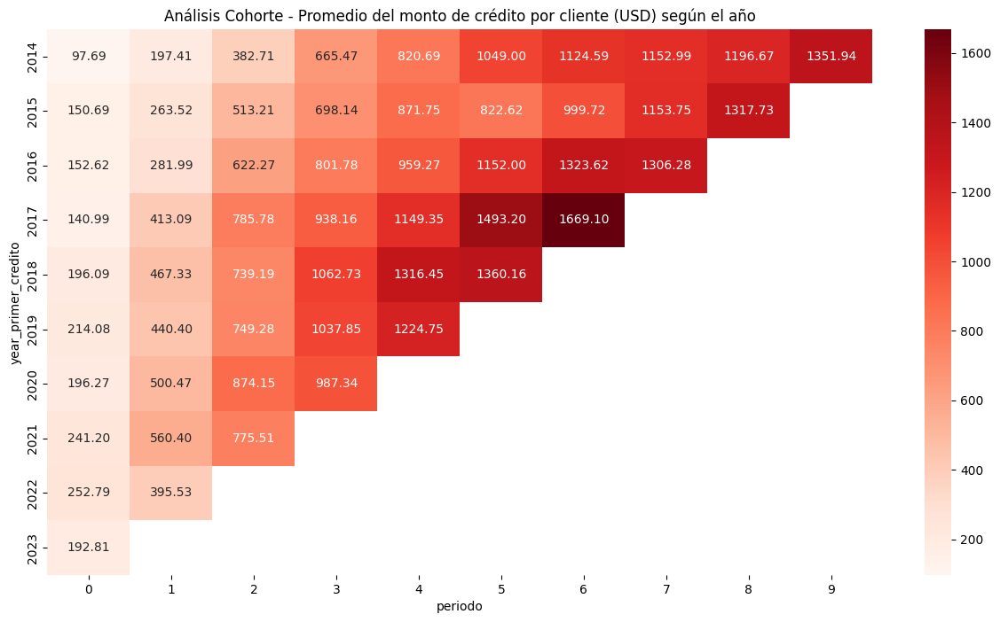

In [ ]:
#Análisis Cohorte - Promedio del monto de crédito por cliente (USD) según el año

#2. Carga los datos en un DataFrame de Pandas y asegúrate de que la columna de fecha esté en formato datetime:


df = C_df
df['fecha'] = pd.to_datetime(df['fecha_desembolso'])


#3. Crea una columna que indique el año de la primera compra de cada cliente:

df['primera_compra'] = df.groupby('cliente_id')['fecha'].transform('min')
df['year_primer_credito'] = df['primera_compra'].dt.to_period('Y')


#4. Agrupa a los clientes por año de primera compra y año de compra, y calcula el monto promedio gastado por cada cohorte en cada año:


cohort_data = df.groupby(['year_primer_credito', 'fecha']) \
              .agg({'cliente_id': 'nunique', 'monto': 'sum'}) \
              .reset_index()
cohort_data['periodo'] = (cohort_data['fecha'].dt.to_period('Y') - cohort_data['year_primer_credito']).apply(lambda x: x.n)
cohort_data['monto_promedio'] = cohort_data['monto'] / cohort_data['cliente_id']


#5. Crea una tabla pivote que muestre el monto promedio gastado por cada cohorte en cada año:

#5, para crear una tabla pivote que muestre el monto promedio gastado por cada cohorte en cada año, puedes usar la función `pivot_table` de Pandas:

cohort_pivot = cohort_data.pivot_table(index='year_primer_credito',
                                       columns='periodo',
                                       values='monto_promedio')


#6. Visualiza los resultados usando un heatmap de Matplotlib:

plt.figure(figsize=(15, 8))
plt.title('Análisis Cohorte - Promedio del monto de crédito por cliente (USD) según el año')
sns.heatmap(data=cohort_pivot,
            annot=True,
            fmt=".2f",
            cmap='Reds')
plt.show()


In [ ]:
A_df

,cliente_id,grupo_id,monto,fecha_aporte,mes_aporte
0,82,3,10.0,2014-09-18,2014-09
1,83,3,5.0,2014-09-18,2014-09
2,84,3,10.0,2014-09-18,2014-09
3,85,3,5.0,2014-09-18,2014-09
4,86,3,5.0,2014-09-18,2014-09
...,...,...,...,...,...
768937,38972,1174,10.0,2023-03-26,2023-03
768938,39912,1174,10.0,2023-03-26,2023-03
768939,42019,1174,10.0,2023-03-26,2023-03
768940,42782,1174,30.0,2023-03-26,2023-03


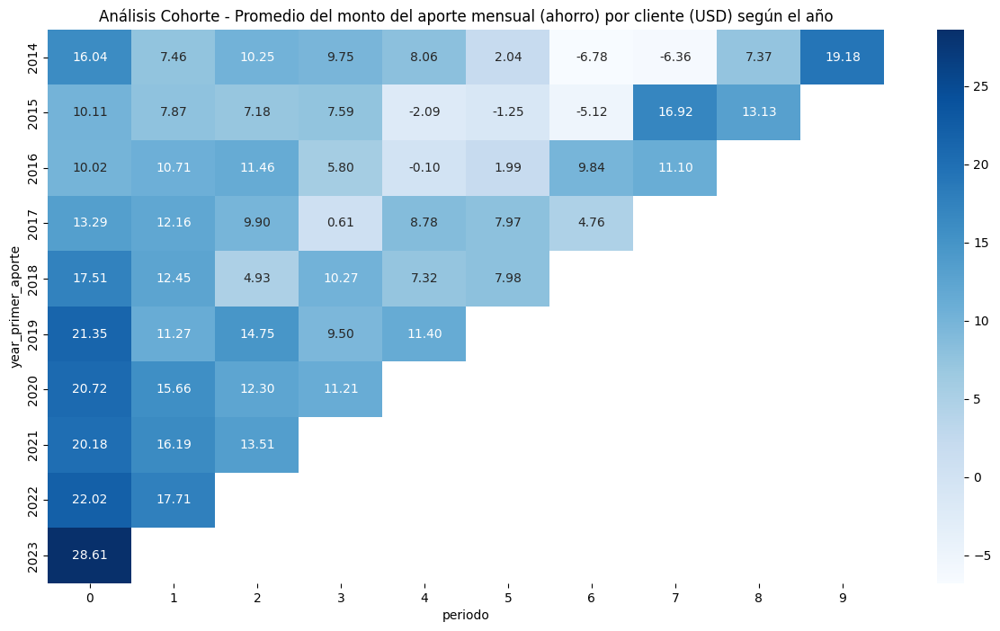

In [ ]:
#Análisis Cohorte - Promedio del monto de ahorro por cliente (USD) según el año

#2. Carga los datos en un DataFrame de Pandas y asegúrate de que la columna de fecha esté en formato datetime:


df = A_df
df['fecha'] = pd.to_datetime(df['fecha_aporte'])


#3. Crea una columna que indique el año de la primera compra de cada cliente:

df['primer_aporte'] = df.groupby('cliente_id')['fecha'].transform('min')
df['year_primer_aporte'] = df['primer_aporte'].dt.to_period('Y')


#4. Agrupa a los clientes por año de primera compra y año de compra, y calcula el monto promedio gastado por cada cohorte en cada año:


cohort_data = df.groupby(['year_primer_aporte', 'fecha']) \
              .agg({'cliente_id': 'nunique', 'monto': 'sum'}) \
              .reset_index()
cohort_data['periodo'] = (cohort_data['fecha'].dt.to_period('Y') - cohort_data['year_primer_aporte']).apply(lambda x: x.n)
cohort_data['monto_promedio'] = cohort_data['monto'] / cohort_data['cliente_id']


#5. Crea una tabla pivote que muestre el monto promedio gastado por cada cohorte en cada año:

#5, para crear una tabla pivote que muestre el monto promedio gastado por cada cohorte en cada año, puedes usar la función `pivot_table` de Pandas:

cohort_pivot = cohort_data.pivot_table(index='year_primer_aporte',
                                       columns='periodo',
                                       values='monto_promedio')


#6. Visualiza los resultados usando un heatmap de Matplotlib:

plt.figure(figsize=(15, 8))
plt.title('Análisis Cohorte - Promedio del monto del aporte mensual (ahorro) por cliente (USD) según el año')
sns.heatmap(data=cohort_pivot,
            annot=True,
            fmt=".2f",
            cmap='Blues')
plt.show()


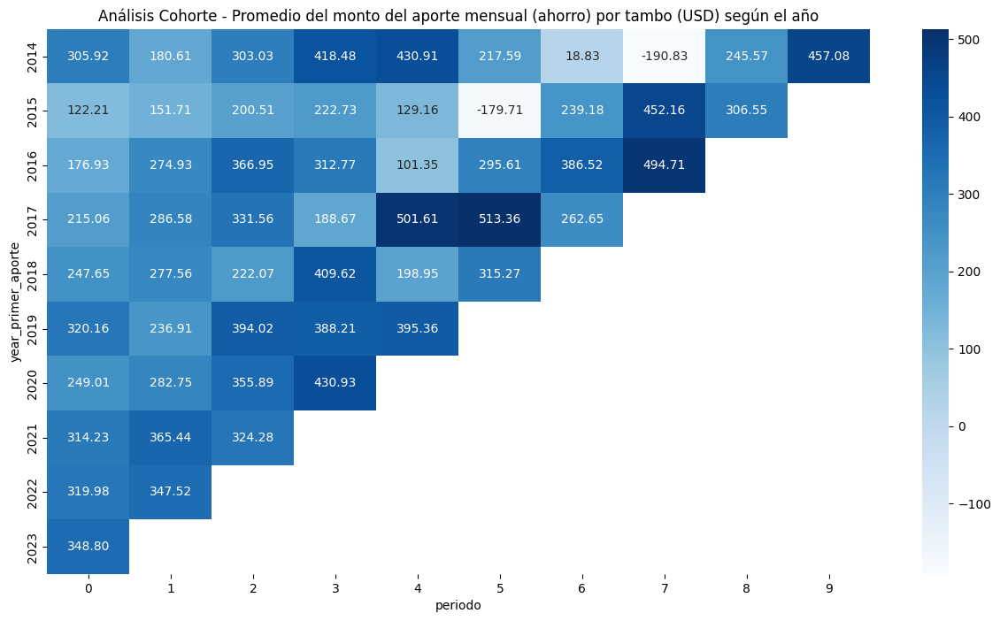

In [ ]:
#Análisis Cohorte - Promedio del monto de ahorro por cliente (USD) según el año

#2. Carga los datos en un DataFrame de Pandas y asegúrate de que la columna de fecha esté en formato datetime:


df = A_df
df['fecha'] = pd.to_datetime(df['fecha_aporte'])


#3. Crea una columna que indique el año de la primera compra de cada cliente:

df['primer_aporte'] = df.groupby('grupo_id')['fecha'].transform('min')
df['year_primer_aporte'] = df['primer_aporte'].dt.to_period('Y')


#4. Agrupa a los clientes por año de primera compra y año de compra, y calcula el monto promedio gastado por cada cohorte en cada año:


cohort_data = df.groupby(['year_primer_aporte', 'fecha']) \
              .agg({'grupo_id': 'nunique', 'monto': 'sum'}) \
              .reset_index()
cohort_data['periodo'] = (cohort_data['fecha'].dt.to_period('Y') - cohort_data['year_primer_aporte']).apply(lambda x: x.n)
cohort_data['monto_promedio'] = cohort_data['monto'] / cohort_data['grupo_id']


#5. Crea una tabla pivote que muestre el monto promedio gastado por cada cohorte en cada año:

#5, para crear una tabla pivote que muestre el monto promedio gastado por cada cohorte en cada año, puedes usar la función `pivot_table` de Pandas:

cohort_pivot = cohort_data.pivot_table(index='year_primer_aporte',
                                       columns='periodo',
                                       values='monto_promedio')


#6. Visualiza los resultados usando un heatmap de Matplotlib:

plt.figure(figsize=(15, 8))
plt.title('Análisis Cohorte - Promedio del monto del aporte mensual (ahorro) por tambo (USD) según el año')
sns.heatmap(data=cohort_pivot,
            annot=True,
            fmt=".2f",
            cmap='Blues')
plt.show()


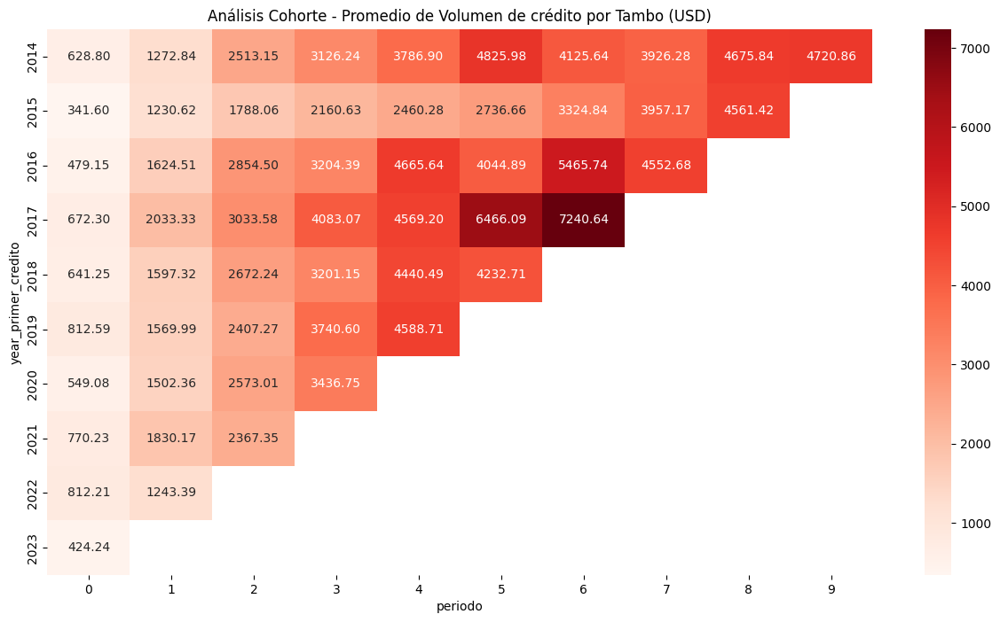

In [ ]:
#Análisis Cohorte - Promedio de Volumen de crédito por Tambo (USD)
#2. Carga los datos en un DataFrame de Pandas y asegúrate de que la columna de fecha esté en formato datetime:


df = C_df
df['fecha'] = pd.to_datetime(df['fecha_desembolso'])


#3. Crea una columna que indique el mes de la primera compra de cada grupo:

df['primera_compra'] = df.groupby('grupo_id')['fecha'].transform('min')
df['year_primer_credito'] = df['primera_compra'].dt.to_period('Y')


#4. Agrupa a los tambos por mes de primera compra y mes de compra, y calcula el monto promedio gastado por cada cohorte en cada mes:


cohort_data = df.groupby(['year_primer_credito', 'fecha']) \
              .agg({'grupo_id': 'nunique', 'monto': 'sum'}) \
              .reset_index()
cohort_data['periodo'] = (cohort_data['fecha'].dt.to_period('Y') - cohort_data['year_primer_credito']).apply(lambda x: x.n)
cohort_data['monto_promedio'] = cohort_data['monto'] / cohort_data['grupo_id']


#5. Crea una tabla pivote que muestre el monto promedio gastado por cada cohorte en cada mes:

#5, para crear una tabla pivote que muestre el monto promedio gastado por cada cohorte en cada mes, puedes usar la función `pivot_table` de Pandas:

cohort_pivot = cohort_data.pivot_table(index='year_primer_credito',
                                       columns='periodo',
                                       values='monto_promedio')


#6. Visualiza los resultados usando un heatmap de Matplotlib:

plt.figure(figsize=(15, 8))
plt.title('Análisis Cohorte - Promedio de Volumen de crédito por Tambo (USD)')
sns.heatmap(data=cohort_pivot,
            annot=True,
            fmt=".2f",
            cmap='Reds')
plt.show()


In [ ]:
tabla_balance.drop()loc[tabla_balance['mes_aporte'] > '2023-03-31']

,cliente_id,mes_aporte,monto_entrada,monto_salida,Cuota,balance_mensual,grupo_id,fecha,primer_balance,year_primer_balance
771893,4,2023-04-01,NaN,NaN,105.51,105.51,1.0,2023-04-01,2014-10-01,2014
771950,11,2023-04-01,NaN,NaN,134.43,134.43,1.0,2023-04-01,2014-10-01,2014
771951,11,2023-05-01,NaN,NaN,134.43,134.43,1.0,2023-05-01,2014-10-01,2014
771952,11,2023-06-01,NaN,NaN,134.43,134.43,1.0,2023-06-01,2014-10-01,2014
771953,11,2023-07-01,NaN,NaN,134.43,134.43,1.0,2023-07-01,2014-10-01,2014
...,...,...,...,...,...,...,...,...,...,...
1013897,43617,2023-07-01,NaN,NaN,11.82,11.82,1309.0,2023-07-01,2023-03-01,2023
1013898,43618,2023-04-01,NaN,NaN,35.45,35.45,1309.0,2023-04-01,2023-03-01,2023
1013899,43618,2023-05-01,NaN,NaN,35.45,35.45,1309.0,2023-05-01,2023-03-01,2023
1013900,43618,2023-06-01,NaN,NaN,35.45,35.45,1309.0,2023-06-01,2023-03-01,2023


In [ ]:
tabla_balance_v2

,cliente_id,mes_aporte,monto_entrada,monto_salida,Amortizacion,balance,grupo_id,fecha,primer_balance,year_primer_balance
0,1,2014-10-01,20.0,NaN,NaN,20.00,1,2014-10-01,2014-10-01,2014
1,1,2015-01-01,-20.0,NaN,NaN,-20.00,1,2015-01-01,2014-10-01,2014
2,2,2014-10-01,20.0,NaN,NaN,20.00,1,2014-10-01,2014-10-01,2014
3,2,2014-12-01,10.0,NaN,NaN,10.00,1,2014-12-01,2014-10-01,2014
4,2,2015-01-01,10.0,NaN,NaN,10.00,1,2015-01-01,2014-10-01,2014
...,...,...,...,...,...,...,...,...,...,...
1013541,42832,2023-03-01,NaN,NaN,9.80,9.80,1282,2023-03-01,2023-02-01,2023
1013544,42844,2023-03-01,NaN,NaN,14.05,14.05,1281,2023-03-01,2023-02-01,2023
1013568,42847,2023-03-01,NaN,NaN,44.55,44.55,1281,2023-03-01,2023-02-01,2023
1013570,42853,2023-03-01,NaN,NaN,14.05,14.05,1281,2023-03-01,2023-02-01,2023


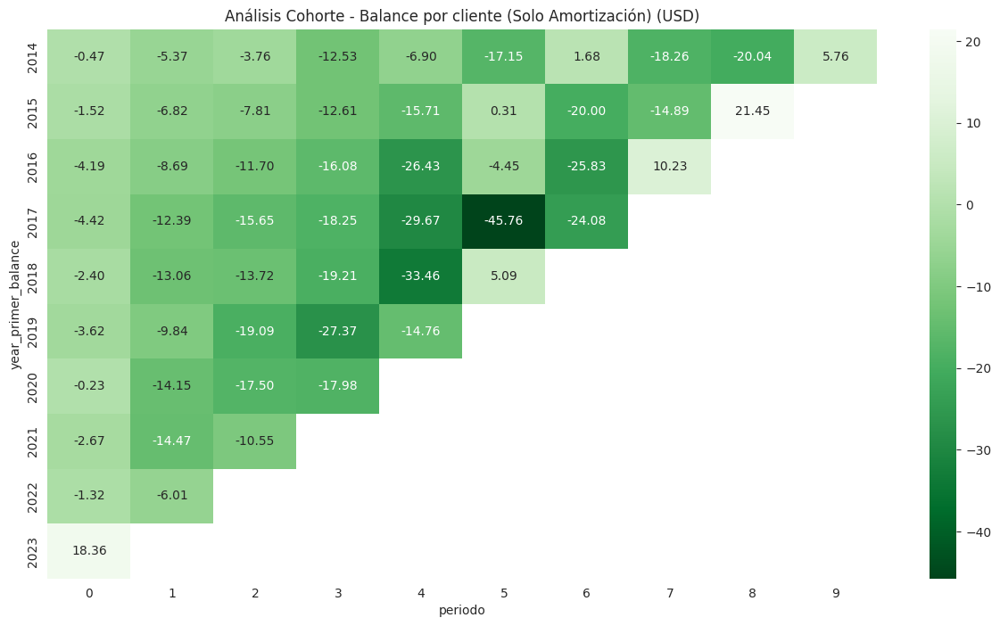

In [ ]:
#Análisis Cohorte - Balance por socio (USD)
#2. Carga los datos en un DataFrame de Pandas y asegúrate de que la columna de fecha esté en formato datetime:


df = tabla_balance_v2
df['fecha'] = pd.to_datetime(df['mes_aporte'])


#3. Crea una columna que indique el mes de la primera compra de cada grupo:

df['primer_balance'] = df.groupby('cliente_id')['fecha'].transform('min')
df['year_primer_balance'] = df['primer_balance'].dt.to_period('Y')


#4. Agrupa a los tambos por mes de primera compra y mes de compra, y calcula el balance promedio gastado por cada cohorte en cada mes:


cohort_data = df.groupby(['year_primer_balance', 'fecha']) \
              .agg({'cliente_id': 'nunique', 'balance': 'sum'}) \
              .reset_index()
cohort_data['periodo'] = (cohort_data['fecha'].dt.to_period('Y') - cohort_data['year_primer_balance']).apply(lambda x: x.n)
cohort_data['balance_promedio'] = cohort_data['balance'] / cohort_data['cliente_id']


#5. Crea una tabla pivote que muestre el balance promedio gastado por cada cohorte en cada mes:

#5, para crear una tabla pivote que muestre el balance promedio gastado por cada cohorte en cada mes, puedes usar la función `pivot_table` de Pandas:

cohort_pivot = cohort_data.pivot_table(index='year_primer_balance',
                                       columns='periodo',
                                       values='balance_promedio')


#6. Visualiza los resultados usando un heatmap de Matplotlib:

sns.set_style("white")

plt.figure(figsize=(15, 8))
plt.title('Análisis Cohorte - Balance por cliente (Solo Amortización) (USD)')
sns.heatmap(data=cohort_pivot,
            annot=True,
            fmt=".2f",
            #vmin=-50,
            #vmax=100,
            cmap='Greens_r')
plt.show()


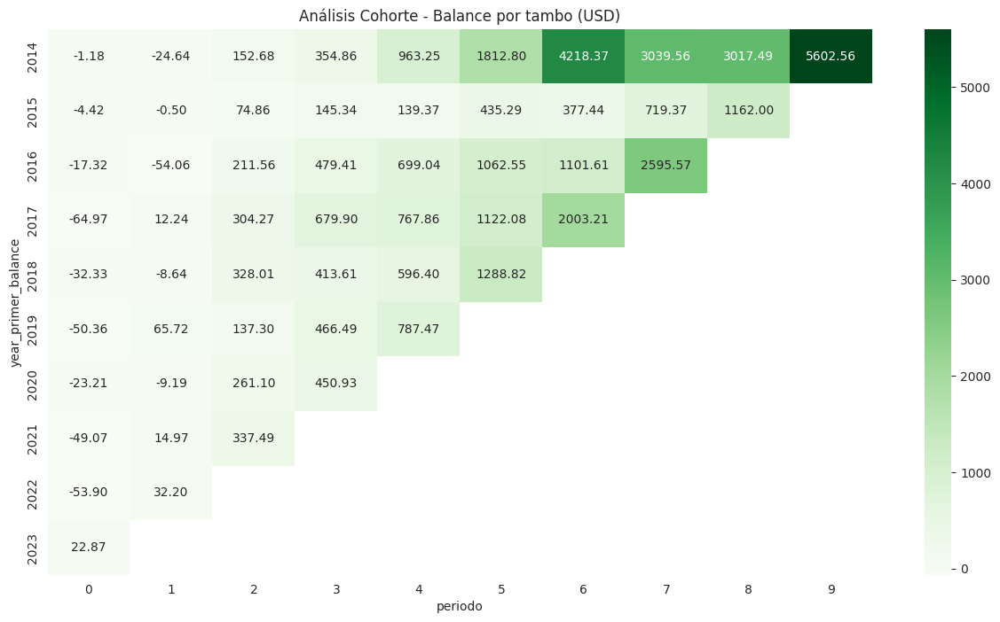

In [ ]:
#Análisis Cohorte - Balance por grupo (USD)
#2. Carga los datos en un DataFrame de Pandas y asegúrate de que la columna de fecha esté en formato datetime:


df = tabla_balance
df['fecha'] = pd.to_datetime(df['mes_aporte'])


#3. Crea una columna que indique el mes de la primera compra de cada grupo:

df['primer_balance'] = df.groupby('grupo_id')['fecha'].transform('min')
df['year_primer_balance'] = df['primer_balance'].dt.to_period('Y')


#4. Agrupa a los tambos por mes de primera compra y mes de compra, y calcula el balance promedio gastado por cada cohorte en cada mes:


cohort_data = df.groupby(['year_primer_balance', 'fecha']) \
              .agg({'grupo_id': 'nunique', 'balance_mensual': 'sum'}) \
              .reset_index()
cohort_data['periodo'] = (cohort_data['fecha'].dt.to_period('Y') - cohort_data['year_primer_balance']).apply(lambda x: x.n)
cohort_data['balance_promedio'] = cohort_data['balance_mensual'] / cohort_data['grupo_id']


#5. Crea una tabla pivote que muestre el balance promedio gastado por cada cohorte en cada mes:

#5, para crear una tabla pivote que muestre el balance promedio gastado por cada cohorte en cada mes, puedes usar la función `pivot_table` de Pandas:

cohort_pivot = cohort_data.pivot_table(index='year_primer_balance',
                                       columns='periodo',
                                       values='balance_promedio')

#cohort_data['value_category'] = ['positive' if b_promedio >= 0 else 'negative' for b_promedio in cohort_data['balance_promedio']]

# Create a scatter plot with different colors for positive and negative values
#sns.scatterplot(x="total_bill", y="tip", hue='value_category', data=tips,
#                palette={'positive': 'green', 'negative': 'red'})


#6. Visualiza los resultados usando un heatmap de Matplotlib:

plt.figure(figsize=(15, 8))
plt.title('Análisis Cohorte - Balance por tambo (USD)')
sns.heatmap(data=cohort_pivot,
            annot=True,
            fmt=".2f",
            cmap='Greens'
            )
plt.show()


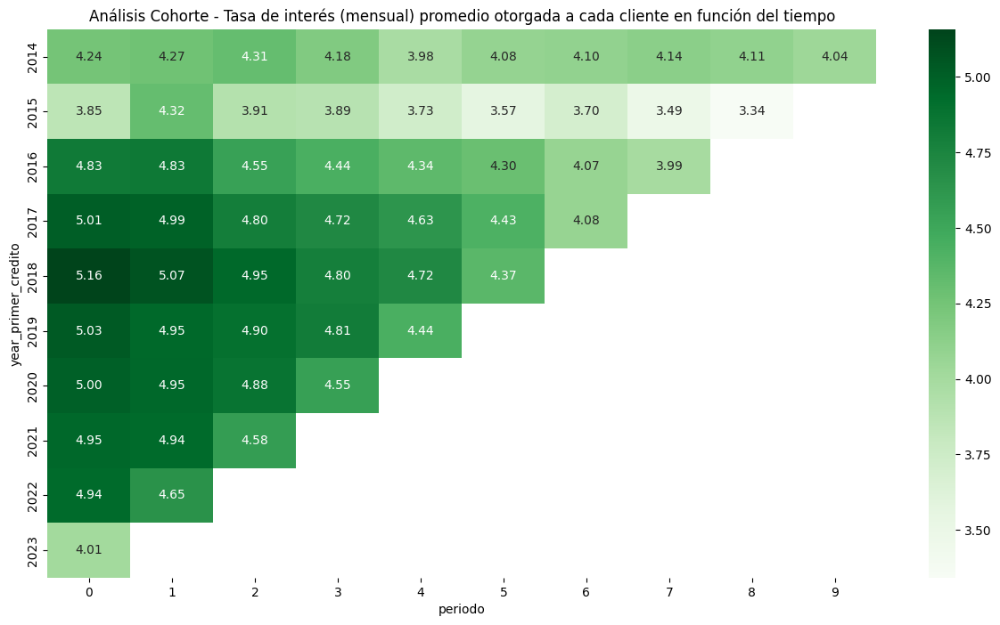

In [ ]:
#Análisis Cohorte - Tasa de interés (mensual) promedio otorgada a cada cliente en función del tiempo
#2. Carga los datos en un DataFrame de Pandas y asegúrate de que la columna de fecha esté en formato datetime:


df = C_df
df['fecha'] = pd.to_datetime(df['fecha_desembolso'])


#3. Crea una columna que indique el mes de la primera compra de cada grupo:

df['primera_compra'] = df.groupby('cliente_id')['fecha'].transform('min')
df['year_primer_credito'] = df['primera_compra'].dt.to_period('Y')


#4. Agrupa a los tambos por mes de primera compra y mes de compra, y calcula el tasa_interes promedio gastado por cada cohorte en cada mes:


cohort_data = df.groupby(['year_primer_credito', 'fecha']) \
              .agg({'cliente_id': 'nunique', 'tasa_interes': 'sum'}) \
              .reset_index()
cohort_data['periodo'] = (cohort_data['fecha'].dt.to_period('Y') - cohort_data['year_primer_credito']).apply(lambda x: x.n)
cohort_data['tasa_interes_promedio'] = cohort_data['tasa_interes'] / cohort_data['cliente_id']


#5, para crear una tabla pivote que muestre el tasa_interes promedio gastado por cada cohorte en cada mes, puedes usar la función `pivot_table` de Pandas:

cohort_pivot = cohort_data.pivot_table(index='year_primer_credito',
                                       columns='periodo',
                                       values='tasa_interes_promedio')


#6. Visualiza los resultados usando un heatmap de Matplotlib:

plt.figure(figsize=(15, 8))
plt.title('Análisis Cohorte - Tasa de interés (mensual) promedio otorgada a cada cliente en función del tiempo')
sns.heatmap(data=cohort_pivot,
            annot=True,
            fmt=".2f",
            cmap='Greens')
plt.show()


In [ ]:
cohort_data.head(20)

## Liquidacion y Montos extraordinarios

In [ ]:
T_df.head(2)

,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad,ahorro_total,prestado_total,personas_en_tambo,antiguedad_tambo_dias,...,confianza_A_meses,confianza_A_anos,conf_A_anos,conf_A_anos_2,confianza_A_anos_1,confianza_A_anos_2,confianza_A_m,confianza_A_1,fecha,year_creacion
0,3,2014-09-18,2023,Activo,SANTA ELENA,Rural,31125,241562.12,63,3157.0,...,0.073047,0.940476,448.284583,859.070076,0.857957,1.802281,0.000005,0.000293,2014-09-18,2014
1,7,2014-09-19,2023,Activo,SANTA ELENA,Rural,40710,294025.52,56,3156.0,...,0.070735,0.910714,629.768013,1330.830519,0.831070,1.924528,0.000005,0.000302,2014-09-19,2014


In [ ]:
from datetime import datetime
datetime.now().year

AttributeError: ignored

In [ ]:
df=CustomDataFrame(T_df)

df['year_creacion'] = df['fecha_creacion'].dt.to_period('Y')

df['fecha_baja'] = df['fecha_baja'].dt.to_period('Y')



df.groupby(['fecha_creacion','fecha_baja'])['montos_ex'].count()

TypeError: ignored

In [ ]:
analisis = T_df.filter(['volumen_de_credito_con_mora', 'volumen_de_credito_sin_mora', 'antiguedad_tambo_anos', 'montos_ex', 'porc_creditos_en_mora' ], axis=1)

profile = ProfileReport(analisis,title='Mi Reporte')
profile

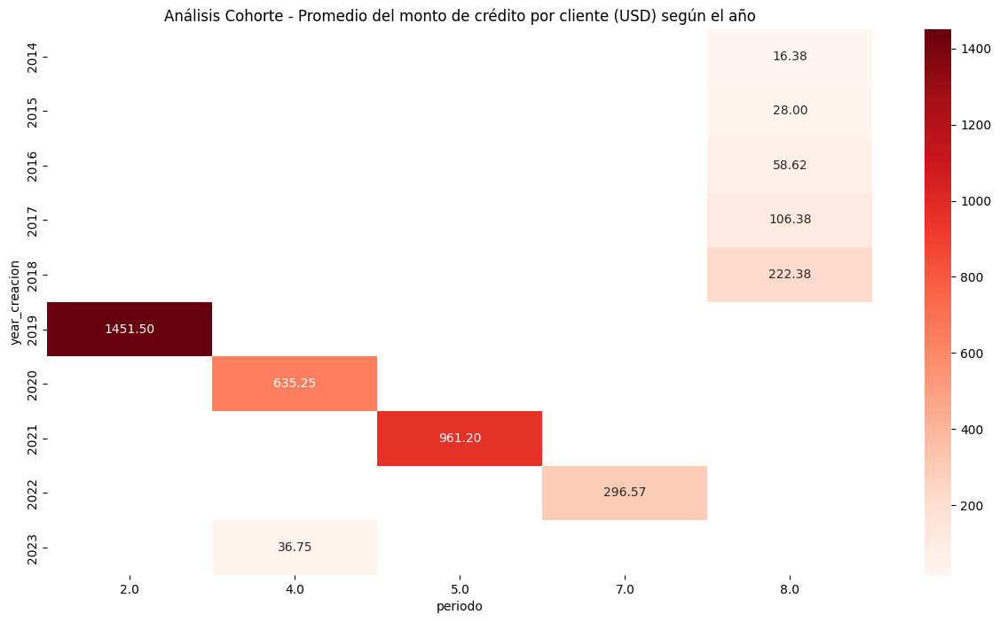

In [ ]:
#Análisis Cohorte - Promedio del monto de crédito por cliente (USD) según el año

#2. Carga los datos en un DataFrame de Pandas y asegúrate de que la columna de fecha esté en formato datetime:


df = T_df
df['fecha'] = pd.to_datetime(df['fecha_creacion'])


#3. Crea una columna que indique el año de la primera compra de cada cliente:

df['year_creacion'] = df['fecha_creacion'].dt.to_period('Y')


#4. Agrupa a los clientes por año de primera compra y año de compra, y calcula el monto promedio gastado por cada cohorte en cada año:


cohort_data = df.groupby(['year_creacion']) \
              .agg({'grupo_id': 'nunique', 'montos_ex': 'sum'}) \
              .reset_index()
cohort_data['periodo'] = df['antiguedad_tambo_anos']
cohort_data['monto_promedio'] = cohort_data['montos_ex'] / cohort_data['periodo']


#5. Crea una tabla pivote que muestre el monto promedio gastado por cada cohorte en cada año:

#5, para crear una tabla pivote que muestre el monto promedio gastado por cada cohorte en cada año, puedes usar la función `pivot_table` de Pandas:

cohort_pivot = cohort_data.pivot_table(index='year_creacion',
                                       columns='periodo',
                                       values='monto_promedio')


#6. Visualiza los resultados usando un heatmap de Matplotlib:

plt.figure(figsize=(15, 8))
plt.title('Análisis Cohorte - Promedio del monto de crédito por cliente (USD) según el año')
sns.heatmap(data=cohort_pivot,
            annot=True,
            fmt=".2f",
            cmap='Reds')
plt.show()


## Análisis por confianza VS Familiaridad

In [ ]:
C_df

In [ ]:
C_df['vol_cred_sin_mora'] = np.where(np.isnan(C_df['morosidad_dias']), C_df['monto'], 0)
C_df_fam = C_df.sort_values(by=['familiaridad_de_tambo'], ascending=False)

mitad=int(round(len(C_df_fam)/2,0))

C_df_fam1 = CustomDataFrame(C_df_fam.iloc[:mitad,:])
C_df_fam2 = CustomDataFrame(C_df_fam.iloc[mitad:,:])

In [ ]:
cohort_data

,year_primer_credito,fecha,cliente_id,grupo_id,vol_cred_sin_mora,periodo,conf_T_2
0,2014,2014-09-18,1,1,110.0,0,110.000000
1,2014,2014-09-19,2,1,150.0,0,75.000000
2,2014,2014-09-20,5,2,245.0,0,49.000000
3,2014,2014-10-01,5,1,800.0,0,160.000000
4,2014,2014-10-06,16,1,1607.5,0,100.468750
...,...,...,...,...,...,...,...
9643,2023,2023-03-22,10,3,1115.0,0,111.500000
9644,2023,2023-03-23,3,2,873.3,0,291.100000
9645,2023,2023-03-24,1,1,460.0,0,460.000000
9646,2023,2023-03-25,10,7,1296.0,0,129.600000


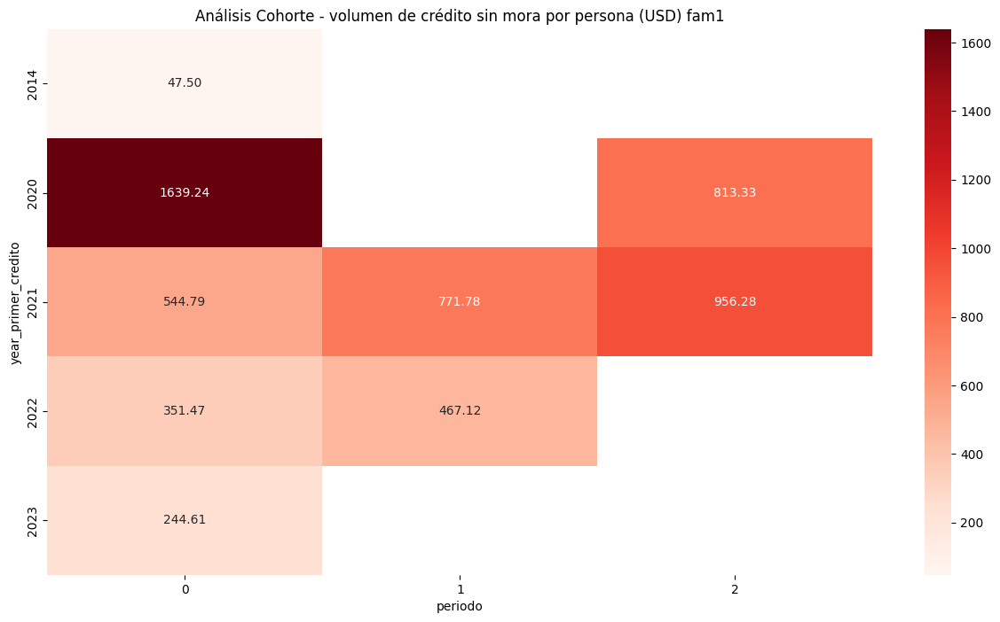

In [ ]:
df = C_df_fam1
df['fecha'] = pd.to_datetime(df['fecha_desembolso'])


#3. Crea una columna que indique el año de la primera compra de cada cliente:

df['primera_compra'] = df.groupby('cliente_id')['fecha'].transform('min')
df['year_primer_credito'] = df['primera_compra'].dt.to_period('Y')


#4. Agrupa a los clientes por año de primera compra y año de compra, y calcula el monto promedio gastado por cada cohorte en cada año:

cohort_data = df.groupby(['year_primer_credito', 'fecha']) \
              .agg({'cliente_id': 'nunique', 'grupo_id': 'nunique','monto': 'sum'}) \
              .reset_index()
cohort_data['periodo'] = (cohort_data['fecha'].dt.to_period('Y') - cohort_data['year_primer_credito']).apply(lambda x: x.n)
#cohort_data['conf_T_2'] = np.where(cohort_data['periodo'] != 0, cohort_data['monto'] / ( cohort_data['cliente_id'] * cohort_data['periodo']), 0)
#cohort_data['conf_T_2'] = cohort_data['monto'] / (cohort_data['cliente_id'] )
cohort_data['conf_T_2'] = cohort_data['monto'] / (cohort_data['cliente_id'] )

#5, para crear una tabla pivote que muestre el monto promedio gastado por cada cohorte en cada año, puedes usar la función `pivot_table` de Pandas:

cohort_pivot = cohort_data.pivot_table(index='year_primer_credito',
                                       columns='periodo',
                                       values='conf_T_2')

#6. Visualiza los resultados usando un heatmap de Matplotlib:

plt.figure(figsize=(15, 8))
plt.title('Análisis Cohorte - volumen de crédito sin mora por persona (USD) fam1')
sns.heatmap(data=cohort_pivot,
            annot=True,
            fmt=".2f",
            cmap='Reds',
            #vmin=0,
            #vmax=3600
            )
plt.show()

#cohort_pivot

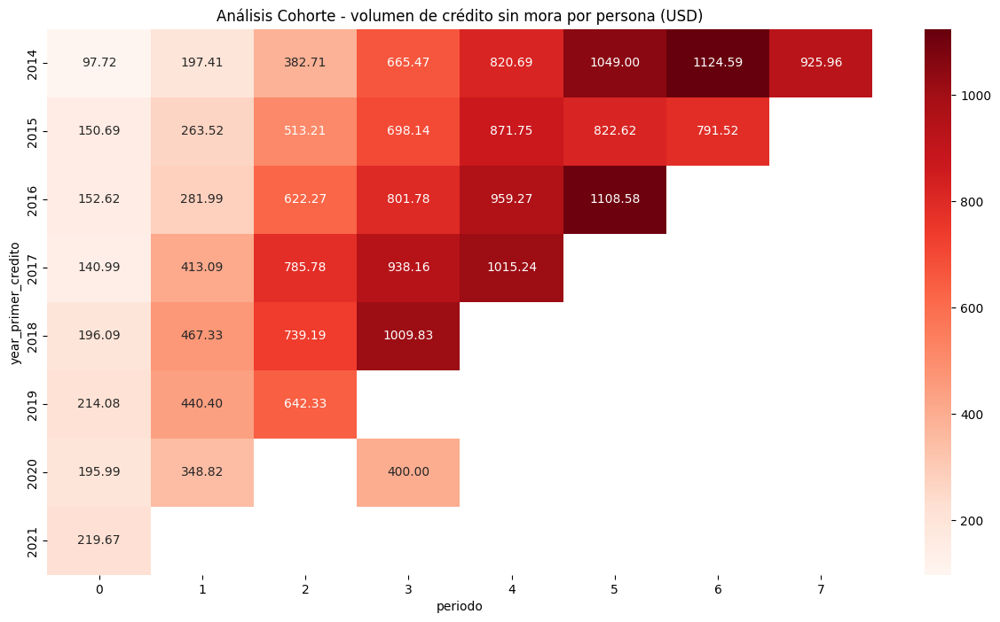

In [ ]:
df = C_df_fam2
df['fecha'] = pd.to_datetime(df['fecha_desembolso'])


#3. Crea una columna que indique el año de la primera compra de cada cliente:

df['primera_compra'] = df.groupby('cliente_id')['fecha'].transform('min')
df['year_primer_credito'] = df['primera_compra'].dt.to_period('Y')


#4. Agrupa a los clientes por año de primera compra y año de compra, y calcula el monto promedio gastado por cada cohorte en cada año:

cohort_data = df.groupby(['year_primer_credito', 'fecha']) \
              .agg({'cliente_id': 'nunique', 'monto': 'sum'}) \
              .reset_index()
cohort_data['periodo'] = (cohort_data['fecha'].dt.to_period('Y') - cohort_data['year_primer_credito']).apply(lambda x: x.n)
#cohort_data['conf_T_2'] = np.where(cohort_data['periodo'] != 0, cohort_data['monto'] / ( cohort_data['cliente_id'] * cohort_data['periodo']), 0)
#cohort_data['conf_T_2'] = cohort_data['monto'] / (cohort_data['cliente_id'])
cohort_data['conf_T_2'] = cohort_data['monto'] / (cohort_data['cliente_id'])

#5, para crear una tabla pivote que muestre el monto promedio gastado por cada cohorte en cada año, puedes usar la función `pivot_table` de Pandas:

cohort_pivot = cohort_data.pivot_table(index='year_primer_credito',
                                       columns='periodo',
                                       values='conf_T_2')

#6. Visualiza los resultados usando un heatmap de Matplotlib:

plt.figure(figsize=(15, 8))
plt.title('Análisis Cohorte - volumen de crédito sin mora por persona (USD)')
sns.heatmap(data=cohort_pivot,
            annot=True,
            fmt=".2f",
            cmap='Reds',            
            #vmin=0,
            #vmax=3600
            )
plt.show()

#cohort_pivot

## Reinversion de utilidades


In [42]:
T_df.head()

,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad,ahorro_total,prestado_total,personas_en_tambo,antiguedad_tambo_dias,antiguedad_tambo_meses,antiguedad_tambo_anos,tiempo_en_comun_years,volumen_de_credito_sin_mora,volumen_de_credito_con_mora,familiaridad_en_tambo
0,3,2014-09-18,NaT,Activo,SANTA ELENA,Rural,31125,241562.12,63,3167.0,103.0,8.0,263.0,225935.43,17826.69,1.17699
1,7,2014-09-19,NaT,Activo,SANTA ELENA,Rural,40710,294025.52,56,3166.0,103.0,8.0,212.0,282136.07,11889.45,1.10979
2,4,2014-09-20,NaT,Activo,SANTA ELENA,Periurbano,70095,474206.34,72,3165.0,103.0,8.0,197.0,458230.45,16375.89,1.17024
3,2,2014-09-20,NaT,Activo,SANTA ELENA,Rural,18585,150833.69,61,3165.0,103.0,8.0,147.0,139823.64,11010.05,1.09950
4,1,2014-10-01,NaT,Activo,CHIMBORAZO,Rural,66610,581202.38,92,3154.0,102.0,8.0,461.0,446043.75,135158.63,1.13986


In [52]:
uc_df=A_df.loc[A_df['fecha_aporte'] == A_df['termino_periodo']]
uc_df['fecha_aporte'] = pd.to_datetime(uc_df['fecha_aporte'], errors='coerce')
df3 = uc_df.groupby(['grupo_id', 'fecha_aporte'], as_index=False)['monto'].sum()

df = U_df.filter(['group_id', 'end_date', 'distributed_utilities'])
df=df.rename(columns={"group_id": "grupo_id", "end_date": "fecha_aporte", "distributed_utilities": "monto"})

r_df=CustomDataFrame(pd.merge(df3, df, on=['grupo_id','fecha_aporte'], suffixes=('_aportado', '_distribuido'), how='left'))
r_df=r_df.rename(columns={"fecha_aporte": "termino_periodo"})
r_df['porc_reinversion'] = round(r_df['monto_aportado']/r_df['monto_distribuido'], 4)


r_df = r_df.loc[(r_df['termino_periodo'] < '2023-03-25') & (r_df['monto_distribuido'] >= 0) ] 
#& (r_df['monto_aportado'] < 0) & (r_df['monto_aportado'] < 0)    
r_df['fecha_creacion_tambo'] = pd.Series(dtype='datetime64[ns]')
r_df['estado_tambo'] = pd.Series(dtype='str')
r_df['porc_cred_mora'] = pd.Series(dtype='float')
r_df['familiaridad_en_tambo'] = pd.Series(dtype='str')

for index, row in r_df.iterrows():
  fecha_creacion_tambo = T_df.loc[(T_df['grupo_id'] == row['grupo_id'])]['fecha_creacion'].values[0]
  estado_tambo = T_df.loc[(T_df['grupo_id'] == row['grupo_id'])]['estado'].values[0]
  porc_cred_mora = T_df.loc[(T_df['grupo_id'] == row['grupo_id'])]['porc_creditos_en_mora'].values[0]
  familiaridad_en_tambo = T_df.loc[(T_df['grupo_id'] == row['grupo_id'])]['familiaridad_en_tambo'].values[0]

  r_df.at[index, 'fecha_creacion_tambo'] = fecha_creacion_tambo
  r_df.at[index, 'estado_tambo'] = estado_tambo
  r_df.at[index, 'porc_cred_mora'] = porc_cred_mora
  r_df.at[index, 'familiaridad_en_tambo'] = familiaridad_en_tambo
r_df

<ipython-input-52-f9887c64f712>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uc_df['fecha_aporte'] = pd.to_datetime(uc_df['fecha_aporte'], errors='coerce')


,grupo_id,termino_periodo,monto_aportado,monto_distribuido,porc_reinversion,fecha_creacion_tambo,estado_tambo,porc_cred_mora,familiaridad_en_tambo
0,1,2015-11-09,1310.0,2437.02,0.5375,2014-10-01,Activo,0.140483,1.13986
1,1,2016-11-07,2470.0,6439.68,0.3836,2014-10-01,Activo,0.140483,1.13986
2,1,2017-11-06,240.0,10444.06,0.0230,2014-10-01,Activo,0.140483,1.13986
3,1,2018-11-05,2680.0,10827.45,0.2475,2014-10-01,Activo,0.140483,1.13986
4,1,2019-12-02,2880.0,12800.19,0.2250,2014-10-01,Activo,0.140483,1.13986
...,...,...,...,...,...,...,...,...,...
2461,1030,2023-03-13,4020.0,2433.80,1.6517,2022-03-03,Activo,0.000000,1.03858
2462,1032,2023-03-07,-8340.0,2817.00,-2.9606,2022-03-17,Liquidado,0.000000,0.83333
2464,1034,2023-03-12,2050.0,2341.50,0.8755,2022-03-20,Activo,0.000000,1.00662
2465,1036,2023-03-18,610.0,1016.60,0.6000,2022-03-27,Activo,0.000000,0.8


In [56]:
#Analizando contra Mora
df = r_df.loc[r_df['estado_tambo'] == 'Activo']
df = df.sort_values(by=['porc_cred_mora'], ascending=False)

mitad=int(round(len(df)/2,0))

df_mora1 = CustomDataFrame(df.iloc[:mitad,:])
df_mora2 = CustomDataFrame(df.iloc[mitad:,:])

In [60]:
#Analizando contra Familiaridad
df = r_df.loc[r_df['estado_tambo'] == 'Activo']
df = df.sort_values(by=['familiaridad_en_tambo'], ascending=False)

mitad=int(round(len(df)/2,0))

df_fam1 = CustomDataFrame(df.iloc[:mitad,:])
df_fam2 = CustomDataFrame(df.iloc[mitad:,:])

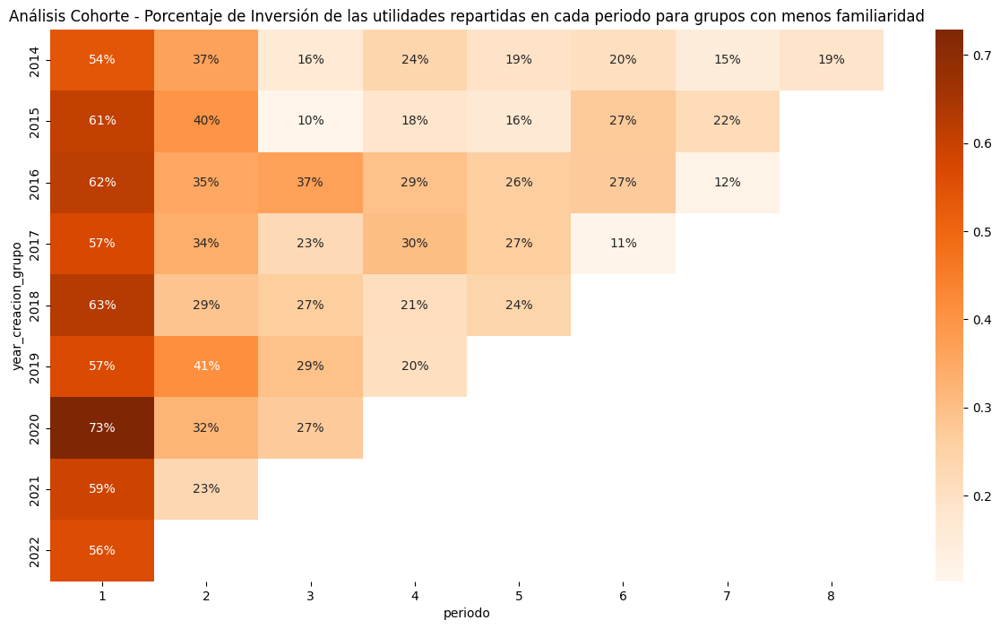

periodo,1,2,3,4,5,6,7,8
year_creacion_grupo,,,,,,,,
2014,0.539140,0.366133,0.162833,0.238967,0.191700,0.203317,0.151683,0.189317
2015,0.606922,0.399429,0.102778,0.184814,0.164225,0.271850,0.219578,NaN
2016,0.616330,0.354290,0.367200,0.294300,0.262190,0.270730,0.119250,NaN
2017,0.574595,0.338563,0.227215,0.302633,0.265866,0.109117,NaN,NaN
2018,0.627395,0.287605,0.265411,0.208858,0.243600,NaN,NaN,NaN
2019,0.566835,0.413303,0.294519,0.204154,NaN,NaN,NaN,NaN
2020,0.728878,0.322103,0.270758,NaN,NaN,NaN,NaN,NaN
2021,0.590389,0.234404,NaN,NaN,NaN,NaN,NaN,NaN
2022,0.561110,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [63]:
#Análisis Cohorte - Tasa de interés (mensual) promedio otorgada a cada cliente en función del tiempo
#2. Carga los datos en un DataFrame de Pandas y asegúrate de que la columna de fecha esté en formato datetime:

#df = r_df.loc[r_df['estado_tambo'] == 'Liquidado']
df = df_fam2
df['fecha'] = pd.to_datetime(df['termino_periodo'])


#3. Crea una columna que indique el mes de la primera compra de cada grupo:

df['year_creacion_grupo'] = df['fecha_creacion_tambo'].dt.to_period('Y')

#4. Agrupa a los tambos por mes de primera compra y mes de compra, y calcula el porc_reinversion promedio gastado por cada cohorte en cada mes:


cohort_data = df.groupby(['year_creacion_grupo', 'fecha']) \
              .agg({'grupo_id': 'nunique', 'porc_reinversion': 'sum'}) \
              .reset_index()
cohort_data['periodo'] = (cohort_data['fecha'].dt.to_period('Y') - cohort_data['year_creacion_grupo']).apply(lambda x: x.n)
cohort_data = cohort_data.loc[cohort_data['periodo']> 0]
cohort_data['porc_reinversion_promedio'] = cohort_data['porc_reinversion'] / cohort_data['grupo_id']


#5, para crear una tabla pivote que muestre el porc_reinversion promedio gastado por cada cohorte en cada mes, puedes usar la función `pivot_table` de Pandas:

cohort_pivot = cohort_data.pivot_table(index='year_creacion_grupo',
                                       columns='periodo',
                                       values='porc_reinversion_promedio')


#6. Visualiza los resultados usando un heatmap de Matplotlib:

plt.figure(figsize=(15, 8))
#plt.title('Análisis Cohorte - Porcentaje de Inversión de las utilidades repartidas en cada periodo para grupos activos con menos morosidad')
plt.title('Análisis Cohorte - Porcentaje de Inversión de las utilidades repartidas en cada periodo para grupos con menos familiaridad')

import matplotlib.colors as mcolors
colors = ['#FFEFD5', '#FFDAB9', '#FFA07A', '#FF7F50', '#FF6347']

#fmt=lambda x: '{:.1f} %'.format(x * 100)

sns.heatmap(data=cohort_pivot,
            annot=True,
            fmt=".0%",
            #vmax=0.77,
            #vmin=0,
            cmap = 'Oranges'
            )
plt.show()
cohort_pivot

# Analisis Morosidad/Cartera vencida

In [ ]:
S_df.groupby('moroso')['cliente_id'].count()

moroso
No    34768
Si     2550
Name: cliente_id, dtype: int64

In [ ]:
S_df.loc[S_df['moroso'] == 'Si']

,cliente_id,grupo_id,apellidos,sexo,edad,rango_edad,ocupacion,estado,antiguedad,fecha_alta,...,ahorro,years_en_tambo,num_prestamo,total_prestamo,moroso,ahorro_tambo,porc_ahorr_en_grupo,personas_en_tambo,prestamo_tambo,familiaridad_de_tambo
3,7,1,Arevalo Paguay,Mujer,67,60-69,NaN,Liquidado,38.0,2014-10-01,...,290,3.0,2.0,450.00,Si,66610,0.004354,92,581202.38,1.14841
8,14,1,Becerra Totoy,Mujer,45,40-49,Costura,Activo,101.0,2014-10-01,...,610,8.0,12.0,12443.85,Si,66610,0.009158,92,581202.38,1.14841
11,19,1,Hidalgo Guijarro,Mujer,66,60-69,Costura,Activo,101.0,2014-10-01,...,1070,8.0,14.0,9891.50,Si,66610,0.016064,92,581202.38,1.14841
12,20,1,Hidalgo Macas,Hombre,30,30-39,Costura,Activo,101.0,2014-10-01,...,620,8.0,8.0,14151.32,Si,66610,0.009308,92,581202.38,1.14841
13,21,1,Hidalgo Paguay,Hombre,56,50-59,Costura,Activo,101.0,2014-10-01,...,560,8.0,10.0,31201.15,Si,66610,0.008407,92,581202.38,1.14841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26589,37457,587,Salazar Aguas,Hombre,58,50-59,Comerciante,Liquidado,6.0,2022-09-18,...,40,0.0,1.0,76.30,Si,10780,0.003711,44,58590.52,1.06262
26662,37545,65,Sanchez Sanchez,Hombre,27,18-29,Agricultura,Activo,6.0,2022-09-19,...,35,0.0,2.0,107.50,Si,23355,0.001499,61,159863.74,1.22105
27434,38422,1161,Vinces Perez,Hombre,38,30-39,Otro,Activo,5.0,2022-10-11,...,140,0.0,4.0,723.00,Si,1230,0.113821,18,3312.00,0.55556
27782,38806,1070,Roca Mendoza,Hombre,25,18-29,Otro,Activo,5.0,2022-10-26,...,40,0.0,1.0,60.00,Si,1770,0.022599,18,6788.68,1.31944


In [ ]:
S_df.loc[S_df['cliente_id'] == 3630]


,cliente_id,grupo_id,apellidos,sexo,edad,rango_edad,ocupacion,estado,antiguedad,fecha_alta,...,ahorro,years_en_tambo,num_prestamo,total_prestamo,moroso,ahorro_tambo,porc_ahorr_en_grupo,personas_en_tambo,prestamo_tambo,familiaridad_de_tambo
1313,3630,162,Asencio Quirumbay,Mujer,53,50-59,Comerciante,Activo,76.0,2016-11-14,...,830,6.0,21.0,24379.11,Si,20990,0.039543,43,225491.75,1.33598


In [ ]:
df=C_df.loc[(C_df['mora_activa'] == 'Si')]
df

,credito_id,cliente_id,grupo_id,fecha_desembolso,monto,plazo,tasa_interes,capital_pendiente,finalidad,mora_activa,morosidad_dias,inicio_mora,vol_cred_sin_mora,rango_edad_cliente,porc_prest_total_tambo,familiaridad_de_tambo
84184,84185,6792,263,2021-04-21,960.00,40,5.00000,NaN,Salud,Si,12.0,2023-03-15,0.0,30-39,0.004425,1.06219
89406,89407,9756,147,2021-06-24,5730.00,60,3.00000,NaN,Negocio,Si,33.0,2023-01-26,0.0,50-59,0.008798,1.23892
92006,92007,3630,162,2021-07-21,2239.39,24,5.00000,NaN,Pago de deudas,Si,35.0,2021-08-18,0.0,50-59,0.009931,1.33598
93729,93730,9103,335,2021-08-08,1500.00,36,5.00000,NaN,Negocio,Si,43.0,2023-02-12,0.0,40-49,0.015193,1.14699
96171,96172,11193,402,2021-09-04,925.00,40,5.00000,NaN,Otros,Si,37.0,2022-12-03,0.0,30-39,0.012108,1.06061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160935,160936,24263,787,2023-02-12,750.00,4,5.00000,NaN,Negocio,Si,15.0,2023-03-12,0.0,18-29,0.028932,1.35577
161239,161240,22893,248,2023-02-11,2107.00,24,4.00000,NaN,Negocio,Si,16.0,2023-03-11,0.0,18-29,0.029450,1.04112
161385,161386,31857,1008,2023-02-17,219.80,11,0.00001,NaN,Negocio,Si,17.0,2023-03-10,0.0,50-59,0.013663,1.09544
161503,161504,5714,230,2023-02-18,600.00,1,5.00000,NaN,Negocio,Si,8.0,2023-03-19,0.0,30-39,0.002813,1.07799


In [ ]:
df = C_df.loc[C_df['mora_activa'] == 'Si']
df2 = C_df.loc[C_df['mora_activa'] == 'No']

div = (df.monto.sum()/df2.monto.sum())*100

print(round(div,3),'%')




0.404 %


In [ ]:
A_df.loc[A_df['cliente_id'] == 3630]

,cliente_id,grupo_id,monto,fecha_aporte
20703,3630,162,5.0,2016-11-14
23057,3630,162,20.0,2016-12-12
25282,3630,162,25.0,2017-01-10
28046,3630,162,10.0,2017-02-14
30467,3630,162,35.0,2017-03-14
...,...,...,...,...
647477,3630,162,0.0,2022-10-19
666955,3630,162,10.0,2022-11-16
695673,3630,162,10.0,2022-12-21
715548,3630,162,10.0,2023-01-18


In [ ]:
df=C_df.loc[C_df['inicio_mora'] > '2014-01-01']
df

lista_morosos_cliente_id = []

for index, row in df.iterrows():
  if S_df.loc[(S_df['cliente_id'] == row['cliente_id']) & (S_df.loc[S_df['estado'] == 'Liquidado'])]:
   lista_morosos_cliente_id.append(row["cliente_id"])
    
lista_morosos_cliente_id

In [ ]:
C_df.groupby(['mora_activa'])['credito_id'].count()

# Representación Grafica

## Prestamos entre generaciones
X: Rango de edad

Y: Prom de actividad ahorro y préstamo


In [ ]:
T_df['ahorro_mas_de_70'].mean()

0.03693693478121901

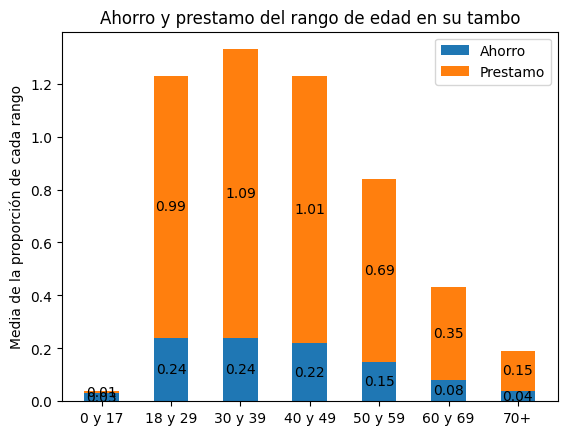

In [ ]:
y1 = []

y1.append(round(T_df.ahorro_0_y_17.mean(),2))
y1.append(round(T_df.ahorro_18_y_29.mean(),2))
y1.append(round(T_df.ahorro_30_y_39.mean(),2))
y1.append(round(T_df.ahorro_40_y_49.mean(),2))
y1.append(round(T_df.ahorro_50_y_59.mean(),2))
y1.append(round(T_df.ahorro_60_y_69.mean(),2))
y1.append(round(T_df.ahorro_mas_de_70.mean(),2))

y2 = []

y2.append(round(T_df.prestamo_0_y_17.mean(),2))
y2.append(round(T_df.prestamo_18_y_29.mean(),2))
y2.append(round(T_df.prestamo_30_y_39.mean(),2))
y2.append(round(T_df.prestamo_40_y_49.mean(),2))
y2.append(round(T_df.prestamo_50_y_59.mean(),2))
y2.append(round(T_df.prestamo_60_y_69.mean(),2))
y2.append(round(T_df.prestamo_mas_de_70.mean(),2))

x= []

x = ['0 y 17', '18 y 29', '30 y 39', '40 y 49', '50 y 59', '60 y 69', '70+']

y1 =np.array(y1)
y2 = np.array(y2)


rango_edad = x

weight_counts = {
    "Ahorro": y1,
    "Prestamo": y2,
}
width = 0.5

fig, ax = plt.subplots()
bottom = np.zeros(7)

for boolean, weight_count in weight_counts.items():
    p = ax.bar(rango_edad, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count
    ax.bar_label(p, label_type='center')

ax.set_title("Ahorro y prestamo del rango de edad en su tambo")
ax.legend(loc="upper right")
ax.set_ylabel('Media de la proporción de cada rango')


plt.show()


In [ ]:
T_df.head(10)

,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad,ahorro_total,prestado_total,personas_en_tambo,antiguedad_tambo_dias,antiguedad_tambo_meses,antiguedad_tambo_anos,tiempo_en_comun_years,volumen_de_credito_sin_mora,volumen_de_credito_con_mora,montos_ex
0,3,2014-09-18,NaT,Activo,SANTA ELENA,Rural,31125,241562.12,63,3151.0,103.0,8.0,263.0,225935.43,17826.69,8
1,7,2014-09-19,NaT,Activo,SANTA ELENA,Rural,40710,294025.52,56,3150.0,103.0,8.0,212.0,282136.07,11889.45,23
2,4,2014-09-20,NaT,Activo,SANTA ELENA,Periurbano,70095,474206.34,72,3149.0,103.0,8.0,197.0,458230.45,16375.89,-2
3,2,2014-09-20,NaT,Activo,SANTA ELENA,Rural,18585,150833.69,61,3149.0,103.0,8.0,147.0,139823.64,11010.05,47
4,1,2014-10-01,NaT,Activo,CHIMBORAZO,Rural,66610,581202.38,92,3138.0,102.0,8.0,461.0,446043.75,135158.63,-4
5,5,2014-10-28,2017-02-28,Liquidado,SANTA ELENA,Rural,0,0.00,0,0.0,0.0,2.0,NaN,21185.49,252.50,0
6,8,2014-11-04,2019-09-07,Liquidado,CHIMBORAZO,Rural,0,0.00,0,0.0,0.0,4.0,NaN,22244.15,12686.89,-4
7,9,2014-11-05,2020-03-05,Liquidado,CHIMBORAZO,Rural,0,0.00,0,0.0,0.0,5.0,NaN,188325.24,NaN,-1
8,10,2014-11-06,2022-11-03,Liquidado,SANTA ELENA,Rural,0,0.00,0,0.0,0.0,7.0,NaN,262633.18,4919.42,-2
9,11,2014-11-08,2018-11-30,Liquidado,CHIMBORAZO,Rural,0,0.00,0,0.0,0.0,4.0,NaN,31986.63,2543.55,0


In [ ]:
T_df_ahorro_y_credito_edad.head()
#T_df.loc[T_df['estado'] == 'Activo'].antiguedad_tambo_anos.sum()

,grupo_id,ahorro_total,prestado_total,ahorro_0_y_17,ahorro_18_y_29,ahorro_30_y_39,ahorro_40_y_49,ahorro_50_y_59,ahorro_60_y_69,ahorro_mas_de_70,prestamo_0_y_17,prestamo_18_y_29,prestamo_30_y_39,prestamo_40_y_49,prestamo_50_y_59,prestamo_60_y_69,prestamo_mas_de_70
0,3,31125,241562.12,0.002731,0.135743,0.262329,0.174297,0.213655,0.100080,0.111165,0.000000,0.660072,1.923537,1.789870,1.744841,0.820876,0.821835
1,7,40710,294025.52,0.036232,0.211005,0.076271,0.278187,0.198600,0.029231,0.170474,0.035127,1.376148,0.752752,2.407400,1.454846,0.421173,0.774995
2,4,70095,474206.34,0.042799,0.100364,0.086597,0.328055,0.327341,0.050075,0.064769,0.000000,0.713685,0.660892,2.163742,2.145065,0.447519,0.634292
3,2,18585,150833.69,0.057573,0.178370,0.194243,0.262039,0.211461,0.053538,0.042776,0.000000,1.330623,1.918969,1.764969,2.260586,0.414561,0.426176
4,1,66610,581202.38,0.000000,0.108993,0.193665,0.134214,0.191713,0.210179,0.161237,0.000000,1.523189,1.585035,1.456019,1.982150,1.114055,1.065005


ahorro_0_y_17       0.031192
ahorro_18_y_29      0.228331
ahorro_30_y_39      0.237442
ahorro_40_y_49      0.221768
ahorro_50_y_59      0.155023
ahorro_60_y_69      0.082554
ahorro_mas_de_70    0.042782
dtype: float64
prestamo_0_y_17       0.002343
prestamo_18_y_29      0.224430
prestamo_30_y_39      0.256071
prestamo_40_y_49      0.237618
prestamo_50_y_59      0.159544
prestamo_60_y_69      0.082054
prestamo_mas_de_70    0.037499
dtype: float64


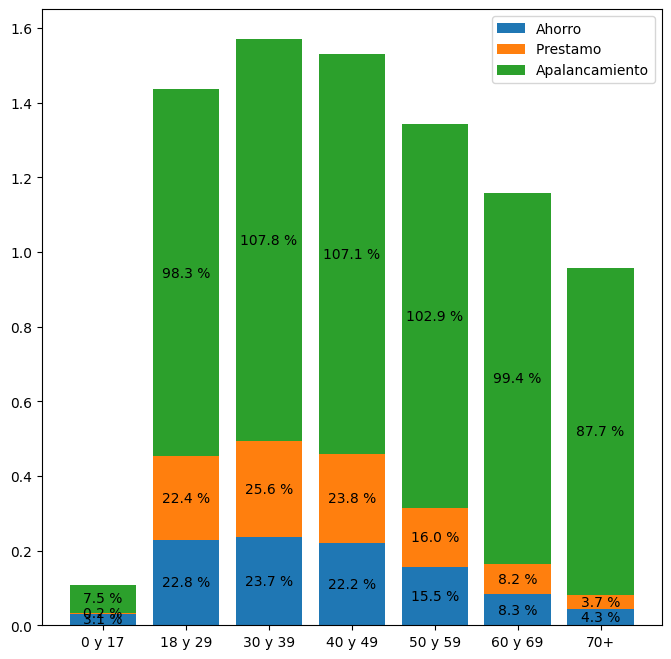

In [ ]:
# Cuanto prestamo obtienen en relacion al resto de rangos cada grupo de edad ----> Sin cambios!!! Es lo que se quiere pero no la realidad

A=T_df_ahorro_y_credito_edad[['ahorro_0_y_17','ahorro_18_y_29','ahorro_30_y_39','ahorro_40_y_49','ahorro_50_y_59','ahorro_60_y_69','ahorro_mas_de_70']].mean()

B=T_df_ahorro_y_credito_edad[['prestamo_0_y_17','prestamo_18_y_29','prestamo_30_y_39','prestamo_40_y_49','prestamo_50_y_59','prestamo_60_y_69','prestamo_mas_de_70']].mean()


print(A)
print(B)

C=[]

#print(C)


ahorro = []
prestamo = []
apalancamiento = []

for i in [0,1,2,3,4,5,6]:
  ahorro.append(A[i])

for i in [0,1,2,3,4,5,6]:
  prestamo.append(B[i])

for i in [0,1,2,3,4,5,6]:
  apalancamiento.append(B[i]/A[i])


x= []

x = ['0 y 17', '18 y 29', '30 y 39', '40 y 49', '50 y 59', '60 y 69', '70+']

ahorro =np.array(ahorro)
prestamo =np.array(prestamo)
apalancamiento =np.array(apalancamiento)


rango_edad = x

weight_counts = {
    "Ahorro": ahorro,
    "Prestamo ": prestamo,
    "Apalancamiento": apalancamiento
}


x = ['0 y 17', '18 y 29', '30 y 39', '40 y 49', '50 y 59', '60 y 69', '70+']

width = 0.8

fig, ax = plt.subplots()
bottom = np.zeros(7)

for boolean, weight_count in weight_counts.items():
    p = ax.bar(rango_edad, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count
    #ax.bar_label(p, label_type='center')
    ax.bar_label(p,fmt=lambda x: '{:.1f} %'.format(x * 100), label_type='center')


#ax.set_title("Media del crédito otorgado según rango de edad y finalidad (USD)")
#ax.set_title()
ax.legend(loc="upper right")
#ax.set_ylabel('Suma de la media de las proporciones')
#ax.set_ylabel('Suma de la media del crédito otorgado')

#ax.set_yscale('symlog')

#ax.yaxis.set_major_locator(ticker.FixedLocator([0,.1,.5,1,6]))
#ax.yaxis.set_major_formatter(ticker.FixedFormatter([0,.1,.5,1,6]))

fig.set_size_inches(8, 8)

#plt.savefig("prestamos_por_edad_y_fin.g")
plt.show()


ahorro_0_y_17       0.031192
ahorro_18_y_29      0.228331
ahorro_30_y_39      0.237442
ahorro_40_y_49      0.221768
ahorro_50_y_59      0.155023
ahorro_60_y_69      0.082554
ahorro_mas_de_70    0.042782
dtype: float64
prestamo_0_y_17       0.010510
prestamo_18_y_29      0.930070
prestamo_30_y_39      1.098447
prestamo_40_y_49      1.028756
prestamo_50_y_59      0.706640
prestamo_60_y_69      0.368352
prestamo_mas_de_70    0.168970
dtype: float64


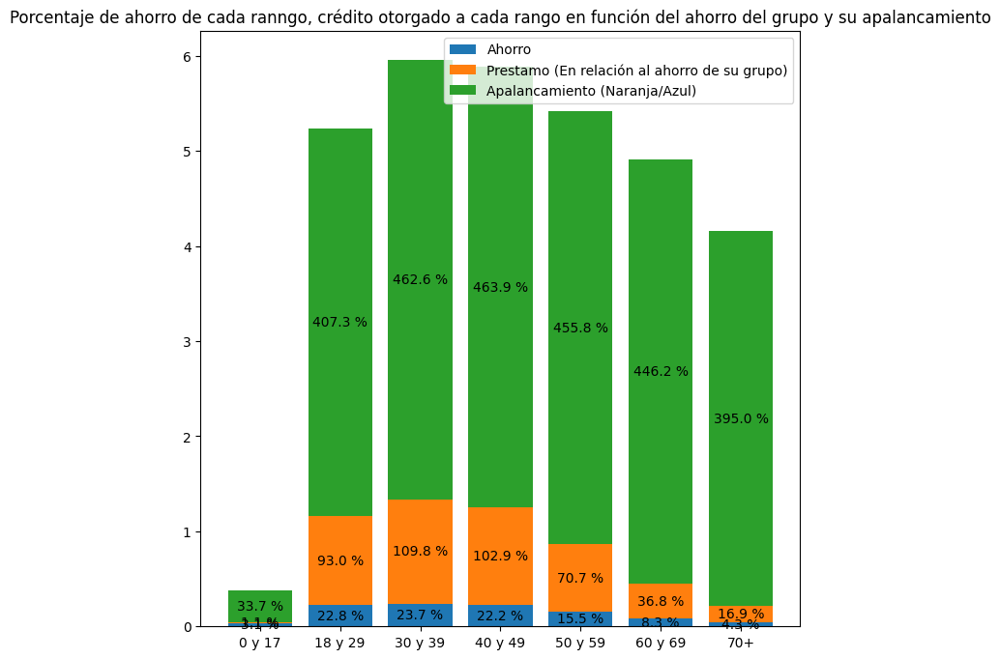

In [63]:
# Cuanto prestamo obtienen en relacion al ahorro cada grupo de edad

A=T_df_ahorro_y_credito_edad[['ahorro_0_y_17','ahorro_18_y_29','ahorro_30_y_39','ahorro_40_y_49','ahorro_50_y_59','ahorro_60_y_69','ahorro_mas_de_70']].mean()

B=T_df_ahorro_y_credito_edad[['prestamo_0_y_17','prestamo_18_y_29','prestamo_30_y_39','prestamo_40_y_49','prestamo_50_y_59','prestamo_60_y_69','prestamo_mas_de_70']].mean()


print(A)
print(B)

C=[]

#print(C)


ahorro = []
prestamo = []
apalancamiento = []

for i in [0,1,2,3,4,5,6]:
  ahorro.append(A[i])

for i in [0,1,2,3,4,5,6]:
  prestamo.append(B[i])

for i in [0,1,2,3,4,5,6]:
  apalancamiento.append(B[i]/A[i])


x= []

x = ['0 y 17', '18 y 29', '30 y 39', '40 y 49', '50 y 59', '60 y 69', '70+']

ahorro =np.array(ahorro)
prestamo =np.array(prestamo)
apalancamiento =np.array(apalancamiento)


rango_edad = x

weight_counts = {
    "Ahorro": ahorro,
    "Prestamo (En relación al ahorro de su grupo)": prestamo,
    "Apalancamiento (Naranja/Azul)": apalancamiento
}


x = ['0 y 17', '18 y 29', '30 y 39', '40 y 49', '50 y 59', '60 y 69', '70+']

width = 0.8

fig, ax = plt.subplots()
bottom = np.zeros(7)

for boolean, weight_count in weight_counts.items():
    p = ax.bar(rango_edad, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count
    #ax.bar_label(p, label_type='center')
    ax.bar_label(p,fmt=lambda x: '{:.1f} %'.format(x * 100), label_type='center')


ax.set_title("Porcentaje de ahorro de cada ranngo, crédito otorgado a cada rango en función del ahorro del grupo y su apalancamiento")
#ax.set_title()
ax.legend(loc="upper right")
#ax.set_ylabel('Suma de la media de las proporciones')
#ax.set_ylabel('Suma de la media del crédito otorgado')

#ax.set_yscale('symlog')

#ax.yaxis.set_major_locator(ticker.FixedLocator([0,.1,.5,1,6]))
#ax.yaxis.set_major_formatter(ticker.FixedFormatter([0,.1,.5,1,6]))

fig.set_size_inches(8, 8)

#plt.savefig("prestamos_por_edad_y_fin.g")
plt.show()


In [ ]:
df['monto_prest_total'] = CustomDataFrame(pd.Series(dtype='float'))

df=CustomDataFrame(df)

df = df.tolist(include_columns=True)

for t in df[1]:
  t[-1] = T_df.loc[T_df['grupo_id'] == t[0]].prestado_total.values[0]

df= CustomDataFrame(pd.DataFrame(df[1], columns=df[0]))

df['monto_prest_total'] = df['porc_prest_total_tambo'] * df['monto_prest_total'] 

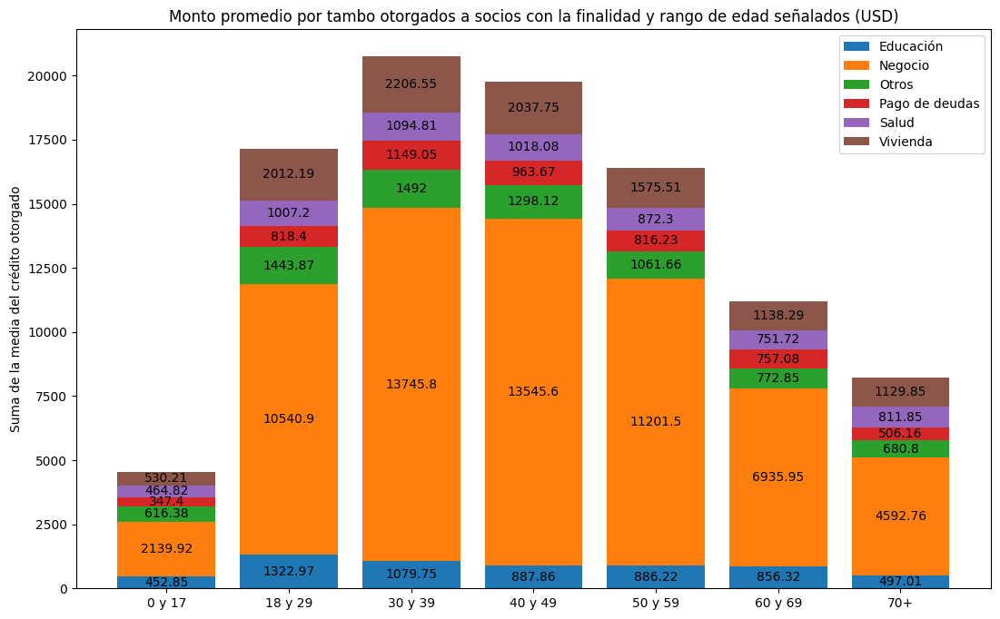

In [ ]:
#df = C_df.groupby(['cliente_id','rango_edad_cliente','finalidad'], as_index=False)['monto'].mean() # media prestamo por persona
#df = C_df.groupby(['grupo_id','rango_edad_cliente','finalidad'], as_index=False)['porc_prest_total_tambo'].sum()  # por tambo -------> esta es
#df

#df2 = df.groupby(['rango_edad_cliente','finalidad'], as_index=False)['monto'].mean() # Media por persona de prestamo
df2 = df.groupby(['rango_edad_cliente','finalidad'], as_index=False)['monto_prest_total'].mean() # porcentaje del total del prestamo del tambo segun rango de edad

df2.drop(df2.tail(9).index,inplace = True)
df2 = CustomDataFrame(df2)

#df2

edu = []
negocio = []
otros = []
pago_deudas = []
salud = []
vivienda = []

df2 = df2.tolist(include_columns=True)

for i in df2[1]:
  if i[1] == 'Educación':
    edu.append(round(i[2],2))
  elif i[1] == 'Negocio':
    negocio.append(round(i[2],2)) 
  elif i[1] == 'Otros':
    otros.append(round(i[2],2)) 
  elif i[1] == 'Pago de deudas':
    pago_deudas.append(round(i[2],2))
  elif i[1] == 'Salud':
    salud.append(round(i[2],2))   
  elif i[1] == 'Vivienda':
    vivienda.append(round(i[2],2))   

df2= CustomDataFrame(pd.DataFrame(df2[1], columns=df2[0]))

x= []

x = ['0 y 17', '18 y 29', '30 y 39', '40 y 49', '50 y 59', '60 y 69', '70+']

edu =np.array(edu)
negocio =np.array(negocio)
otros =np.array(otros)
pago_deudas =np.array(pago_deudas)
salud =np.array(salud)
vivienda =np.array(vivienda)


rango_edad = x

weight_counts = {
    "Educación": edu,
    "Negocio": negocio,
    "Otros": otros,
    "Pago de deudas": pago_deudas,
    "Salud": salud,
    "Vivienda": vivienda,
}
width = 0.8

fig, ax = plt.subplots()
bottom = np.zeros(7)

for boolean, weight_count in weight_counts.items():
    p = ax.bar(rango_edad, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count
    ax.bar_label(p, label_type='center')
    #ax.bar_label(p,fmt=lambda x: '{:.1f} %'.format(x * 100), label_type='center')


#ax.set_title("Media del crédito otorgado según rango de edad y finalidad (USD)")
ax.set_title("Monto promedio por tambo otorgados a socios con la finalidad y rango de edad señalados (USD)")
ax.legend(loc="upper right")
#ax.set_ylabel('Suma de la media de las proporciones')
ax.set_ylabel('Suma de la media del crédito otorgado')

#ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))
fig.set_size_inches(13, 8)

#plt.savefig("prestamos_por_edad_y_fin.g")
plt.show()


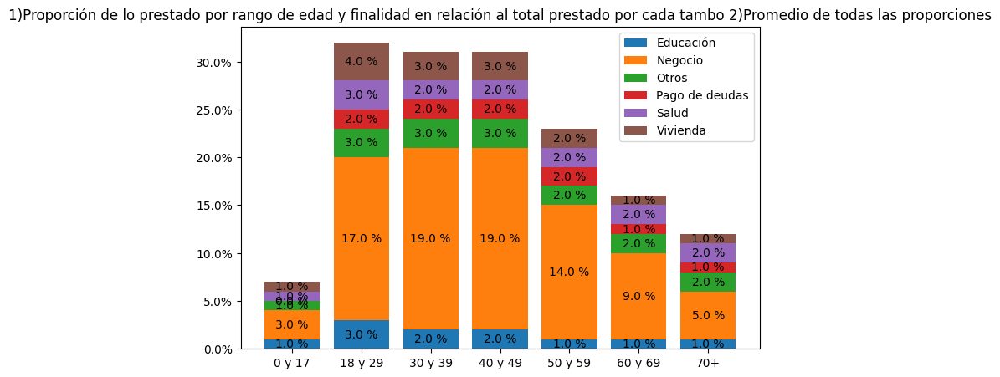

In [ ]:
#df = C_df.groupby(['cliente_id','rango_edad_cliente','finalidad'], as_index=False)['monto'].mean() # media prestamo por persona
df = C_df.groupby(['grupo_id','rango_edad_cliente','finalidad'], as_index=False)['porc_prest_total_tambo'].sum()  # por tambo
#df

#df2 = df.groupby(['rango_edad_cliente','finalidad'], as_index=False)['monto'].mean() # Media por persona de prestamo
df2 = df.groupby(['rango_edad_cliente','finalidad'], as_index=False)['porc_prest_total_tambo'].mean() # porcentaje del total del prestamo del tambo segun rango de edad

df2.drop(df2.tail(9).index,inplace = True)
df2 = CustomDataFrame(df2)

#df2

edu = []
negocio = []
otros = []
pago_deudas = []
salud = []
vivienda = []

df2 = df2.tolist(include_columns=True)

for i in df2[1]:
  if i[1] == 'Educación':
    edu.append(round(i[2],2))
  elif i[1] == 'Negocio':
    negocio.append(round(i[2],2)) 
  elif i[1] == 'Otros':
    otros.append(round(i[2],2)) 
  elif i[1] == 'Pago de deudas':
    pago_deudas.append(round(i[2],2))
  elif i[1] == 'Salud':
    salud.append(round(i[2],2))   
  elif i[1] == 'Vivienda':
    vivienda.append(round(i[2],2))   

df2= CustomDataFrame(pd.DataFrame(df2[1], columns=df2[0]))

x= []

x = ['0 y 17', '18 y 29', '30 y 39', '40 y 49', '50 y 59', '60 y 69', '70+']

edu =np.array(edu)
negocio =np.array(negocio)
otros =np.array(otros)
pago_deudas =np.array(pago_deudas)
salud =np.array(salud)
vivienda =np.array(vivienda)


rango_edad = x

weight_counts = {
    "Educación": edu,
    "Negocio": negocio,
    "Otros": otros,
    "Pago de deudas": pago_deudas,
    "Salud": salud,
    "Vivienda": vivienda,
}
width = 0.8

fig, ax = plt.subplots()
bottom = np.zeros(7)

for boolean, weight_count in weight_counts.items():
    p = ax.bar(rango_edad, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count
    #ax.bar_label(p, label_type='center')
    ax.bar_label(p,fmt=lambda x: '{:.1f} %'.format(x * 100), label_type='center')


#ax.set_title("Media del crédito otorgado según rango de edad y finalidad (USD)")
ax.set_title("1)Proporción de lo prestado por rango de edad y finalidad en relación al total prestado por cada tambo 2)Promedio de todas las proporciones")
ax.legend(loc="upper right")
#ax.set_ylabel('Suma de la media de las proporciones')
#ax.set_ylabel('Suma de la media del crédito otorgado')

ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))
fig.set_size_inches(8, 5)

#plt.savefig("prestamos_por_edad_y_fin.g")
plt.show()


In [ ]:
#Porcentaje de prestamo por tambo dividido por finalidad

#df = C_df.groupby(['cliente_id','rango_edad_cliente','finalidad'], as_index=False)['monto'].mean() # media prestamo por persona
df = C_df.groupby(['grupo_id','finalidad'], as_index=False)['porc_prest_total_tambo'].sum()  # por tambo
df

#df2 = df.groupby(['rango_edad_cliente','finalidad'], as_index=False)['monto'].mean() # Media por persona de prestamo
df2 = df.groupby(['finalidad'], as_index=False)['porc_prest_total_tambo'].mean() # porcentaje del total del prestamo del tambo segun rango de edad
df2


,finalidad,porc_prest_total_tambo
0,Educación,0.045809
1,Negocio,0.627119
2,Otros,0.069985
3,Pago de deudas,0.036595
4,Salud,0.053940
5,Vivienda,0.072063


In [ ]:
x

['Promedio tambos']

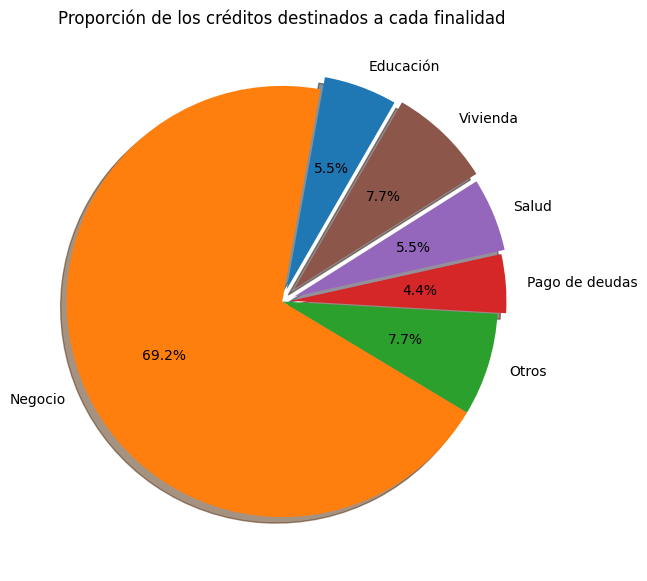

In [ ]:
#Porcentaje de prestamo por tambo dividido por finalidad
df = C_df.groupby(['grupo_id','finalidad'], as_index=False)['porc_prest_total_tambo'].sum()  # por tambo
df2 = df.groupby(['finalidad'], as_index=False)['porc_prest_total_tambo'].mean() # porcentaje del total del prestamo del tambo segun rango de edad

df2 = CustomDataFrame(df2)

df2 = df2.tolist(include_columns=True)

for i in df2[1]:
  if i[0] == 'Educación':
    edu=(round(i[1],2))
  elif i[0] == 'Negocio':
    negocio = (round(i[1],2)) 
  elif i[0] == 'Otros':
    otros = (round(i[1],2)) 
  elif i[0] == 'Pago de deudas':
    pago_deudas = (round(i[1],2))
  elif i[0] == 'Salud':
    salud = (round(i[1],2))   
  elif i[0] == 'Vivienda':
    vivienda = (round(i[1],2))   

df2= CustomDataFrame(pd.DataFrame(df2[1], columns=df2[0]))


weight = [edu,negocio,otros,pago_deudas,salud,vivienda]

lab = ["Educación","Negocio","Otros","Pago de deudas","Salud","Vivienda"]


fig, ax = plt.subplots()

explode = (0.06, 0, 0, 0.04, 0.06, 0.08)

p = ax.pie(weight, explode = explode, labels = lab, autopct='%1.1f%%',shadow=True, startangle=(60))


ax.set_title("Proporción de los créditos destinados a cada finalidad")
fig.set_size_inches(7, 7)

plt.show()


In [ ]:
C_df.groupby(['cliente_id'])['cliente_id'].sum()

cliente_id
2           30
4           16
7           14
8           24
11         176
         ...  
43554    43554
43561    43561
43611    43611
43617    43617
43618    43618
Name: cliente_id, Length: 29782, dtype: int64

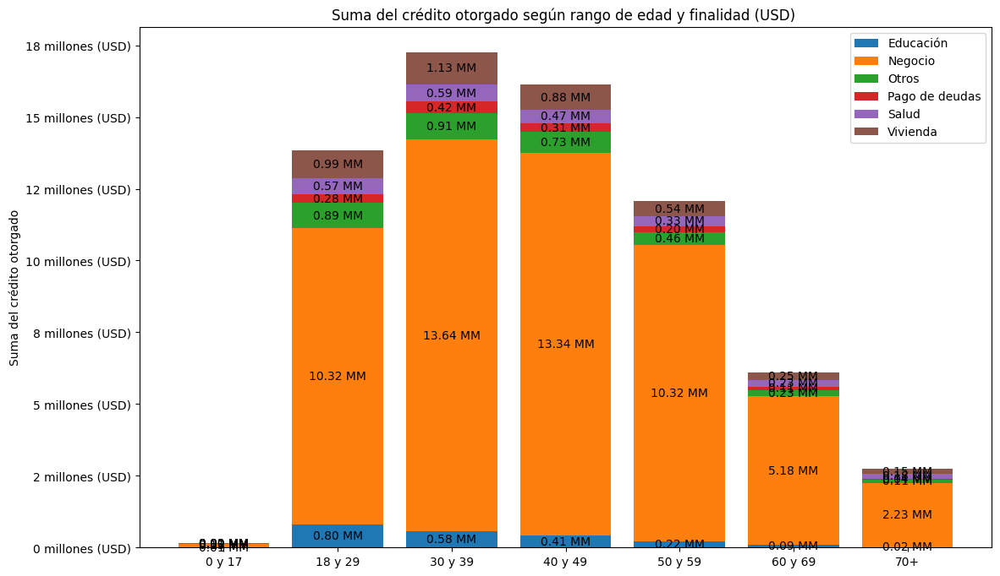

In [ ]:
# Suma total de credito
df2 = C_df.groupby(['rango_edad_cliente','finalidad'], as_index=False)['monto'].sum() # media prestamo por persona

df2.drop(df2.tail(9).index,inplace = True)
df2 = CustomDataFrame(df2)

#df2

edu = []
negocio = []
otros = []
pago_deudas = []
salud = []
vivienda = []

df2 = df2.tolist(include_columns=True)

for i in df2[1]:
  if i[1] == 'Educación':
    edu.append(round(i[2],2))
  elif i[1] == 'Negocio':
    negocio.append(round(i[2],2)) 
  elif i[1] == 'Otros':
    otros.append(round(i[2],2)) 
  elif i[1] == 'Pago de deudas':
    pago_deudas.append(round(i[2],2))
  elif i[1] == 'Salud':
    salud.append(round(i[2],2))   
  elif i[1] == 'Vivienda':
    vivienda.append(round(i[2],2))   

df2= CustomDataFrame(pd.DataFrame(df2[1], columns=df2[0]))

x= []

x = ['0 y 17', '18 y 29', '30 y 39', '40 y 49', '50 y 59', '60 y 69', '70+']

edu =np.array(edu)
negocio =np.array(negocio)
otros =np.array(otros)
pago_deudas =np.array(pago_deudas)
salud =np.array(salud)
vivienda =np.array(vivienda)


rango_edad = x

weight_counts = {
    "Educación": edu,
    "Negocio": negocio,
    "Otros": otros,
    "Pago de deudas": pago_deudas,
    "Salud": salud,
    "Vivienda": vivienda,
}
width = 0.8

fig, ax = plt.subplots()
bottom = np.zeros(7)

for boolean, weight_count in weight_counts.items():
    p = ax.bar(rango_edad, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count
    ax.bar_label(p, fmt=lambda x: '{:.2f} MM'.format(x / 1000000),label_type='center')
    #ax.bar_label(p,fmt=lambda x: '{:.1f} %'.format(x * 100), label_type='center')


#ax.set_title("Media del crédito otorgado según rango de edad y finalidad (USD) ")
ax.set_title("Suma del crédito otorgado según rango de edad y finalidad (USD) ") #pedidos por 29,782 personas
ax.legend(loc="upper right")
#ax.set_ylabel('Suma de la media de las proporciones')
ax.set_ylabel('Suma del crédito otorgado')

from matplotlib import ticker

ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x,pos:'{:.0f} millones (USD)'.format(x / 1000000))) #x/1000
fig.set_size_inches(13, 8)

#plt.savefig("prestamos_por_edad_y_fin.g")
plt.show()


In [ ]:
df2 = C_df.groupby(['finalidad'], as_index=False)['monto'].sum() # media prestamo por persona
#df2.drop(df2.tail(9).index,inplace = True)
df2['monto'] = df2['monto']/ (29782 * 9)
df2['porc'] = 100*(df2['monto']/df2['monto'].sum())
df2

,finalidad,monto,porc
0,Educación,8.694782,3.027542
1,Negocio,232.875259,81.087683
2,Otros,14.137047,4.922551
3,Pago de deudas,6.091337,2.121017
4,Salud,9.602866,3.343739
5,Vivienda,15.788147,5.497468


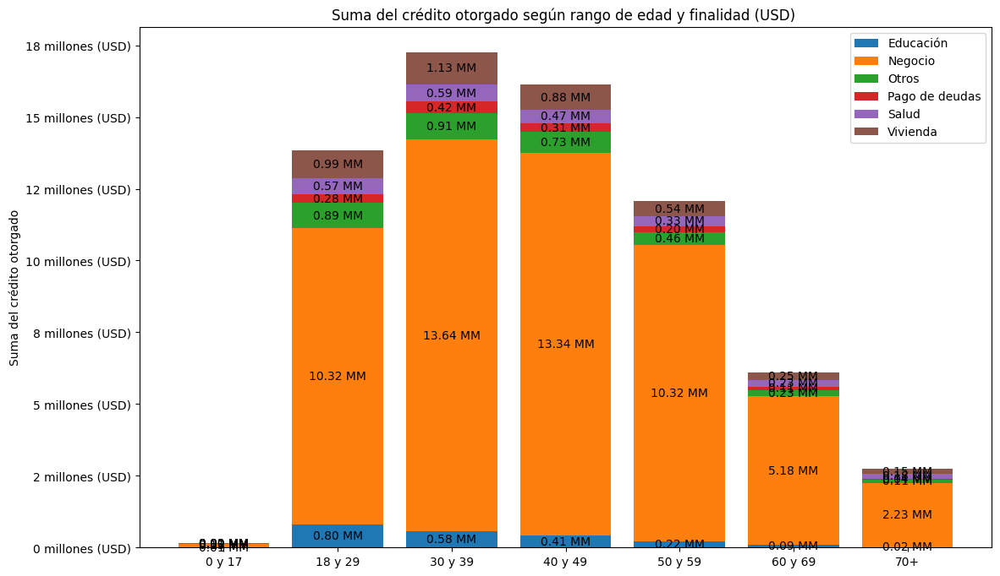

In [ ]:
# Suma total de credito por persona por año
df2 = C_df.groupby(['rango_edad_cliente','finalidad'], as_index=False)['monto'].sum() # media prestamo por persona

df2.drop(df2.tail(9).index,inplace = True)
df2 = CustomDataFrame(df2)

#df2

edu = []
negocio = []
otros = []
pago_deudas = []
salud = []
vivienda = []

df2 = df2.tolist(include_columns=True)

for i in df2[1]:
  if i[1] == 'Educación':
    edu.append(round(i[2],2))
  elif i[1] == 'Negocio':
    negocio.append(round(i[2],2)) 
  elif i[1] == 'Otros':
    otros.append(round(i[2],2)) 
  elif i[1] == 'Pago de deudas':
    pago_deudas.append(round(i[2],2))
  elif i[1] == 'Salud':
    salud.append(round(i[2],2))   
  elif i[1] == 'Vivienda':
    vivienda.append(round(i[2],2))   

df2= CustomDataFrame(pd.DataFrame(df2[1], columns=df2[0]))

x= []

x = ['0 y 17', '18 y 29', '30 y 39', '40 y 49', '50 y 59', '60 y 69', '70+']

edu =np.array(edu)
negocio =np.array(negocio)
otros =np.array(otros)
pago_deudas =np.array(pago_deudas)
salud =np.array(salud)
vivienda =np.array(vivienda)


rango_edad = x

weight_counts = {
    "Educación": edu,
    "Negocio": negocio,
    "Otros": otros,
    "Pago de deudas": pago_deudas,
    "Salud": salud,
    "Vivienda": vivienda,
}
width = 0.8

fig, ax = plt.subplots()
bottom = np.zeros(7)

for boolean, weight_count in weight_counts.items():
    p = ax.bar(rango_edad, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count
    ax.bar_label(p, fmt=lambda x: '{:.2f} MM'.format(x / 1000000),label_type='center')
    #ax.bar_label(p,fmt=lambda x: '{:.1f} %'.format(x * 100), label_type='center')


#ax.set_title("Media del crédito otorgado según rango de edad y finalidad (USD) ")
ax.set_title("Suma del crédito otorgado según rango de edad y finalidad (USD) ") #pedidos por 29,782 personas
ax.legend(loc="upper right")
#ax.set_ylabel('Suma de la media de las proporciones')
ax.set_ylabel('Suma del crédito otorgado')

from matplotlib import ticker

ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x,pos:'{:.0f} millones (USD)'.format(x / 1000000))) #x/1000
fig.set_size_inches(13, 8)

#plt.savefig("prestamos_por_edad_y_fin.g")
plt.show()


## Localidad 

In [ ]:
T_df.loc[T_df['oficina_superior']]

,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad
0,3,2014-09-18,NaT,Activo,SANTA ELENA,Rural
1,7,2014-09-19,NaT,Activo,SANTA ELENA,Rural
2,4,2014-09-20,NaT,Activo,SANTA ELENA,Periurbano
3,2,2014-09-20,NaT,Activo,SANTA ELENA,Rural
4,1,2014-10-01,NaT,Activo,CHIMBORAZO,Rural
...,...,...,...,...,...,...
1222,1304,2023-03-21,NaT,Activo,GUAYAS,Urbano
1223,1305,2023-03-21,NaT,Activo,LOJA,Urbano
1224,1306,2023-03-22,NaT,Activo,LOJA,Rural
1225,1309,2023-03-24,NaT,Activo,LOJA,Urbano


In [ ]:

df

,grupo_id
oficina_superior,
CHIMBORAZO,49
GUAYAS,61
LOJA,40
MANABI,83
SANTA ELENA,994


In [ ]:
df=CustomDataFrame(T_df.groupby(['localidad'])['grupo_id'].count())

df

,grupo_id
localidad,
Periurbano,179
Rural,533
Urbano,515


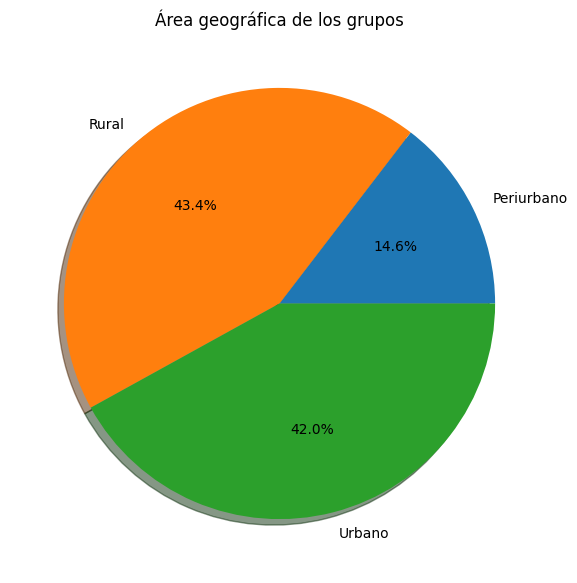

In [ ]:
#Porcentaje de prestamo por tambo dividido por finalidad

weight = [179,533,515]

lab = ["Periurbano","Rural","Urbano"]


fig, ax = plt.subplots()

explode = (0.1, 0, 0, 0.1, 0.1, 0.1)

#autopct='%1.1f%%'
#explode = explode

p = ax.pie(weight, labels = lab, autopct='%.1f%%', shadow=True, startangle=(0))


ax.set_title("Área geográfica de los grupos")
fig.set_size_inches(7, 7)

plt.show()


## Familiaridad y Antiguedad

In [ ]:
T_df.head(1)

In [ ]:
analisis = analisis.filter(['familiaridad_en_tambo', 'tiempo_en_comun_years'], axis=1)


profile = ProfileReport(analisis,title='Mi Reporte')
profile

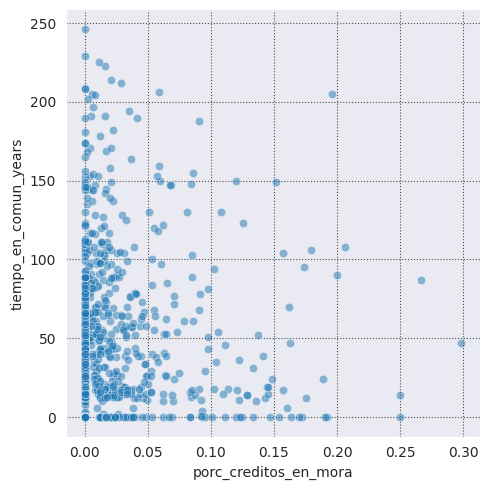

In [71]:
df= CustomDataFrame(T_df.loc[ (T_df['porc_creditos_en_mora'] >=0) & (T_df['porc_creditos_en_mora'] <=0.3) & (T_df['tiempo_en_comun_years'] <=250) ] )
#& (T_df['familiaridad_en_tambo'] >=1) & (T_df['estado'] == 'Activo') 


# Scatter plot entre antiguedad, familiaridad y en tamaño porc_cred_sin_mora = 1-porc_cred_con_mora

#sns.scatterplot(data=T_df, y="tiempo_en_comun_years", x="familiaridad_en_tambo", alpha=0.5 )

#sns.set_style( {"grid.linestyle": ":"})

sns.relplot(
    data=df, x="porc_creditos_en_mora", y="tiempo_en_comun_years", alpha=0.5, kind="scatter"
    #, hue='porc_creditos_en_mora', row='estado' , hue='porc_creditos_en_mora', size= 'porc_creditos_en_mora',sizes=(20, 200)
)

#hue="montos_ex", size="porc_creditos_en_mora",sizes=(20, 200), hue_norm=(0, 7)

# Show the plot
plt.show()




In [ ]:
df= CustomDataFrame(T_df.loc[ (T_df['porc_creditos_en_mora'] >=0) & (T_df['porc_creditos_en_mora'] < .4)]  )
#(T_df['estado'] == 'Activo') & & (T_df['familiaridad_en_tambo'] >=1)
import matplotlib.pyplot as plt

# Scatter plot entre antiguedad, familiaridad y en tamaño porc_cred_sin_mora = 1-porc_cred_con_mora

#sns.scatterplot(data=T_df, y="tiempo_en_comun_years", x="familiaridad_en_tambo", alpha=0.5 )

sns.set_style("darkgrid", {"grid.color": ".3", "grid.linestyle": ":"})

sns.relplot(
    data=df, x="porc_creditos_en_mora", y="montos_ex", alpha=0.5, kind="scatter", col='estado'
    #, hue='porc_creditos_en_mora', row='estado' , size= 'porc_creditos_en_mora',sizes=(20, 200), col="localidad" 
)



#hue="montos_ex", size="porc_creditos_en_mora",sizes=(20, 200), hue_norm=(0, 7)

In [ ]:
T_df.head(1)

,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad,ahorro_total,prestado_total,personas_en_tambo,antiguedad_tambo_dias,antiguedad_tambo_meses,antiguedad_tambo_anos,tiempo_en_comun_years,volumen_de_credito_sin_mora,volumen_de_credito_con_mora,montos_ex,familiaridad_en_tambo,porc_creditos_en_mora
0,3,2014-09-18,NaT,Activo,SANTA ELENA,Rural,31125,241562.12,63,3158.0,103.0,8.0,263.0,225935.43,17826.69,8,1.32632,0.055777


In [84]:
df= CustomDataFrame(T_df.loc[(T_df['porc_creditos_en_mora'] >=0) & (T_df['porc_creditos_en_mora'] < .4)  & (T_df['familiaridad_en_tambo'] >=1) ]  )
#(T_df['estado'] == 'Activo') && (T_df['familiaridad_en_tambo'] >=1) & (T_df['tiempo_en_comun_years'] < 300)
import matplotlib.pyplot as plt

# Scatter plot entre antiguedad, familiaridad y en tamaño porc_cred_sin_mora = 1-porc_cred_con_mora

#sns.scatterplot(data=T_df, y="tiempo_en_comun_years", x="familiaridad_en_tambo", alpha=0.5 )

sns.relplot(
    data=df, x="localidad", y="familiaridad_en_tambo", alpha=0.5, kind="violin"
    #, hue='porc_creditos_en_mora', row='estado' , size= 'porc_creditos_en_mora',sizes=(20, 200), col="localidad", hue='prestado_total', size= 'montos_ex',sizes=(20, 200)
)

sns.set_style("darkgrid", {"grid.color": ".3", "grid.linestyle": ":"})

#hue="montos_ex", size="porc_creditos_en_mora",sizes=(20, 200), hue_norm=(0, 7)
 


ValueError: ignored

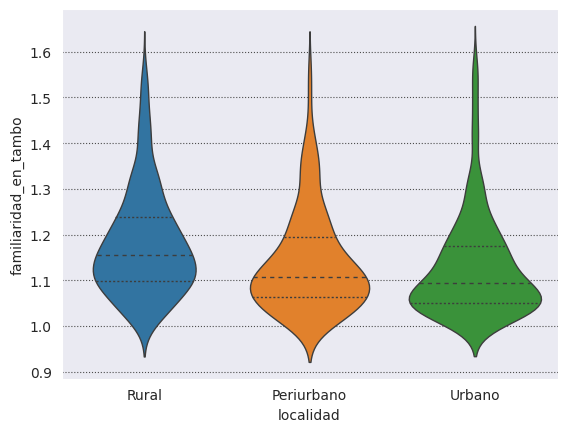

In [88]:
df= CustomDataFrame(T_df.loc[ (T_df['familiaridad_en_tambo'] <=1.6) & (T_df['familiaridad_en_tambo'] >=1)] )
#(T_df['estado'] == 'Activo') && (T_df['familiaridad_en_tambo'] >=1) & (T_df['tiempo_en_comun_years'] < 300)
import matplotlib.pyplot as plt

# Scatter plot entre antiguedad, familiaridad y en tamaño porc_cred_sin_mora = 1-porc_cred_con_mora

#sns.scatterplot(data=T_df, y="tiempo_en_comun_years", x="familiaridad_en_tambo", alpha=0.5 )

sns.violinplot(
    data=df, x="localidad", y="familiaridad_en_tambo",  linewidth=1,split=True,inner="quart"
    #, hue='porc_creditos_en_mora', row='estado' , size= 'porc_creditos_en_mora',sizes=(20, 200), col="localidad", hue='prestado_total', size= 'montos_ex',sizes=(20, 200)
)

sns.set_style("darkgrid", {"grid.color": ".3", "grid.linestyle": ":"})

#hue="montos_ex", size="porc_creditos_en_mora",sizes=(20, 200), hue_norm=(0, 7)
 


## Tiempo en comun y monto de credito o similar


In [78]:
df= CustomDataFrame(T_df.loc[  (T_df['porc_creditos_en_mora'] >=0)& (T_df['tiempo_en_comun_years'] <=150) & (T_df['porc_creditos_en_mora'] <=0.2) & (T_df['montos_ex'] >=0)]  )
#& (T_df['montos_ex'] >=0) (T_df['estado'] == 'Activo') &
import matplotlib.pyplot as plt

# Scatter plot entre antiguedad, familiaridad y en tamaño porc_cred_sin_mora = 1-porc_cred_con_mora

#sns.scatterplot(data=T_df, y="tiempo_en_comun_years", x="familiaridad_en_tambo", alpha=0.5 )

sns.relplot(
    data=df, y="tiempo_en_comun_years", x="porc_creditos_en_mora", alpha=0.5, kind="scatter", size= 'montos_ex',sizes=(20, 200), hue="montos_ex", col='estado' 
    #, hue='porc_creditos_en_mora', row='estado' , size= 'porc_creditos_en_mora',sizes=(20, 200) , size= 'montos_ex',sizes=(20, 200), hue="montos_ex", col="localidad"
)

sns.set_style("darkgrid", {"grid.color": ".3", "grid.linestyle": ":"})

#hue="montos_ex", size="porc_creditos_en_mora",sizes=(20, 200), hue_norm=(0, 7)
 


KeyError: ignored

## Porcentaje de intereses reinvertidos


In [132]:
U_df = CustomDataFrame(pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/RRUU realizados por tambos - Ecuador (12-05-2023) .csv', delimiter = ';', decimal=',',na_values={'',' '}, parse_dates=['start_date','end_date']))
U_df.rename(columns = {'group_id':'grupo_id','end_date':'mes_aporte' }, inplace = True)
U_df['mes_aporte'] = U_df['mes_aporte'].dt.to_period("M")
U_df.head()

#U_df['porcentaje_rein'] = (df.loc[(df['grupo_id'] == U_df.group_id) & (df['end_date'].month == df.mes_aporte)].) / (df.loc[(df['grupo_id'] == U_df.group_id) & (df['end_date'].month == df.mes_aporte)].distributed_utilities)

,grupo_id,period_name,start_date,mes_aporte,distributed_utilities
0,1,Octubre 2014 - Noviembre 2015,2014-10-01,2015-11,2437.02
1,1,Noviembre 2015 - Noviembre 2016,2015-11-09,2016-11,6439.68
2,1,Noviembre 2016 - Noviembre 2017,2016-11-07,2017-11,10444.06
3,1,Noviembre 2017 - Noviembre 2018,2017-11-06,2018-11,10827.45
4,1,Noviembre 2018 - Diciembre 2019,2018-11-05,2019-12,12800.19


In [131]:
df = CustomDataFrame(tabla_balance.groupby(['grupo_id','mes_aporte'], as_index=False)['monto_entrada'].sum())
df['mes_aporte'] = df['mes_aporte'].dt.to_period("M")
df.loc[(df['grupo_id'] == 1) & (df['mes_aporte'] > '2015-10-09')].head(10)

,grupo_id,mes_aporte,monto_entrada
115,1,2015-11,1310.0
116,1,2015-12,430.0
117,1,2016-01,440.0
118,1,2016-02,600.0
119,1,2016-03,370.0
120,1,2016-04,490.0
121,1,2016-05,1530.0
122,1,2016-06,640.0
123,1,2016-07,450.0
124,1,2016-08,740.0


In [45]:
tabla_balance.loc[(tabla_balance['grupo_id'] == 1) & (tabla_balance['mes_aporte'] < '2015-11-30')]

,cliente_id,mes_aporte,monto_entrada,monto_salida,Cuota,balance_mensual,grupo_id
0,1,2014-10-01,20.0,NaN,NaN,20.00,1
1,1,2015-01-01,-20.0,NaN,NaN,-20.00,1
2,2,2014-10-01,20.0,NaN,NaN,20.00,1
3,2,2014-12-01,10.0,NaN,NaN,10.00,1
4,2,2015-01-01,10.0,NaN,NaN,10.00,1
...,...,...,...,...,...,...,...
776418,364,2015-08-01,NaN,NaN,60.61,60.61,1
776459,365,2014-12-01,NaN,NaN,72.07,72.07,1
776511,368,2015-08-01,NaN,NaN,104.00,104.00,1
778186,505,2015-10-01,NaN,NaN,224.62,224.62,1


In [162]:
# Creacion de la nueva tabla A_df
#
#A_df['inicio_periodo'] = pd.Series(dtype='datetime64[ns]')
#A_df['termino_periodo'] = pd.Series(dtype='datetime64[ns]')
#
#for index, row in A_df.iterrows():
#    try:
#      inicio_periodo = U_df.loc[(U_df['start_date'] <= row['fecha_aporte']) & (U_df['end_date'] >= row['fecha_aporte']) & (U_df['group_id'] == row['grupo_id'])]['start_date'].values[0]
#      termino_periodo = U_df.loc[(U_df['start_date'] <= row['fecha_aporte']) & (U_df['end_date'] >= row['fecha_aporte']) & (U_df['group_id'] == row['grupo_id'])]['end_date'].values[0]
#      
#      A_df.at[index, 'inicio_periodo'] = inicio_periodo
#      A_df.at[index, 'termino_periodo'] = termino_periodo
#    except IndexError: 
#      print('Error cliente_id:', row['cliente_id'])
#
#from google.colab import drive
#drive.mount('/content/drive', force_remount=True)
#path = '/content/drive/MyDrive/TFM/datos_csv/A_df.csv'
#with open(path, 'w', encoding = 'utf-8-sig') as f:
#  A_df.to_csv(f)

Streaming output truncated to the last 5000 lines.
Error cliente_id: 15878
Error cliente_id: 15880
Error cliente_id: 15882
Error cliente_id: 15883
Error cliente_id: 15884
Error cliente_id: 15885
Error cliente_id: 15886
Error cliente_id: 15888
Error cliente_id: 16409
Error cliente_id: 16410
Error cliente_id: 16411
Error cliente_id: 20087
Error cliente_id: 21229
Error cliente_id: 21232
Error cliente_id: 21233
Error cliente_id: 34371
Error cliente_id: 40594
Error cliente_id: 40595
Error cliente_id: 42585
Error cliente_id: 42586
Error cliente_id: 42587
Error cliente_id: 43332
Error cliente_id: 16356
Error cliente_id: 16357
Error cliente_id: 16358
Error cliente_id: 16359
Error cliente_id: 16360
Error cliente_id: 16361
Error cliente_id: 16362
Error cliente_id: 16363
Error cliente_id: 16364
Error cliente_id: 16365
Error cliente_id: 16709
Error cliente_id: 16710
Error cliente_id: 16711
Error cliente_id: 18620
Error cliente_id: 19083
Error cliente_id: 19084
Error cliente_id: 19754
Error cliente

In [94]:
A_df

,cliente_id,grupo_id,monto,fecha_aporte,inicio_periodo,termino_periodo
0,82,3,10.0,2014-09-18,2014-09-18,2015-12-09
1,83,3,5.0,2014-09-18,2014-09-18,2015-12-09
2,84,3,10.0,2014-09-18,2014-09-18,2015-12-09
3,85,3,5.0,2014-09-18,2014-09-18,2015-12-09
4,86,3,5.0,2014-09-18,2014-09-18,2015-12-09
...,...,...,...,...,...,...
768937,38972,1174,10.0,2023-03-26,NaN,NaN
768938,39912,1174,10.0,2023-03-26,NaN,NaN
768939,42019,1174,10.0,2023-03-26,NaN,NaN
768940,42782,1174,30.0,2023-03-26,NaN,NaN


In [207]:
T_df

,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad,ahorro_total,prestado_total,personas_en_tambo,antiguedad_tambo_dias,antiguedad_tambo_meses,antiguedad_tambo_anos,tiempo_en_comun_years,volumen_de_credito_sin_mora,volumen_de_credito_con_mora
0,3,2014-09-18,NaT,Activo,SANTA ELENA,Rural,31125,241562.12,63,3167.0,103.0,8.0,263.0,225935.43,17826.69
1,7,2014-09-19,NaT,Activo,SANTA ELENA,Rural,40710,294025.52,56,3166.0,103.0,8.0,212.0,282136.07,11889.45
2,4,2014-09-20,NaT,Activo,SANTA ELENA,Periurbano,70095,474206.34,72,3165.0,103.0,8.0,197.0,458230.45,16375.89
3,2,2014-09-20,NaT,Activo,SANTA ELENA,Rural,18585,150833.69,61,3165.0,103.0,8.0,147.0,139823.64,11010.05
4,1,2014-10-01,NaT,Activo,CHIMBORAZO,Rural,66610,581202.38,92,3154.0,102.0,8.0,461.0,446043.75,135158.63
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1222,1304,2023-03-21,NaT,Activo,GUAYAS,Urbano,645,645.00,15,61.0,1.0,0.0,0.0,645.00,NaN
1223,1305,2023-03-21,NaT,Activo,LOJA,Urbano,375,375.00,14,61.0,1.0,0.0,0.0,375.00,NaN
1224,1306,2023-03-22,NaT,Activo,LOJA,Rural,510,515.00,20,60.0,1.0,0.0,0.0,515.00,NaN
1225,1309,2023-03-24,NaT,Activo,LOJA,Urbano,225,225.00,13,58.0,1.0,0.0,0.0,225.00,NaN


In [184]:
df = U_df.filter(['group_id', 'end_date', 'distributed_utilities'])
df=df.rename(columns={"group_id": "grupo_id", "end_date": "fecha_aporte", "distributed_utilities": "monto"})
df

,grupo_id,fecha_aporte,monto
0,1,2015-11-09,2437.02
1,1,2016-11-07,6439.68
2,1,2017-11-06,10444.06
3,1,2018-11-05,10827.45
4,1,2019-12-02,12800.19
...,...,...,...
2620,1064,2023-05-09,632.30
2621,1065,2023-05-07,1027.67
2622,1067,2023-05-07,580.99
2623,1069,2023-05-07,594.50


In [56]:
A_df.groupby('grupo_id')['monto'].agg(pd.Series.mode)

grupo_id
1       10.0
2       10.0
3        5.0
4       10.0
5        5.0
        ... 
1303    15.0
1304    15.0
1305    15.0
1306    15.0
1309    15.0
Name: monto, Length: 1225, dtype: object

In [95]:
U_df

,group_id,period_name,start_date,end_date,distributed_utilities
0,1,Octubre 2014 - Noviembre 2015,2014-10-01,2015-11-09,2437.02
1,1,Noviembre 2015 - Noviembre 2016,2015-11-09,2016-11-07,6439.68
2,1,Noviembre 2016 - Noviembre 2017,2016-11-07,2017-11-06,10444.06
3,1,Noviembre 2017 - Noviembre 2018,2017-11-06,2018-11-05,10827.45
4,1,Noviembre 2018 - Diciembre 2019,2018-11-05,2019-12-02,12800.19
...,...,...,...,...,...
2620,1064,Mayo 2022 - Mayo 2023,2022-05-18,2023-05-09,632.30
2621,1065,Mayo 2022- Mayo 2023,2022-05-18,2023-05-07,1027.67
2622,1067,MAYO 2022 - MAYO 20233,2022-05-21,2023-05-07,580.99
2623,1069,Mayo 2022 - Mayo 2023,2022-05-23,2023-05-07,594.50


In [144]:
df = U_df.filter(['group_id', 'end_date', 'distributed_utilities'])
df=df.rename(columns={"group_id": "grupo_id", "end_date": "fecha_aporte", "distributed_utilities": "monto"})
df

df3 = CustomDataFrame(pd.merge(U_df, df, on=['mes_aporte', 'grupo_id'], suffixes=('_entrada', 'aporte'), how='outer'))
#df3['monto_entrada']
df3['reinversion'] = df3['monto_entrada']/df3['distributed_utilities']
df3= CustomDataFrame(df3.loc[df3['reinversion'] <100 ])
df3.groupby(['grupo_id'], as_index=False)['reinversion'].mean()

,grupo_id,reinversion
0,1,0.286333
1,2,0.184010
2,3,0.179951
3,4,0.231590
4,7,0.104522
...,...,...
758,1034,0.875507
759,1035,0.000000
760,1036,0.600039
761,1037,0.000000


In [117]:
tabla_balance.loc[tabla_balance['grupo_id'] == 0]

,cliente_id,mes_aporte,monto_entrada,monto_salida,Cuota,balance_mensual,grupo_id
1452,49,2014-10-01,30.0,50.0,NaN,-20.00,0
1453,49,2014-11-01,5.0,NaN,52.50,57.50,0
1454,49,2014-12-01,5.0,NaN,NaN,5.00,0
1455,49,2015-01-01,5.0,NaN,NaN,5.00,0
1456,49,2015-02-01,5.0,150.0,NaN,-145.00,0
...,...,...,...,...,...,...,...
986115,32681,2022-09-01,NaN,NaN,11.82,11.82,0
986116,32681,2022-11-01,NaN,NaN,11.82,11.82,0
986117,32681,2022-12-01,NaN,NaN,11.82,11.82,0
989507,33528,2022-11-01,NaN,NaN,7.77,7.77,0


# Analisis de correlación entre todas las variables de los tambos

In [80]:
T_df.head(1)

,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad,ahorro_total,prestado_total,personas_en_tambo,antiguedad_tambo_dias,antiguedad_tambo_meses,antiguedad_tambo_anos,porc_creditos_en_mora,tiempo_en_comun_years,familiaridad_en_tambo
0,3,2014-09-18,NaT,Activo,SANTA ELENA,Rural,31125,241562.12,63,3170.0,103.0,8.0,0.055777,263.0,1.17699


In [82]:
analisis= CustomDataFrame(T_df.loc[ (T_df['porc_creditos_en_mora'] >=0) & (T_df['porc_creditos_en_mora'] <=1) & (T_df['prestamo_promedio'] >=0)& (T_df['tiempo_en_comun_years'] >=0) & (T_df['familiaridad_en_tambo'] >=0)] )
analisis = analisis.filter(['personas_en_tambo','localidad','estado','familiaridad_en_tambo', 'porc_creditos_en_mora', 'prestamo_promedio', 'tasa_interes_promedio', 'prom_porc_reinversion', 'tiempo_en_comun_years' ], axis=1)
#analisis = analisis.filter(['familiaridad_en_tambo', 'volumen_de_credito_con_mora'], axis=1)


profile = ProfileReport(analisis,title='Mi Reporte')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Datos Banco Central Ecuador

In [ ]:
ejec_presupuesto = pd.read_csv('/content/drive/MyDrive/TFM/datos_csv/Base ejecucion presupuestaria cn GASTOS 2013 Ecuador.csv')
ejec_presupuesto.head(2)

,SECTOR,DESCRIPCION_SECTOR,FUNCION,FUNCION_DESC,SECTORIAL,DESCRIPCION_SECTORIAL,CONSEJO_SECTORIAL,CONSEJO_SECTORIAL_DESC,UDAF,UDAF_DESC,...,GRUPO_DESC,INICIAL,CODIFICADO_MAR,CODIFICADO_JUN,CODIFICADO_SEP,CODIFICADO_DIC,DEVENGADO_MAR,DEVENGADO_JUN,DEVENGADO_SEP,DEVENGADO_DIC
0,111,ADMINISTRACION DEL ESTADO,12,FUNCION EJECUTIVA,12,SECTORIAL SALUD,1,CONSEJO SECTORIAL DE DESARROLLO SOCIAL,320,MINISTERIO DE SALUD PUBLICA,...,BIENES Y SERVICIOS PARA INVERSION,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,111,ADMINISTRACION DEL ESTADO,12,FUNCION EJECUTIVA,12,SECTORIAL SALUD,1,CONSEJO SECTORIAL DE DESARROLLO SOCIAL,320,MINISTERIO DE SALUD PUBLICA,...,BIENES Y SERVICIOS PARA INVERSION,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_sint = ejec_presupuesto.groupby(['DESCRIPCION_SECTORIAL'])[['CODIFICADO_MAR','CODIFICADO_JUN', 'CODIFICADO_SEP', 'CODIFICADO_DIC','DEVENGADO_MAR','DEVENGADO_JUN', 'DEVENGADO_SEP', 'DEVENGADO_DIC']].sum()
df_sint['Total_Codificado'] =df_sint['CODIFICADO_MAR']+df_sint['CODIFICADO_JUN']+ df_sint['CODIFICADO_SEP']+df_sint['CODIFICADO_DIC'] 
df_sint['Total_Devengado'] =df_sint['DEVENGADO_MAR']+df_sint['DEVENGADO_JUN']+ df_sint['DEVENGADO_SEP']+df_sint['DEVENGADO_DIC']
df_sint

,CODIFICADO_MAR,CODIFICADO_JUN,CODIFICADO_SEP,CODIFICADO_DIC,DEVENGADO_MAR,DEVENGADO_JUN,DEVENGADO_SEP,DEVENGADO_DIC,Total_Codificado,Total_Devengado
DESCRIPCION_SECTORIAL,,,,,,,,,,
COMERCIO EXTERIOR INDUSTRIALIZACION PESCA Y COMPETITIVIDAD,1.847092e+06,7.379431e+07,7.640200e+07,7.636220e+07,4.164212e+05,7.280458e+07,7.341899e+07,7.514155e+07,2.284056e+08,2.217815e+08
ELECTORAL,3.614083e+07,3.738222e+07,3.902789e+07,3.790462e+07,1.037495e+07,1.870662e+07,2.910769e+07,3.533456e+07,1.504556e+08,9.352383e+07
SECTORIAL AMBIENTE,2.579330e+07,2.982019e+07,3.630523e+07,3.513878e+07,3.864693e+06,1.394976e+07,2.287991e+07,3.139297e+07,1.270575e+08,7.208733e+07
SECTORIAL COMUNICACIONES,1.909802e+08,2.678595e+08,3.193594e+08,3.670579e+08,7.091701e+07,1.527636e+08,2.333850e+08,3.098934e+08,1.145257e+09,7.669591e+08
SECTORIAL ADMINISTRATIVO,2.767445e+08,2.889046e+08,3.419274e+08,2.724685e+08,3.051444e+07,5.478800e+07,9.598402e+07,1.498819e+08,1.180045e+09,3.311683e+08
SECTORIAL AGROPECUARIO,4.356570e+07,4.282167e+07,3.969665e+07,4.033412e+07,5.277097e+06,1.240292e+07,1.986320e+07,3.565658e+07,1.664181e+08,7.319981e+07
SECTORIAL ASUNTOS DEL EXTERIOR,3.005178e+07,3.637221e+07,3.727634e+07,3.767924e+07,6.976935e+06,1.590070e+07,2.609797e+07,3.651827e+07,1.413796e+08,8.549387e+07
SECTORIAL ASUNTOS INTERNOS,2.261981e+08,2.751261e+08,2.921226e+08,3.044507e+08,4.159059e+07,9.006670e+07,1.569069e+08,2.777060e+08,1.097897e+09,5.662702e+08
SECTORIAL BIENESTAR SOCIAL,3.700958e+07,2.770172e+07,3.477543e+07,3.684969e+07,8.905134e+06,1.476453e+07,2.302461e+07,3.273383e+07,1.363364e+08,7.942810e+07


In [ ]:
print(df.CODIFICADO_MAR.sum())
print(df.CODIFICADO_JUN.sum())
print(df.CODIFICADO_SEP.sum())
print(df.CODIFICADO_DIC.sum())

3211319028.6200004
3553454277.69
3933708001.28
3927072550.0199995


In [ ]:
sum_tot_cod = df_sint.Total_Codificado.sum()
sum_tot_dev = df_sint.Total_Devengado.sum()

df_sint['Porc_codificado'] = CustomDataFrame(pd.Series(dtype='float'))
#df_sint['Total_por_persona(USD)'] = CustomDataFrame(pd.Series(dtype='float'))

df_sint['Diferencia'] = CustomDataFrame(pd.Series(dtype='float'))

df_sint['Porc_devengado'] = CustomDataFrame(pd.Series(dtype='float'))

for index, row in df_sint.iterrows():
  row['Porc_codificado'] = round(100*(row['Total_Codificado']/sum_tot_cod),2)
  row['Porc_devengado'] = round(100*(row['Total_Devengado']/sum_tot_dev),2)
  #row['Total_por_persona(USD)'] = round(row['Total']/15492000,2) # Segun datos estadisticos de Ecuador

df_sint['Diferencia'] = df_sint['Porc_devengado'] - df_sint['Porc_codificado']

df_sint = df_sint.drop(columns=['CODIFICADO_MAR','CODIFICADO_JUN', 'CODIFICADO_SEP', 'CODIFICADO_DIC','DEVENGADO_MAR','DEVENGADO_JUN', 'DEVENGADO_SEP', 'DEVENGADO_DIC'])

df_sint = df_sint.sort_values(by=['Porc_devengado'], ascending=False)

df_sint

,Total_Codificado,Total_Devengado,Porc_codificado,Diferencia,Porc_devengado
DESCRIPCION_SECTORIAL,,,,,
SECTORIAL EDUCACION,3.899163e+09,2.189947e+09,26.66,1.03,27.69
SECTORIAL DEFENSA NACIONAL,1.852771e+09,1.108172e+09,12.67,1.34,14.01
SECTORIAL COMUNICACIONES,1.145257e+09,7.669591e+08,7.83,1.87,9.70
SECTORIAL RECURSOS NATURALES,7.156375e+08,6.518915e+08,4.89,3.35,8.24
SECTORIAL ASUNTOS INTERNOS,1.097897e+09,5.662702e+08,7.51,-0.35,7.16
SECTORIAL JURISDICCIONAL,8.489213e+08,4.867000e+08,5.80,0.35,6.15
SECTORIAL DESARROLLO URBANO Y VIVIENDA,1.542848e+09,4.361575e+08,10.55,-5.04,5.51
SECTORIAL SALUD,7.968082e+08,4.217611e+08,5.45,-0.12,5.33
SECTORIAL ADMINISTRATIVO,1.180045e+09,3.311683e+08,8.07,-3.88,4.19


In [ ]:

df_sint

,Total_Codificado,Total_Devengado,Porc_codificado,Porc_devengado
DESCRIPCION_SECTORIAL,,,,
COMERCIO EXTERIOR INDUSTRIALIZACION PESCA Y COMPETITIVIDAD,2.284056e+08,2.217815e+08,1.56,2.80
ELECTORAL,1.504556e+08,9.352383e+07,1.03,1.18
SECTORIAL AMBIENTE,1.270575e+08,7.208733e+07,0.87,0.91
SECTORIAL COMUNICACIONES,1.145257e+09,7.669591e+08,7.83,9.70
SECTORIAL ADMINISTRATIVO,1.180045e+09,3.311683e+08,8.07,4.19
SECTORIAL AGROPECUARIO,1.664181e+08,7.319981e+07,1.14,0.93
SECTORIAL ASUNTOS DEL EXTERIOR,1.413796e+08,8.549387e+07,0.97,1.08
SECTORIAL ASUNTOS INTERNOS,1.097897e+09,5.662702e+08,7.51,7.16
SECTORIAL BIENESTAR SOCIAL,1.363364e+08,7.942810e+07,0.93,1.00


In [ ]:
S_df.head()

,cliente_id,grupo_id,apellidos,sexo,edad,ocupacion,estado,antiguedad,fecha_alta,fecha_baja,ahorro,num_prestamo,total_prestamo,moroso
0,1,1,Altamirano Guerrero,Hombre,43,NaN,Liquidado,3.0,2014-10-01,2015-01-05,20,0.0,0.0,No
1,2,1,Becerra Arias,Mujer,64,Agricultura,Activo,101.0,2014-10-01,NaT,840,15.0,3850.0,No
2,4,1,Amaguaya Guilca,Hombre,53,Agricultura,Activo,101.0,2014-10-01,NaT,1590,4.0,2500.0,No
3,7,1,Arevalo Paguay,Mujer,67,NaN,Liquidado,38.0,2014-10-01,2017-12-04,290,2.0,450.0,Si
4,8,1,Arevalo Paguay,Hombre,71,NaN,Liquidado,37.0,2014-10-01,2017-11-06,1180,3.0,1300.0,No


In [ ]:
S_df.groupby(['sexo', 'estado'])['cliente_id'].count()

sexo    estado   
Hombre  Activo        8429
        Liquidado     2727
Mujer   Activo       16209
        Liquidado     4528
Name: cliente_id, dtype: int64

In [162]:
T_df.loc[T_df['familiaridad_en_tambo'] == 0]

,grupo_id,fecha_creacion,fecha_baja,estado,oficina_superior,localidad,ahorro_total,prestado_total,ahorro_0_y_17,ahorro_18_y_29,...,prestamo_mas_de_70,personas_en_tambo,antiguedad_tambo_dias,antiguedad_tambo_meses,antiguedad_tambo_anos,porc_creditos_en_mora,tiempo_en_comun_years,volumen_de_credito_sin_mora,volumen_de_credito_con_mora,familiaridad_en_tambo
1226,1308,2023-03-25,NaT,Activo,SANTA ELENA,Urbano,0,0.0,NaN,NaN,...,NaN,0,0.0,1.0,0.0,0.0,NaN,NaN,NaN,0.0
